> ### **OPTIMAL DATA RANGE**
---
*   ClipLimit: 2-3
*   Learning rate: 0.0001 < lr < 0.1
*   Batch size: 32, 64, 128
*   Dropout rate: 0,5 - 0,8
*   Weight: otomatis

> ### **STRUKTUR**
---

*   Optimizer: Adam
*   Activation function: ReLu (training), Softmax (final)
*   Pooling: _Max Pooling_
*   Kernel size: 130x242
*   Training/testing/validation: 70/10/20
*   Epoch: 30-65
*   Class: 7
*   Weight: ImageNet
*   Loss: Cross-Entropy

 ## **DATA PREPARATION**
---
menyiapkan data (termasuk penerapan image enhancement)

In [5]:
pip install -r "C:\Users\ardin\Downloads\requirements.txt"

     ---------------------------------------- 38.2/38.2 MB 1.9 MB/s eta 0:00:00
     -------------------------------------- 47.0/47.0 kB 593.5 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 278.7/278.7 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pydot: filename=pydot-1.2.3-py3-none-any.whl size=18942 sha256=73a25a2f835e5f687a131c5747f6344359d67736e9909adde93e82b8579cbd1a
  Stored in directory: c:\users\ardin\appdata\local\pip\cache\wheels\a8\0a\63\6ea0aa7a137559306d1c8886ac43d1f752c9fa90d45e1cbc7b
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24578 sha256=f9e62f8f50f932068fbb0b7aad4bccd9dd7dc6c36b9aa0715d32573d19e68527
  Stored in directory: c:\users\ardin\appdata\local\pip\cache\wheels\5c\94\1f\953aa60af58ef512e5256e538ff0772c340229e5996ac

In [1]:
import os
import cv2
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from sklearn import preprocessing, neighbors
from sklearn.model_selection import train_test_split

In [2]:
path = r"D:\UNAIR\Semester_8\Skripsi\deteksi_nominal_vending_machine\datasetUang"

kelas = os.listdir(path)
print("Daftar kelas = ",kelas,"\n\nBanyak kelas = ", len(kelas))

Daftar kelas =  ['1000', '10000', '100000', '2000', '20000', '5000', '50000'] 

Banyak kelas =  7


In [3]:
import numpy as np
import matplotlib.pyplot as plt
def imageEnhancement(image):
  #eqhist biasa
  gray_img_eqhist=cv2.equalizeHist(image)

  #contrast Limited Adaptive Histogram Equalization
  clahe=cv2.createCLAHE(clipLimit=2)
  gray_img_clahe=clahe.apply(gray_img_eqhist)
  ####img = cv2_imshow(gray_img_clahe)
  return(gray_img_clahe)
  #return(gray_img_eqhist)

def imageSegmentation(image):
  from skimage import filters
  ret, otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + 
                                            cv2.THRESH_OTSU)  
  return(otsu)

<PIL.Image.Image image mode=L size=552x246 at 0x1FBDCA22F50>
(246, 552)


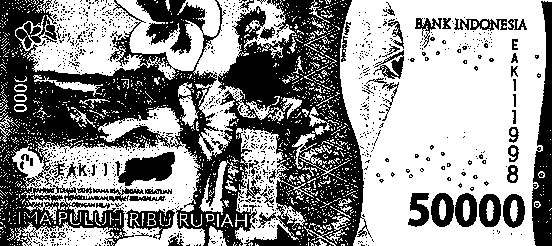

In [4]:
img = cv2.imread(r"D:\UNAIR\Semester_8\Skripsi\deteksi_nominal_vending_machine\datasetUang\50000\50k_b_2022_14.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
x = imageEnhancement(img)
x = imageSegmentation(x)

z = PIL.Image.fromarray(x)
print(z)

print(img.shape)

PIL.Image.fromarray(x)

In [12]:
arrayNomer = os.listdir(path)
dataset = "datasetPreprocessing"
from os import listdir,makedirs
from os.path import isfile,join

def preprocessing(path,dspath,nilaike):
  path = path #path
  dstpath = dataset #folder tujuan
  arrayNomer = os.listdir(path)
  n=nilaike

  try:
      makedirs(dstpath+'/'+arrayNomer[n])
  except:
      print ("Direktori sudah ada, citra akan di-replace dalam direktori yang sama")

  for dirs in path:
    #print(os.listdir(path))
    files = [f for f in listdir(path+'/'+arrayNomer[n]+'/') if isfile(join(path+'/'+arrayNomer[n]+'/',f))]
    for image in files:
      try:
            img = cv2.imread(os.path.join(path+'/'+arrayNomer[n]+'/',image))
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            file = join(dstpath+'/'+arrayNomer[n]+'/',image)
            enhance = imageEnhancement(gray)
            otsu = imageSegmentation(enhance)
            y = PIL.Image.fromarray(otsu)
            y.save(file) #menyimpan file
      except:
            print ("{} is not converted".format(image))

NotADirectoryError: [WinError 267] The directory name is invalid: 'datasetPreprocessing/1000/1k_b_2016_1.png'

In [14]:
for i in range (len(arrayNomer)):
  print("Berhasil me-load kelas",arrayNomer[i])
  preprocessing(path,dataset,i)

Berhasil me-load kelas 1000
Berhasil me-load kelas 10000
Berhasil me-load kelas 100000
Berhasil me-load kelas 2000
Berhasil me-load kelas 20000
Berhasil me-load kelas 5000
Berhasil me-load kelas 50000


In [13]:
import os

dataset="datasetPreprocessing"
def daftar_file(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))

daftar_file(dataset)

datasetPreprocessing/
    1000/
        1k_b_2016_1.png
        1k_b_2016_10.png
        1k_b_2016_11.png
        1k_b_2016_12.png
        1k_b_2016_13.png
        1k_b_2016_14.png
        1k_b_2016_15.png
        1k_b_2016_16.png
        1k_b_2016_17.png
        1k_b_2016_18.png
        1k_b_2016_19.png
        1k_b_2016_2.png
        1k_b_2016_20.png
        1k_b_2016_21.png
        1k_b_2016_22.png
        1k_b_2016_23.png
        1k_b_2016_24.png
        1k_b_2016_25.png
        1k_b_2016_3.png
        1k_b_2016_4.png
        1k_b_2016_5.png
        1k_b_2016_6.png
        1k_b_2016_7.png
        1k_b_2016_8.png
        1k_b_2016_9.png
        1k_b_2022_1.png
        1k_b_2022_10.png
        1k_b_2022_11.png
        1k_b_2022_12.png
        1k_b_2022_13.png
        1k_b_2022_14.png
        1k_b_2022_15.png
        1k_b_2022_16.png
        1k_b_2022_17.png
        1k_b_2022_18.png
        1k_b_2022_19.png
        1k_b_2022_2.png
        1k_b_2022_20.png
        1k_b_2022_21.png
    

In [7]:
!pip install split-folders

In [8]:
import splitfolders
splitfolders.ratio(dataset, output="datasetSplit", seed=1307, ratio=(0.7, 0.2, 0.1)) #70% : 10% : 20%

Copying files: 700 files [00:04, 142.82 files/s]


In [14]:
dataset = "datasetSplit"
daftar_file(dataset)

datasetSplit/
    test/
        1000/
            1k_b_2016_24.png
            1k_b_2022_23.png
            1k_b_2022_6.png
            1k_b_2022_8.png
            1k_d_2016_13.png
            1k_d_2016_15.png
            1k_d_2016_23.png
            1k_d_2016_8.png
            1k_d_2022_21.png
            1k_d_2022_22.png
        10000/
            10k_b_2016_24.png
            10k_b_2022_23.png
            10k_b_2022_6.png
            10k_b_2022_8.png
            10k_d_2016_13.png
            10k_d_2016_15.png
            10k_d_2016_23.png
            10k_d_2016_8.png
            10k_d_2022_21.png
            10k_d_2022_22.png
        100000/
            100k_b_2016_24.png
            100k_b_2022_23.png
            100k_b_2022_6.png
            100k_b_2022_8.png
            100k_d_2016_13.png
            100k_d_2016_15.png
            100k_d_2016_23.png
            100k_d_2016_8.png
            100k_d_2022_21.png
            100k_d_2022_22.png
        2000/
            2k_b_2016_24.p

In [5]:
import pandas as pd
import random
from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns

from keras.utils import plot_model
from sklearn.metrics import classification_report
from collections import Counter
import tensorflow as tf

import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications.vgg19 import VGG19

from keras import Model, layers
from keras.models import Sequential
from keras.optimizers import Adam, SGD
from keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dropout, Dense, Input, Conv2D, MaxPooling2D, Flatten,MaxPooling3D

In [6]:
IMAGE_SIZE = (130, 242, 3)
dataset="datasetSplit"
train_pred_test_folders = os.listdir(dataset)
train_path = dataset+'/train'
test_path = dataset+'/test'
val_path = dataset+'/val'

Banyak citra di training set: 490
Banyak citra di testing set: 70
Banyak citra di prediction set: 140
Total citra: 700


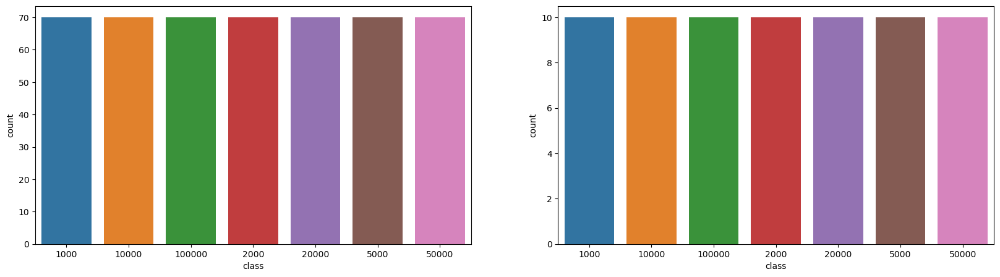

In [7]:
quantity_train = {} 
quantity_test = {}
quantity_val = {}
for folder in os.listdir(train_path):
    quantity_train[folder] = len(os.listdir(train_path+'/'+folder))

for folder in os.listdir(test_path):
    quantity_test[folder] = len(os.listdir(test_path+'/'+folder))

for folder in os.listdir(val_path):
    quantity_val[folder] = len(os.listdir(val_path+'/'+folder))

quantity_train = pd.DataFrame(list(quantity_train.items()), index=range(0,len(quantity_train)), columns=['class','count'])
quantity_test = pd.DataFrame(list(quantity_test.items()), index=range(0,len(quantity_test)), columns=['class','count'])
quantity_val = pd.DataFrame(list(quantity_val.items()), index=range(0,len(quantity_val)), columns=['class','count'])

figure, ax = plt.subplots(1,2,figsize=(20,5))
sns.barplot(x='class',y='count',data=quantity_train,ax=ax[0])
sns.barplot(x='class',y='count',data=quantity_test,ax=ax[1])

print("Banyak citra di training set:", sum(quantity_train['count'].values))
print("Banyak citra di testing set:",sum(quantity_test['count'].values))
print("Banyak citra di prediction set:",sum(quantity_val['count'].values))
print("Total citra:",sum(quantity_train['count'].values)+sum(quantity_test['count'].values)+sum(quantity_val['count'].values))

plt.show()

In [8]:
def save_history(i, history, model_name):
    #convert the history.history dict to a pandas DataFrame:     
    hist_df = pd.DataFrame(history.history) 

    # save ke json 
    hist_json_file = 'percobaan'+str(i)+'/'+model_name+'_history.json' 
    with open(hist_json_file, mode='w') as f:
        hist_df.to_json(f)

    # or save ke csv 
    hist_csv_file = 'percobaan'+str(i)+'/'+model_name+'_history.csv'
    with open(hist_csv_file, mode='w') as f:
        hist_df.to_csv(f)
        
def plot_accuracy_from_history(history, isinception=False):
  try:
    color = sns.color_palette()
    if(isinception == False):
        acc = history.history['acc']
        val_acc = history.history['val_acc']
    else:
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
    

    epochs = range(len(acc))

    sns.lineplot(epochs, acc, label='Training Accuracy')
    sns.lineplot(epochs, val_acc,label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.figure()
    plt.show()
  except TypeError:
    pass
    
def plot_loss_from_history(history):
  try:
    color = sns.color_palette()
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(loss))
    
    sns.lineplot(epochs, loss,label='Training Loss')
    sns.lineplot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.figure()
    plt.show()
  except TypeError:
    pass
    
def do_history_stuff(i, history, history_file_name, isinception=False):
    save_history(i, history, history_file_name)
    plot_accuracy_from_history(history, isinception)
    plot_loss_from_history(history)

In [9]:
def show_few_images(number_of_examples=2, predict_using_model=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(train_path)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(train_path)):
        image_ids = os.listdir(os.path.join(train_path,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            display = plt.imread(os.path.join(train_path,folder,image_ids[j]))
            plt.axis('off')
            ax1[axs].imshow(display)
            title = 'True:'+folder
            if(predict_using_model):
                predicted_classname = inv_map_classes[np.argmax(vgg19_final_model.predict(np.array([display])))]
                title = title+'\nPredict :'+predicted_classname
            ax1[axs].set_title(title)
            axs=axs+1

In [10]:
tf.keras.backend.clear_session()

In [11]:
import os
def savePercobaan(i):
  try: 
    os.mkdir("percobaan"+str(i)) 
  except OSError as error: 
    print(error)
  saveModel(i)

In [12]:
def saveModel(i):
  try: 
    os.mkdir("percobaan"+str(i)+"/model") 
  except OSError as error: 
    print(error)

 ## **VGG-19**
---
Visual Geometry Group (19 layers)

#### **<font color='Pink'>Data Generator</font>**

In [13]:
#normalisasi
train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
train_generator19 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
test_generator19 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
    batch_size=1,
    shuffle=True,
    class_mode='categorical')

validation_generator19 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.


In [14]:
inv_map_classes = {v: k for k, v in validation_generator19.class_indices.items()}
#print(validation_generator16.class_indices)
print(inv_map_classes)

{0: '1000', 1: '10000', 2: '100000', 3: '2000', 4: '20000', 5: '5000', 6: '50000'}


#### **<font color='Pink'>Hyperparameter</font>**

In [15]:
import itertools
import random

array = [['ep1','ep2','ep3','ep4'], ['lr1', 'lr2', 'lr3', 'lr4'], [32, 64, 128], ['dr1', 'dr2', 'dr3', 'dr4']]

parameter = []
lr_values = array[1][1:]  

for _ in range(1):
    updated_array = [array[0], ['lr1'] + lr_values, array[2], array[3]]
    parameter.extend(list(itertools.product(*updated_array)))

parameter = [
    [
        random.randint(30, 38) if val == 'ep1' else
        random.randint(39, 47) if val == 'ep2' else
        random.randint(48, 56) if val == 'ep3' else
        random.randint(57, 65) if val == 'ep4' else

        random.uniform(0.0001, 0.0250249) if val == 'lr1' else
        random.uniform(0.025025, 0.050049) if val == 'lr2' else
        random.uniform(0.05005, 0.0750749) if val == 'lr3' else
        random.uniform(0.075075, 0.1) if val == 'lr4' else

        random.uniform(0.5,0.5749) if val == 'dr1' else
        random.uniform(0.575,0.649) if val == 'dr2' else
        random.uniform(0.65,0.7249) if val == 'dr3' else
        random.uniform(0.725,0.8) if val == 'dr4' else

        val
        for val in kombinasi
    ]
    for kombinasi in parameter
]

In [16]:
for kombinasi in parameter:
    print(kombinasi)

[38, 0.008091167009830105, 32, 0.5419877972941181]
[35, 0.009141642728805499, 32, 0.598076527104569]
[36, 0.01399578283204896, 32, 0.7230332111729043]
[37, 0.010518107449006706, 32, 0.7835187937017754]
[36, 0.006573129025408061, 64, 0.5492924047241969]
[31, 0.0005257259755607363, 64, 0.600875243648661]
[34, 0.007094767746353315, 64, 0.696007014083984]
[36, 0.014022766361996312, 64, 0.791413068637484]
[33, 0.013839748515537858, 128, 0.5464084351090459]
[36, 0.010915037738206325, 128, 0.6055433555365354]
[33, 0.013548479337994104, 128, 0.6700164910413624]
[34, 0.0033090079803823336, 128, 0.7891173560089916]
[33, 0.0355422845986154, 32, 0.5471474047972095]
[38, 0.031967579108507414, 32, 0.6178240584133471]
[33, 0.03427600628538534, 32, 0.6588463204462179]
[36, 0.03162076160702325, 32, 0.7921273863880378]
[36, 0.04382852000953303, 64, 0.5122864975465224]
[38, 0.03106492302523243, 64, 0.6182991234435175]
[33, 0.032916506371769905, 64, 0.7105989956759106]
[36, 0.029555851628528244, 64, 0.770

#### **<font color='Pink'>Model Training</font>**

In [18]:
from keras.layers import BatchNormalization
def vgg19_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate):
  vgg19_model = VGG19(pooling='max',input_shape = (130, 242, 3), weights = 'imagenet', include_top = False)
  for layers in vgg19_model.layers:
              layers.trainable=False

  last_output_vgg19 = vgg19_model.layers[-1].output
  vgg_19 = Flatten()(last_output_vgg19) #awalnya di bawah last output
  vgg_19 = BatchNormalization()(vgg_19)
  vgg_19 = Dense(128, activation = 'relu')(vgg_19)
  vgg_19 = BatchNormalization()(vgg_19)
  vgg_19 = Dropout(dropout_rate)(vgg_19)
  vgg_19 = Dense(7, activation = 'softmax')(vgg_19)
  vgg19_final_model = Model(vgg19_model.input, vgg_19)
  
  opt = Adam(learning_rate=learning_rate)
  vgg19_final_model.compile(loss = 'categorical_crossentropy', optimizer= opt, metrics=['acc'])
  #vgg19_final_model.summary()

  plot_model(model=vgg19_final_model, show_shapes=True)
  train_generator19.batch_size = batch_size

  vgg19_filepath = 'percobaan'+str(i)+'/model/vgg_19_'+str(i)+'-saved-model-{epoch:02d}-acc-{val_acc:.2f}.hdf5'
  vgg19_checkpoint = tf.keras.callbacks.ModelCheckpoint(vgg19_filepath, monitor='val_acc', verbose=1,
                                                         save_best_only=True, mode='max')
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
  vgg19_history = vgg19_final_model.fit(train_generator19, epochs = vgg_epoch,
                  validation_data = validation_generator19,callbacks=[vgg19_checkpoint,early_stopping],verbose=1)

  do_history_stuff(i, vgg19_history, 'vgg19_model')
  save_vgg19(i, vgg19_final_model)

  predictionTest(i, vgg19_final_model)

  return(vgg19_final_model)

In [19]:
def save_vgg19(i, vgg19_final_model):
  vgg19_final_model.save(('percobaan'+str(i)+'/vgg19-model'+str(i)+'.h5'))

#### **<font color='Pink'>Evaluation</font>**

In [20]:
def acc_plot(vgg19_history):
  plt.figure(figsize=(10, 8))
  plt.plot(vgg19_history.history['acc'], label='train acc')
  plt.plot(vgg19_history.history['val_acc'], label='val acc')
  plt.legend()
  plt.title('Accuracy')
  plt.show()

In [21]:
def loss_plot(vgg19_history):
  plt.figure(figsize=(10, 8))
  plt.plot(vgg19_history.history['loss'], label='train loss')
  plt.plot(vgg19_history.history['val_loss'], label='val loss')
  plt.legend()
  plt.title('Loss')
  plt.show()

In [22]:
def predictionTest(i, vgg19_final_model):
  true_value = []
  vgg_pred = []
  for folder in os.listdir(test_path):
      test_image_ids = os.listdir(os.path.join(test_path,folder))
      
      for image_id in test_image_ids[:int(len(test_image_ids))]:
          path = os.path.join(test_path,folder,image_id)
          #print(path)
          true_value.append(test_generator19.class_indices[folder])
          img = cv2.resize(cv2.imread(path),(242,130))
          img_normalized = img/255
          #vgg
          vgg19_image_prediction = np.argmax(vgg19_final_model.predict(np.array([img_normalized]), verbose = 0)) #verbose biar gak ngeprint
          vgg_pred.append(vgg19_image_prediction)

  print("\n")
  clf_report(i, true_value, vgg_pred)

In [23]:
arr_accuracy19 = []
from sklearn.metrics import confusion_matrix
import itertools
#from mlxtend.plotting import plot_confusion_matrix
def clf_report(k, true_value, model_pred):
    classes = validation_generator19.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)
    arr_accuracy19.append(model_accuracy)
    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass
    
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass
    
    plt.savefig("percobaan"+str(k)+"/conf_matrix"+str(k)+".png")
    print(classification_report(true_value, model_pred, target_names = list(classes)))

In [24]:
hasilTabel = pd.DataFrame(columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate','Accuracy'])
print(hasilTabel)

Empty DataFrame
Columns: [Epoch, Learning Rate, Batch Size, Dropout Rate, Accuracy]
Index: []


#### **<font color='Pink'>Code Running</font>**

[WinError 183] Cannot create a file when that file already exists: 'percobaan1'
[WinError 183] Cannot create a file when that file already exists: 'percobaan1/model'
Percobaan ke- 1 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.010647876363902702
batch size: 32
dropout rate: 0.5688405970578785
────────────────────────────────────────────────────────────────────────────────────────────────────
80134624/80134624 [==============================] - 38s 0us/step
Epoch 1/32
16/16 [==============================] - ETA: 0s - loss: 2.4445 - acc: 0.3000
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan1/model\vgg_16_1-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.4445 - acc: 0.3000 - val_loss: 3.3396 - val_acc: 0.1643
Epoch 2/32
16/16 [==============================] - ETA: 0s - loss: 1.3696 - acc: 0.5163
Epoch 2: val_acc improved from 0.1

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 2 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.006615418617340737
batch size: 32
dropout rate: 0.6032288326319954
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/35
16/16 [==============================] - ETA: 0s - loss: 2.4728 - acc: 0.3184
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan2/model\vgg_16_2-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 64s 4s/step - loss: 2.4728 - acc: 0.3184 - val_loss: 2.4244 - val_acc: 0.2143
Epoch 2/35
16/16 [==============================] - ETA: 0s - loss: 1.3856 - acc: 0.5469
Epoch 2: val_acc improved from 0.21429 to 0.34286, saving model to percobaan2/model\vgg_16_2-saved-model-02-acc-0.34.hdf5
16/16 [==============================] - 61

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/35
16/16 [==============================] - ETA: 0s - loss: 2.7115 - acc: 0.2898
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan3/model\vgg_16_3-saved-model-01-acc-0.18.hdf5
16/16 [==============================] - 66s 4s/step - loss: 2.7115 - acc: 0.2898 - val_loss: 3.2619 - val_acc: 0.1786
Epoch 2/35
16/16 [==============================] - ETA: 0s - loss: 1.7058 - acc: 0.4306
Epoch 2: val_acc improved from 0.17857 to 0.37143, saving model to percobaan3/model\vgg_16_3-saved-model-02-acc-0.37.hdf5
16/16 [==============================] - 58s 4s/step - loss: 1.7058 - acc: 0.4306 - val_loss: 2.3920 - val_acc: 0.3714
Epoch 3/35
16/16 [==============================] - ETA: 0s - loss: 1.4092 - acc: 0.5102
Epoch 3: val_acc did not improve from 0.37143
16/16 [==============================] - 64s 4s/step - loss: 1.4092 - acc: 0.5102 - val_loss: 1.8606 - val_acc: 0.3714
Epoch 4/35
16/16 [==============================] - ETA: 0s - loss: 1.1801 - acc: 0.5796


C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/36
16/16 [==============================] - ETA: 0s - loss: 3.2624 - acc: 0.2408
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan4/model\vgg_16_4-saved-model-01-acc-0.28.hdf5
16/16 [==============================] - 65s 4s/step - loss: 3.2624 - acc: 0.2408 - val_loss: 3.2791 - val_acc: 0.2786
Epoch 2/36
16/16 [==============================] - ETA: 0s - loss: 1.9080 - acc: 0.3857
Epoch 2: val_acc improved from 0.27857 to 0.40714, saving model to percobaan4/model\vgg_16_4-saved-model-02-acc-0.41.hdf5
16/16 [==============================] - 64s 4s/step - loss: 1.9080 - acc: 0.3857 - val_loss: 2.1464 - val_acc: 0.4071
Epoch 3/36
16/16 [==============================] - ETA: 0s - loss: 1.6570 - acc: 0.4653
Epoch 3: val_acc improved from 0.40714 to 0.45000, saving model to percobaan4/model\vgg_16_4-saved-model-03-acc-0.45.hdf5
16/16 [==============================] - 61s 4s/step - loss: 1.6570 - acc: 0.4653 - val_loss: 1.7896 - val_acc: 0.4500
Epoch 4/36
16

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 5 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.014715257206717796
batch size: 64
dropout rate: 0.5375690848970763
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/35
8/8 [==============================] - ETA: 0s - loss: 2.3189 - acc: 0.3163
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan5/model\vgg_16_5-saved-model-01-acc-0.17.hdf5
8/8 [==============================] - 67s 8s/step - loss: 2.3189 - acc: 0.3163 - val_loss: 3.5445 - val_acc: 0.1714
Epoch 2/35
8/8 [==============================] - ETA: 0s - loss: 1.3393 - acc: 0.5592
Epoch 2: val_acc improved from 0.17143 to 0.30714, saving model to percobaan5/model\vgg_16_5-saved-model-02-acc-0.31.hdf5
8/8 [==============================] - 58s 8s/ste

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.33      1.00      0.50        10
       50000       0.27      1.00      0.43        10

    accuracy                           0.33        70
   macro avg       0.51      0.33      0.21        70
weighted avg       0.51      0.33      0.21        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 6 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.011953373495846095
batch size: 64
dropout rate: 0.6350968422156136
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
8/8 [==============================] - ETA: 0s - loss: 2.6332 - acc: 0.2816
Epoch 1: val_acc improved from -inf to 0.33571, saving model to percobaan7/model\vgg_16_7-saved-model-01-acc-0.34.hdf5
8/8 [==============================] - 72s 9s/step - loss: 2.6332 - acc: 0.2816 - val_loss: 2.7544 - val_acc: 0.3357
Epoch 2/37
8/8 [==============================] - ETA: 0s - loss: 1.6296 - acc: 0.4510
Epoch 2: val_acc improved from 0.33571 to 0.37857, saving model to percobaan7/model\vgg_16_7-saved-model-02-acc-0.38.hdf5
8/8 [==============================] - 58s 8s/step - loss: 1.6296 - acc: 0.4510 - val_loss: 2.0584 - val_acc: 0.3786
Epoch 3/37
8/8 [==============================] - ETA: 0s - loss: 1.2973 - acc: 0.5204
Epoch 3: val_acc did not improve from 0.37857
8/8 [==============================] - 63s 8s/step - loss: 1.2973 - acc: 0.5204 - val_loss: 2.7857 - val_acc: 0.3786
Epoch 4/37
8/8 [==============================] - ETA: 0s - loss: 1.0696 - acc: 0.6286
Epoch 4: val_a

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 8 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.007047361221139139
batch size: 64
dropout rate: 0.7729046995679296
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/35
8/8 [==============================] - ETA: 0s - loss: 3.4062 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan8/model\vgg_16_8-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 60s 8s/step - loss: 3.4062 - acc: 0.2163 - val_loss: 2.5687 - val_acc: 0.2357
Epoch 2/35
8/8 [==============================] - ETA: 0s - loss: 2.1769 - acc: 0.3735
Epoch 2: val_acc improved from 0.23571 to 0.30000, saving model to percobaan8/model\vgg_16_8-saved-model-02-acc-0.30.hdf5
8/8 [==============================] - 58s 8s/ste

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/31
4/4 [==============================] - ETA: 0s - loss: 2.5236 - acc: 0.2959
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan9/model\vgg_16_9-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 43s 11s/step - loss: 2.5236 - acc: 0.2959 - val_loss: 4.7614 - val_acc: 0.1429
Epoch 2/31
4/4 [==============================] - ETA: 0s - loss: 1.1056 - acc: 0.5980
Epoch 2: val_acc improved from 0.14286 to 0.19286, saving model to percobaan9/model\vgg_16_9-saved-model-02-acc-0.19.hdf5
4/4 [==============================] - 42s 12s/step - loss: 1.1056 - acc: 0.5980 - val_loss: 4.0969 - val_acc: 0.1929
Epoch 3/31
4/4 [==============================] - ETA: 0s - loss: 0.9099 - acc: 0.6551
Epoch 3: val_acc improved from 0.19286 to 0.31429, saving model to percobaan9/model\vgg_16_9-saved-model-03-acc-0.31.hdf5
4/4 [==============================] - 41s 11s/step - loss: 0.9099 - acc: 0.6551 - val_loss: 4.0262 - val_acc: 0.3143
Epoch 4/31
4/4 [======

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.40      0.57        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.43      0.90      0.58        10
       50000       0.22      1.00      0.36        10

    accuracy                           0.33        70
   macro avg       0.24      0.33      0.22        70
weighted avg       0.24      0.33      0.22        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 10 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 33
learning rate: 0.004445381805406045
batch size: 128
dropout rate: 0.5770112616909686
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       1.00      0.10      0.18        10
       50000       0.15      1.00      0.26        10

    accuracy                           0.17        70
   macro avg       0.31      0.17      0.09        70
weighted avg       0.31      0.17      0.09        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 11 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 38
learning rate: 0.02091038639578121
batch size: 128
dropout rate: 0.6794568422861982
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.64      0.70      0.67        10
       50000       0.17      1.00      0.29        10

    accuracy                           0.24        70
   macro avg       0.12      0.24      0.14        70
weighted avg       0.12      0.24      0.14        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 12 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.024048361885933293
batch size: 128
dropout rate: 0.7964775811018017
───────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
16/16 [==============================] - ETA: 0s - loss: 2.5654 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan13/model\vgg_16_13-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.5654 - acc: 0.2980 - val_loss: 12.1990 - val_acc: 0.1429
Epoch 2/37
16/16 [==============================] - ETA: 0s - loss: 1.7011 - acc: 0.4571
Epoch 2: val_acc improved from 0.14286 to 0.24286, saving model to percobaan13/model\vgg_16_13-saved-model-02-acc-0.24.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.7011 - acc: 0.4571 - val_loss: 3.5900 - val_acc: 0.2429
Epoch 3/37
16/16 [==============================] - ETA: 0s - loss: 1.3400 - acc: 0.5429
Epoch 3: val_acc improved from 0.24286 to 0.33571, saving model to percobaan13/model\vgg_16_13-saved-model-03-acc-0.34.hdf5
16/16 [==============================] - 52s 3s/step - loss: 1.3400 - acc: 0.5429 - val_loss: 2.3837 - val_acc: 0.3357
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 14 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.04730463398506036
batch size: 32
dropout rate: 0.6371005465137157
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/32
16/16 [==============================] - ETA: 0s - loss: 3.3553 - acc: 0.2367
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan14/model\vgg_16_14-saved-model-01-acc-0.18.hdf5
16/16 [==============================] - 42s 3s/step - loss: 3.3553 - acc: 0.2367 - val_loss: 8.0138 - val_acc: 0.1786
Epoch 2/32
16/16 [==============================] - ETA: 0s - loss: 2.2840 - acc: 0.3571
Epoch 2: val_acc did not improve from 0.17857
16/16 [==============================] - 40s 3s/step - loss: 2.2840 - acc: 0.3571 - val_loss: 4.3959 - val_acc: 0.164

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/32
16/16 [==============================] - ETA: 0s - loss: 3.2842 - acc: 0.2531
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan15/model\vgg_16_15-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 44s 3s/step - loss: 3.2842 - acc: 0.2531 - val_loss: 4.9097 - val_acc: 0.2071
Epoch 2/32
16/16 [==============================] - ETA: 0s - loss: 2.2882 - acc: 0.3735
Epoch 2: val_acc improved from 0.20714 to 0.32857, saving model to percobaan15/model\vgg_16_15-saved-model-02-acc-0.33.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.2882 - acc: 0.3735 - val_loss: 2.3695 - val_acc: 0.3286
Epoch 3/32
16/16 [==============================] - ETA: 0s - loss: 1.7140 - acc: 0.4265
Epoch 3: val_acc did not improve from 0.32857
16/16 [==============================] - 45s 3s/step - loss: 1.7140 - acc: 0.4265 - val_loss: 2.0455 - val_acc: 0.3143
Epoch 4/32
16/16 [==============================] - ETA: 0s - loss: 1.3169 - acc: 0.5

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
16/16 [==============================] - ETA: 0s - loss: 3.4684 - acc: 0.2286
Epoch 1: val_acc improved from -inf to 0.32143, saving model to percobaan16/model\vgg_16_16-saved-model-01-acc-0.32.hdf5
16/16 [==============================] - 58s 4s/step - loss: 3.4684 - acc: 0.2286 - val_loss: 3.7265 - val_acc: 0.3214
Epoch 2/37
16/16 [==============================] - ETA: 0s - loss: 2.4536 - acc: 0.3000
Epoch 2: val_acc did not improve from 0.32143
16/16 [==============================] - 53s 3s/step - loss: 2.4536 - acc: 0.3000 - val_loss: 3.9749 - val_acc: 0.1643
Epoch 3/37
16/16 [==============================] - ETA: 0s - loss: 2.1303 - acc: 0.3816
Epoch 3: val_acc improved from 0.32143 to 0.47143, saving model to percobaan16/model\vgg_16_16-saved-model-03-acc-0.47.hdf5
16/16 [==============================] - 50s 3s/step - loss: 2.1303 - acc: 0.3816 - val_loss: 1.5709 - val_acc: 0.4714
Epoch 4/37
16/16 [==============================] - ETA: 0s - loss: 1.7359 - acc: 0.3

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 2.3568 - acc: 0.3184
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan17/model\vgg_16_17-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 43s 5s/step - loss: 2.3568 - acc: 0.3184 - val_loss: 3.5219 - val_acc: 0.2429
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 1.3896 - acc: 0.5163
Epoch 2: val_acc improved from 0.24286 to 0.27143, saving model to percobaan17/model\vgg_16_17-saved-model-02-acc-0.27.hdf5
8/8 [==============================] - 52s 7s/step - loss: 1.3896 - acc: 0.5163 - val_loss: 5.5726 - val_acc: 0.2714
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 1.1464 - acc: 0.6224
Epoch 3: val_acc improved from 0.27143 to 0.44286, saving model to percobaan17/model\vgg_16_17-saved-model-03-acc-0.44.hdf5
8/8 [==============================] - 53s 7s/step - loss: 1.1464 - acc: 0.6224 - val_loss: 2.3329 - val_acc: 0.4429
Epoch 4/30
8/8 [===

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.30      0.46        10
        2000       0.00      0.00      0.00        10
       20000       0.33      1.00      0.50        10
        5000       1.00      0.90      0.95        10
       50000       0.38      0.90      0.53        10

    accuracy                           0.50        70
   macro avg       0.67      0.50      0.44        70
weighted avg       0.67      0.50      0.44        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 18 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.041588031504863815
batch size: 64
dropout rate: 0.6208680520438749
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.42      0.80      0.55        10
       50000       0.20      1.00      0.34        10

    accuracy                           0.29        70
   macro avg       0.38      0.29      0.18        70
weighted avg       0.38      0.29      0.18        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 19 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.04266914172397808
batch size: 64
dropout rate: 0.7004687273955619
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
8/8 [==============================] - ETA: 0s - loss: 3.2076 - acc: 0.2510
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan20/model\vgg_16_20-saved-model-01-acc-0.28.hdf5
8/8 [==============================] - 57s 7s/step - loss: 3.2076 - acc: 0.2510 - val_loss: 6.0937 - val_acc: 0.2786
Epoch 2/37
8/8 [==============================] - ETA: 0s - loss: 2.6591 - acc: 0.3000
Epoch 2: val_acc did not improve from 0.27857
8/8 [==============================] - 52s 7s/step - loss: 2.6591 - acc: 0.3000 - val_loss: 6.4915 - val_acc: 0.1500
Epoch 3/37
8/8 [==============================] - ETA: 0s - loss: 2.1514 - acc: 0.3653
Epoch 3: val_acc did not improve from 0.27857
8/8 [==============================] - 54s 7s/step - loss: 2.1514 - acc: 0.3653 - val_loss: 2.9972 - val_acc: 0.2500
Epoch 4/37
8/8 [==============================] - ETA: 0s - loss: 1.6972 - acc: 0.4286
Epoch 4: val_acc improved from 0.27857 to 0.35000, saving model to percobaan20/model\vgg

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/31
4/4 [==============================] - ETA: 0s - loss: 2.5378 - acc: 0.2878
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan21/model\vgg_16_21-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 47s 12s/step - loss: 2.5378 - acc: 0.2878 - val_loss: 12.5476 - val_acc: 0.1429
Epoch 2/31
4/4 [==============================] - ETA: 0s - loss: 1.3853 - acc: 0.4898
Epoch 2: val_acc improved from 0.14286 to 0.25000, saving model to percobaan21/model\vgg_16_21-saved-model-02-acc-0.25.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.3853 - acc: 0.4898 - val_loss: 4.8630 - val_acc: 0.2500
Epoch 3/31
4/4 [==============================] - ETA: 0s - loss: 1.0151 - acc: 0.6347
Epoch 3: val_acc improved from 0.25000 to 0.27857, saving model to percobaan21/model\vgg_16_21-saved-model-03-acc-0.28.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.0151 - acc: 0.6347 - val_loss: 4.8308 - val_acc: 0.2786
Epoch 4/31
4/4 

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\1034606324.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,7))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(aver

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.67      0.40      0.50        10
       50000       0.16      1.00      0.27        10

    accuracy                           0.20        70
   macro avg       0.12      0.20      0.11        70
weighted avg       0.12      0.20      0.11        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 22 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 33
learning rate: 0.02943277564142893
batch size: 128
dropout rate: 0.588213188885463
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.60      0.60      0.60        10
       10000       0.78      0.70      0.74        10
      100000       0.00      0.00      0.00        10
        2000       0.67      0.60      0.63        10
       20000       1.00      0.50      0.67        10
        5000       0.71      0.50      0.59        10
       50000       0.33      1.00      0.50        10

    accuracy                           0.56        70
   macro avg       0.58      0.56      0.53        70
weighted avg       0.58      0.56      0.53        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 23 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.02930375421126139
batch size: 128
dropout rate: 0.6573365948020528
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.75      0.30      0.43        10
       50000       0.16      1.00      0.27        10

    accuracy                           0.21        70
   macro avg       0.42      0.21      0.15        70
weighted avg       0.42      0.21      0.15        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 24 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.025271235577383377
batch size: 128
dropout rate: 0.7449218444965954
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.20      0.33        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.20      0.29        10
        5000       0.33      1.00      0.50        10
       50000       0.30      1.00      0.47        10

    accuracy                           0.36        70
   macro avg       0.45      0.36      0.25        70
weighted avg       0.45      0.36      0.25        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 25 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.06583921138644055
batch size: 32
dropout rate: 0.5426352260156394
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.60      0.75        10
        2000       0.38      0.60      0.46        10
       20000       0.00      0.00      0.00        10
        5000       1.00      0.20      0.33        10
       50000       0.23      1.00      0.37        10

    accuracy                           0.37        70
   macro avg       0.51      0.37      0.32        70
weighted avg       0.51      0.37      0.32        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 26 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.072130880770192
batch size: 32
dropout rate: 0.5881928715815877
───────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.53      1.00      0.69        10
      100000       1.00      0.80      0.89        10
        2000       0.83      0.50      0.62        10
       20000       0.57      0.80      0.67        10
        5000       0.53      1.00      0.69        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.64        70
   macro avg       0.64      0.64      0.59        70
weighted avg       0.64      0.64      0.59        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 27 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.06556032262427937
batch size: 32
dropout rate: 0.6614356541394194
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/32
16/16 [==============================] - ETA: 0s - loss: 4.0194 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.28571, saving model to percobaan28/model\vgg_16_28-saved-model-01-acc-0.29.hdf5
16/16 [==============================] - 42s 3s/step - loss: 4.0194 - acc: 0.2163 - val_loss: 5.0682 - val_acc: 0.2857
Epoch 2/32
16/16 [==============================] - ETA: 0s - loss: 2.9421 - acc: 0.3020
Epoch 2: val_acc did not improve from 0.28571
16/16 [==============================] - 40s 3s/step - loss: 2.9421 - acc: 0.3020 - val_loss: 3.3905 - val_acc: 0.2357
Epoch 3/32
16/16 [==============================] - ETA: 0s - loss: 2.0322 - acc: 0.3388
Epoch 3: val_acc did not improve from 0.28571
16/16 [==============================] - 41s 3s/step - loss: 2.0322 - acc: 0.3388 - val_loss: 2.9953 - val_acc: 0.1429
Epoch 4/32
16/16 [==============================] - ETA: 0s - loss: 1.7816 - acc: 0.3653
Epoch 4: val_acc did not improve from 0.28571
16/16 [=====================

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/38
8/8 [==============================] - ETA: 0s - loss: 2.8932 - acc: 0.2735
Epoch 1: val_acc improved from -inf to 0.37857, saving model to percobaan29/model\vgg_16_29-saved-model-01-acc-0.38.hdf5
8/8 [==============================] - 43s 5s/step - loss: 2.8932 - acc: 0.2735 - val_loss: 5.8544 - val_acc: 0.3786
Epoch 2/38
8/8 [==============================] - ETA: 0s - loss: 2.0627 - acc: 0.4143
Epoch 2: val_acc did not improve from 0.37857
8/8 [==============================] - 41s 5s/step - loss: 2.0627 - acc: 0.4143 - val_loss: 7.6760 - val_acc: 0.2929
Epoch 3/38
8/8 [==============================] - ETA: 0s - loss: 1.6123 - acc: 0.4980
Epoch 3: val_acc did not improve from 0.37857
8/8 [==============================] - 41s 5s/step - loss: 1.6123 - acc: 0.4980 - val_loss: 5.9939 - val_acc: 0.3286
Epoch 4/38
8/8 [==============================] - ETA: 0s - loss: 1.2308 - acc: 0.5776
Epoch 4: val_acc did not improve from 0.37857
8/8 [==============================] - 41s

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/35
8/8 [==============================] - ETA: 0s - loss: 3.2710 - acc: 0.2204
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan30/model\vgg_16_30-saved-model-01-acc-0.16.hdf5
8/8 [==============================] - 45s 6s/step - loss: 3.2710 - acc: 0.2204 - val_loss: 7.1075 - val_acc: 0.1643
Epoch 2/35
8/8 [==============================] - ETA: 0s - loss: 2.3554 - acc: 0.3510
Epoch 2: val_acc did not improve from 0.16429
8/8 [==============================] - 43s 6s/step - loss: 2.3554 - acc: 0.3510 - val_loss: 7.3095 - val_acc: 0.1429
Epoch 3/35
8/8 [==============================] - ETA: 0s - loss: 1.8610 - acc: 0.4265
Epoch 3: val_acc improved from 0.16429 to 0.28571, saving model to percobaan30/model\vgg_16_30-saved-model-03-acc-0.29.hdf5
8/8 [==============================] - 44s 6s/step - loss: 1.8610 - acc: 0.4265 - val_loss: 2.6474 - val_acc: 0.2857
Epoch 4/35
8/8 [==============================] - ETA: 0s - loss: 1.4665 - acc: 0.5041
Epoch 4: v

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
8/8 [==============================] - ETA: 0s - loss: 3.0946 - acc: 0.2367
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan31/model\vgg_16_31-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 45s 6s/step - loss: 3.0946 - acc: 0.2367 - val_loss: 14.4152 - val_acc: 0.1857
Epoch 2/37
8/8 [==============================] - ETA: 0s - loss: 2.1624 - acc: 0.3714
Epoch 2: val_acc did not improve from 0.18571
8/8 [==============================] - 43s 5s/step - loss: 2.1624 - acc: 0.3714 - val_loss: 7.9822 - val_acc: 0.1786
Epoch 3/37
8/8 [==============================] - ETA: 0s - loss: 1.6891 - acc: 0.4735
Epoch 3: val_acc improved from 0.18571 to 0.23571, saving model to percobaan31/model\vgg_16_31-saved-model-03-acc-0.24.hdf5
8/8 [==============================] - 43s 6s/step - loss: 1.6891 - acc: 0.4735 - val_loss: 5.2367 - val_acc: 0.2357
Epoch 4/37
8/8 [==============================] - ETA: 0s - loss: 1.4295 - acc: 0.4878
Epoch 4: 

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/34
8/8 [==============================] - ETA: 0s - loss: 3.8893 - acc: 0.1918
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan32/model\vgg_16_32-saved-model-01-acc-0.26.hdf5
8/8 [==============================] - 43s 5s/step - loss: 3.8893 - acc: 0.1918 - val_loss: 9.6802 - val_acc: 0.2571
Epoch 2/34
8/8 [==============================] - ETA: 0s - loss: 3.2762 - acc: 0.2776
Epoch 2: val_acc improved from 0.25714 to 0.30714, saving model to percobaan32/model\vgg_16_32-saved-model-02-acc-0.31.hdf5
8/8 [==============================] - 41s 5s/step - loss: 3.2762 - acc: 0.2776 - val_loss: 6.7866 - val_acc: 0.3071
Epoch 3/34
8/8 [==============================] - ETA: 0s - loss: 2.2944 - acc: 0.3673
Epoch 3: val_acc did not improve from 0.30714
8/8 [==============================] - 41s 5s/step - loss: 2.2944 - acc: 0.3673 - val_loss: 3.6341 - val_acc: 0.2857
Epoch 4/34
8/8 [==============================] - ETA: 0s - loss: 1.8813 - acc: 0.3694
Epoch 4: v

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/35
4/4 [==============================] - ETA: 0s - loss: 2.6889 - acc: 0.2776
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan33/model\vgg_16_33-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 46s 11s/step - loss: 2.6889 - acc: 0.2776 - val_loss: 11.8220 - val_acc: 0.1429
Epoch 2/35
4/4 [==============================] - ETA: 0s - loss: 1.8676 - acc: 0.4163
Epoch 2: val_acc did not improve from 0.14286
4/4 [==============================] - 41s 11s/step - loss: 1.8676 - acc: 0.4163 - val_loss: 17.2445 - val_acc: 0.1429
Epoch 3/35
4/4 [==============================] - ETA: 0s - loss: 1.3915 - acc: 0.5224
Epoch 3: val_acc improved from 0.14286 to 0.25000, saving model to percobaan33/model\vgg_16_33-saved-model-03-acc-0.25.hdf5
4/4 [==============================] - 40s 11s/step - loss: 1.3915 - acc: 0.5224 - val_loss: 7.7306 - val_acc: 0.2500
Epoch 4/35
4/4 [==============================] - ETA: 0s - loss: 1.0747 - acc: 0.6265
Epoch

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.55      0.60      0.57        10
       10000       0.50      0.50      0.50        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.45      1.00      0.62        10
        5000       0.42      0.80      0.55        10
       50000       0.62      0.50      0.56        10

    accuracy                           0.49        70
   macro avg       0.36      0.49      0.40        70
weighted avg       0.36      0.49      0.40        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 34 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 31
learning rate: 0.05042230669706474
batch size: 128
dropout rate: 0.6341262252972061
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/37
4/4 [==============================] - ETA: 0s - loss: 3.1549 - acc: 0.2408
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan35/model\vgg_16_35-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 42s 11s/step - loss: 3.1549 - acc: 0.2408 - val_loss: 12.0628 - val_acc: 0.1500
Epoch 2/37
4/4 [==============================] - ETA: 0s - loss: 2.0832 - acc: 0.3714
Epoch 2: val_acc improved from 0.15000 to 0.21429, saving model to percobaan35/model\vgg_16_35-saved-model-02-acc-0.21.hdf5
4/4 [==============================] - 40s 11s/step - loss: 2.0832 - acc: 0.3714 - val_loss: 10.8442 - val_acc: 0.2143
Epoch 3/37
4/4 [==============================] - ETA: 0s - loss: 1.9065 - acc: 0.4184
Epoch 3: val_acc did not improve from 0.21429
4/4 [==============================] - 41s 11s/step - loss: 1.9065 - acc: 0.4184 - val_loss: 8.2941 - val_acc: 0.2143
Epoch 4/37
4/4 [==============================] - ETA: 0s - loss: 1.4086 - acc: 0.5265
Epoch

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.20      0.33        10
        5000       0.57      0.80      0.67        10
       50000       0.20      1.00      0.34        10

    accuracy                           0.36        70
   macro avg       0.54      0.36      0.30        70
weighted avg       0.54      0.36      0.30        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 36 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.07307340984346342
batch size: 128
dropout rate: 0.7473472949584041
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       0.83      0.50      0.62        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.40      1.00      0.57        10
        5000       0.40      1.00      0.57        10
       50000       0.67      0.60      0.63        10

    accuracy                           0.51        70
   macro avg       0.61      0.51      0.45        70
weighted avg       0.61      0.51      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 37 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.07787225307929421
batch size: 32
dropout rate: 0.5015508502036361
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.20      0.50      0.29        10
       10000       1.00      0.20      0.33        10
      100000       0.82      0.90      0.86        10
        2000       0.38      0.90      0.53        10
       20000       0.67      0.20      0.31        10
        5000       0.40      0.20      0.27        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.41        70
   macro avg       0.49      0.41      0.37        70
weighted avg       0.49      0.41      0.37        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 38 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 31
learning rate: 0.09333202768773452
batch size: 32
dropout rate: 0.5969800204917374
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/31
16/16 [==============================] - ETA: 0s - loss: 4.3370 - acc: 0.2592
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan39/model\vgg_16_39-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 43s 3s/step - loss: 4.3370 - acc: 0.2592 - val_loss: 14.7924 - val_acc: 0.1429
Epoch 2/31
16/16 [==============================] - ETA: 0s - loss: 2.9350 - acc: 0.2918
Epoch 2: val_acc improved from 0.14286 to 0.15000, saving model to percobaan39/model\vgg_16_39-saved-model-02-acc-0.15.hdf5
16/16 [==============================] - 42s 3s/step - loss: 2.9350 - acc: 0.2918 - val_loss: 4.4240 - val_acc: 0.1500
Epoch 3/31
16/16 [==============================] - ETA: 0s - loss: 2.2006 - acc: 0.3449
Epoch 3: val_acc improved from 0.15000 to 0.18571, saving model to percobaan39/model\vgg_16_39-saved-model-03-acc-0.19.hdf5
16/16 [==============================] - 42s 3s/step - loss: 2.2006 - acc: 0.3449 - val_loss: 4.0677 - val_acc: 0.1857
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/38
16/16 [==============================] - ETA: 0s - loss: 5.0392 - acc: 0.2020
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan40/model\vgg_16_40-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 43s 3s/step - loss: 5.0392 - acc: 0.2020 - val_loss: 10.9279 - val_acc: 0.1857
Epoch 2/38
16/16 [==============================] - ETA: 0s - loss: 3.9235 - acc: 0.1980
Epoch 2: val_acc improved from 0.18571 to 0.21429, saving model to percobaan40/model\vgg_16_40-saved-model-02-acc-0.21.hdf5
16/16 [==============================] - 41s 3s/step - loss: 3.9235 - acc: 0.1980 - val_loss: 2.6409 - val_acc: 0.2143
Epoch 3/38
16/16 [==============================] - ETA: 0s - loss: 2.3255 - acc: 0.2510
Epoch 3: val_acc did not improve from 0.21429
16/16 [==============================] - 41s 3s/step - loss: 2.3255 - acc: 0.2510 - val_loss: 2.7180 - val_acc: 0.1643
Epoch 4/38
16/16 [==============================] - ETA: 0s - loss: 2.0519 - acc: 0.

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.50      0.30      0.37        10
      100000       0.00      0.00      0.00        10
        2000       0.50      0.20      0.29        10
       20000       0.19      1.00      0.32        10
        5000       0.83      0.50      0.62        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.31        70
   macro avg       0.58      0.31      0.28        70
weighted avg       0.58      0.31      0.28        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 41 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.07706574836892587
batch size: 64
dropout rate: 0.532898055054491
──────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/36
8/8 [==============================] - ETA: 0s - loss: 3.5822 - acc: 0.2633
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan42/model\vgg_16_42-saved-model-01-acc-0.25.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.5822 - acc: 0.2633 - val_loss: 11.7772 - val_acc: 0.2500
Epoch 2/36
8/8 [==============================] - ETA: 0s - loss: 2.4485 - acc: 0.3531
Epoch 2: val_acc improved from 0.25000 to 0.28571, saving model to percobaan42/model\vgg_16_42-saved-model-02-acc-0.29.hdf5
8/8 [==============================] - 44s 6s/step - loss: 2.4485 - acc: 0.3531 - val_loss: 4.7156 - val_acc: 0.2857
Epoch 3/36
8/8 [==============================] - ETA: 0s - loss: 1.7838 - acc: 0.4510
Epoch 3: val_acc improved from 0.28571 to 0.43571, saving model to percobaan42/model\vgg_16_42-saved-model-03-acc-0.44.hdf5
8/8 [==============================] - 44s 6s/step - loss: 1.7838 - acc: 0.4510 - val_loss: 2.1307 - val_acc: 0.4357
Epoch 4/36
8/8 [==

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.62      0.50      0.56        10
       10000       0.50      0.70      0.58        10
      100000       1.00      0.30      0.46        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.30      0.46        10
        5000       0.24      0.80      0.36        10
       50000       1.00      0.80      0.89        10

    accuracy                           0.49        70
   macro avg       0.62      0.49      0.47        70
weighted avg       0.62      0.49      0.47        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 43 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.08633584606055843
batch size: 64
dropout rate: 0.7149203069627219
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/30
8/8 [==============================] - ETA: 0s - loss: 3.9571 - acc: 0.2306
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan44/model\vgg_16_44-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 43s 5s/step - loss: 3.9571 - acc: 0.2306 - val_loss: 13.7983 - val_acc: 0.2143
Epoch 2/30
8/8 [==============================] - ETA: 0s - loss: 3.1386 - acc: 0.3143
Epoch 2: val_acc improved from 0.21429 to 0.32857, saving model to percobaan44/model\vgg_16_44-saved-model-02-acc-0.33.hdf5
8/8 [==============================] - 41s 6s/step - loss: 3.1386 - acc: 0.3143 - val_loss: 6.8522 - val_acc: 0.3286
Epoch 3/30
8/8 [==============================] - ETA: 0s - loss: 2.0499 - acc: 0.3816
Epoch 3: val_acc did not improve from 0.32857
8/8 [==============================] - 41s 5s/step - loss: 2.0499 - acc: 0.3816 - val_loss: 2.8866 - val_acc: 0.2571
Epoch 4/30
8/8 [==============================] - ETA: 0s - loss: 1.9090 - acc: 0.4061
Epoch 4: 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.30      0.46        10
      100000       0.75      0.30      0.43        10
        2000       0.00      0.00      0.00        10
       20000       0.53      0.80      0.64        10
        5000       0.38      0.90      0.53        10
       50000       0.48      1.00      0.65        10

    accuracy                           0.51        70
   macro avg       0.59      0.51      0.45        70
weighted avg       0.59      0.51      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 45 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 31
learning rate: 0.07512496529087323
batch size: 128
dropout rate: 0.5518937116122048
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.20      0.33        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.30      0.46        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.33      0.90      0.49        10
       50000       0.28      1.00      0.43        10

    accuracy                           0.37        70
   macro avg       0.66      0.37      0.30        70
weighted avg       0.66      0.37      0.30        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 46 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 31
learning rate: 0.07749071114070759
batch size: 128
dropout rate: 0.6285133949238534
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/33
4/4 [==============================] - ETA: 0s - loss: 3.3648 - acc: 0.2306
Epoch 1: val_acc improved from -inf to 0.27143, saving model to percobaan47/model\vgg_16_47-saved-model-01-acc-0.27.hdf5
4/4 [==============================] - 42s 11s/step - loss: 3.3648 - acc: 0.2306 - val_loss: 10.3729 - val_acc: 0.2714
Epoch 2/33
4/4 [==============================] - ETA: 0s - loss: 2.5538 - acc: 0.3837
Epoch 2: val_acc did not improve from 0.27143
4/4 [==============================] - 40s 11s/step - loss: 2.5538 - acc: 0.3837 - val_loss: 12.0114 - val_acc: 0.1857
Epoch 3/33
4/4 [==============================] - ETA: 0s - loss: 2.1240 - acc: 0.4429
Epoch 3: val_acc improved from 0.27143 to 0.29286, saving model to percobaan47/model\vgg_16_47-saved-model-03-acc-0.29.hdf5
4/4 [==============================] - 40s 11s/step - loss: 2.1240 - acc: 0.4429 - val_loss: 5.2461 - val_acc: 0.2929
Epoch 4/33
4/4 [==============================] - ETA: 0s - loss: 1.6081 - acc: 0.4776
Epoch

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/35
4/4 [==============================] - ETA: 0s - loss: 3.6861 - acc: 0.2143
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan48/model\vgg_16_48-saved-model-01-acc-0.23.hdf5
4/4 [==============================] - 43s 11s/step - loss: 3.6861 - acc: 0.2143 - val_loss: 20.1448 - val_acc: 0.2286
Epoch 2/35
4/4 [==============================] - ETA: 0s - loss: 3.1652 - acc: 0.3000
Epoch 2: val_acc did not improve from 0.22857
4/4 [==============================] - 41s 11s/step - loss: 3.1652 - acc: 0.3000 - val_loss: 11.3442 - val_acc: 0.1571
Epoch 3/35
4/4 [==============================] - ETA: 0s - loss: 2.5821 - acc: 0.3551
Epoch 3: val_acc did not improve from 0.22857
4/4 [==============================] - 40s 11s/step - loss: 2.5821 - acc: 0.3551 - val_loss: 9.6823 - val_acc: 0.1643
Epoch 4/35
4/4 [==============================] - ETA: 0s - loss: 2.1275 - acc: 0.3918
Epoch 4: val_acc did not improve from 0.22857
4/4 [==============================] 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       0.50      0.70      0.58        10
       10000       0.71      0.50      0.59        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.42      1.00      0.59        10
        5000       0.36      0.80      0.50        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.47        70
   macro avg       0.57      0.47      0.40        70
weighted avg       0.57      0.47      0.40        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 49 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 44
learning rate: 0.011903205865725608
batch size: 32
dropout rate: 0.5346551062873838
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/42
16/16 [==============================] - ETA: 0s - loss: 2.4824 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.38571, saving model to percobaan50/model\vgg_16_50-saved-model-01-acc-0.39.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.4824 - acc: 0.2980 - val_loss: 2.1619 - val_acc: 0.3857
Epoch 2/42
16/16 [==============================] - ETA: 0s - loss: 1.5638 - acc: 0.4776
Epoch 2: val_acc did not improve from 0.38571
16/16 [==============================] - 42s 3s/step - loss: 1.5638 - acc: 0.4776 - val_loss: 2.0554 - val_acc: 0.2643
Epoch 3/42
16/16 [==============================] - ETA: 0s - loss: 1.1879 - acc: 0.5959
Epoch 3: val_acc improved from 0.38571 to 0.40714, saving model to percobaan50/model\vgg_16_50-saved-model-03-acc-0.41.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.1879 - acc: 0.5959 - val_loss: 1.4377 - val_acc: 0.4071
Epoch 4/42
16/16 [==============================] - ETA: 0s - loss: 1.0418 - acc: 0.6

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
16/16 [==============================] - ETA: 0s - loss: 2.7939 - acc: 0.2571
Epoch 1: val_acc improved from -inf to 0.31429, saving model to percobaan51/model\vgg_16_51-saved-model-01-acc-0.31.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.7939 - acc: 0.2571 - val_loss: 2.6596 - val_acc: 0.3143
Epoch 2/39
16/16 [==============================] - ETA: 0s - loss: 1.8279 - acc: 0.4000
Epoch 2: val_acc improved from 0.31429 to 0.49286, saving model to percobaan51/model\vgg_16_51-saved-model-02-acc-0.49.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.8279 - acc: 0.4000 - val_loss: 1.5790 - val_acc: 0.4929
Epoch 3/39
16/16 [==============================] - ETA: 0s - loss: 1.4522 - acc: 0.5184
Epoch 3: val_acc did not improve from 0.49286
16/16 [==============================] - 42s 3s/step - loss: 1.4522 - acc: 0.5184 - val_loss: 1.7816 - val_acc: 0.4000
Epoch 4/39
16/16 [==============================] - ETA: 0s - loss: 1.1175 - acc: 0.6

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
16/16 [==============================] - ETA: 0s - loss: 2.9954 - acc: 0.2571
Epoch 1: val_acc improved from -inf to 0.30714, saving model to percobaan52/model\vgg_16_52-saved-model-01-acc-0.31.hdf5
16/16 [==============================] - 49s 3s/step - loss: 2.9954 - acc: 0.2571 - val_loss: 2.6908 - val_acc: 0.3071
Epoch 2/39
16/16 [==============================] - ETA: 0s - loss: 1.8575 - acc: 0.4306
Epoch 2: val_acc improved from 0.30714 to 0.43571, saving model to percobaan52/model\vgg_16_52-saved-model-02-acc-0.44.hdf5
16/16 [==============================] - 41s 3s/step - loss: 1.8575 - acc: 0.4306 - val_loss: 1.7909 - val_acc: 0.4357
Epoch 3/39
16/16 [==============================] - ETA: 0s - loss: 1.5437 - acc: 0.4898
Epoch 3: val_acc did not improve from 0.43571
16/16 [==============================] - 41s 3s/step - loss: 1.5437 - acc: 0.4898 - val_loss: 1.7093 - val_acc: 0.3857
Epoch 4/39
16/16 [==============================] - ETA: 0s - loss: 1.2513 - acc: 0.5

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/40
8/8 [==============================] - ETA: 0s - loss: 2.1434 - acc: 0.3408
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan53/model\vgg_16_53-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 43s 5s/step - loss: 2.1434 - acc: 0.3408 - val_loss: 4.4714 - val_acc: 0.2143
Epoch 2/40
8/8 [==============================] - ETA: 0s - loss: 1.1336 - acc: 0.5878
Epoch 2: val_acc improved from 0.21429 to 0.34286, saving model to percobaan53/model\vgg_16_53-saved-model-02-acc-0.34.hdf5
8/8 [==============================] - 41s 5s/step - loss: 1.1336 - acc: 0.5878 - val_loss: 2.8159 - val_acc: 0.3429
Epoch 3/40
8/8 [==============================] - ETA: 0s - loss: 0.8837 - acc: 0.6878
Epoch 3: val_acc did not improve from 0.34286
8/8 [==============================] - 41s 5s/step - loss: 0.8837 - acc: 0.6878 - val_loss: 3.6750 - val_acc: 0.2500
Epoch 4/40
8/8 [==============================] - ETA: 0s - loss: 0.6955 - acc: 0.7735
Epoch 4: v

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
8/8 [==============================] - ETA: 0s - loss: 2.4686 - acc: 0.3041
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan54/model\vgg_16_54-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 42s 5s/step - loss: 2.4686 - acc: 0.3041 - val_loss: 4.8874 - val_acc: 0.1429
Epoch 2/39
8/8 [==============================] - ETA: 0s - loss: 1.4098 - acc: 0.5102
Epoch 2: val_acc improved from 0.14286 to 0.17857, saving model to percobaan54/model\vgg_16_54-saved-model-02-acc-0.18.hdf5
8/8 [==============================] - 41s 5s/step - loss: 1.4098 - acc: 0.5102 - val_loss: 4.2333 - val_acc: 0.1786
Epoch 3/39
8/8 [==============================] - ETA: 0s - loss: 1.1099 - acc: 0.6000
Epoch 3: val_acc improved from 0.17857 to 0.19286, saving model to percobaan54/model\vgg_16_54-saved-model-03-acc-0.19.hdf5
8/8 [==============================] - 41s 5s/step - loss: 1.1099 - acc: 0.6000 - val_loss: 3.9159 - val_acc: 0.1929
Epoch 4/39
8/8 [===

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       0.86      0.60      0.71        10
      100000       0.00      0.00      0.00        10
        2000       0.75      0.30      0.43        10
       20000       0.60      0.90      0.72        10
        5000       0.40      1.00      0.57        10
       50000       0.50      0.80      0.62        10

    accuracy                           0.56        70
   macro avg       0.59      0.56      0.50        70
weighted avg       0.59      0.56      0.50        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 55 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.002162088816388016
batch size: 64
dropout rate: 0.6921651239437697
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/47
8/8 [==============================] - ETA: 0s - loss: 3.1287 - acc: 0.2408
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan56/model\vgg_16_56-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 71s 9s/step - loss: 3.1287 - acc: 0.2408 - val_loss: 4.8720 - val_acc: 0.2143
Epoch 2/47
8/8 [==============================] - ETA: 0s - loss: 1.8218 - acc: 0.3776
Epoch 2: val_acc improved from 0.21429 to 0.31429, saving model to percobaan56/model\vgg_16_56-saved-model-02-acc-0.31.hdf5
8/8 [==============================] - 69s 9s/step - loss: 1.8218 - acc: 0.3776 - val_loss: 3.6984 - val_acc: 0.3143
Epoch 3/47
8/8 [==============================] - ETA: 0s - loss: 1.6201 - acc: 0.4653
Epoch 3: val_acc improved from 0.31429 to 0.32857, saving model to percobaan56/model\vgg_16_56-saved-model-03-acc-0.33.hdf5
8/8 [==============================] - 69s 9s/step - loss: 1.6201 - acc: 0.4653 - val_loss: 3.8968 - val_acc: 0.3286
Epoch 4/47
8/8 [===

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/45
4/4 [==============================] - ETA: 0s - loss: 2.5994 - acc: 0.2816
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan57/model\vgg_16_57-saved-model-01-acc-0.25.hdf5
4/4 [==============================] - 58s 13s/step - loss: 2.5994 - acc: 0.2816 - val_loss: 2.5636 - val_acc: 0.2500
Epoch 2/45
4/4 [==============================] - ETA: 0s - loss: 1.2571 - acc: 0.5735
Epoch 2: val_acc did not improve from 0.25000
4/4 [==============================] - 44s 12s/step - loss: 1.2571 - acc: 0.5735 - val_loss: 3.0686 - val_acc: 0.2500
Epoch 3/45
4/4 [==============================] - ETA: 0s - loss: 0.9572 - acc: 0.6531
Epoch 3: val_acc improved from 0.25000 to 0.41429, saving model to percobaan57/model\vgg_16_57-saved-model-03-acc-0.41.hdf5
4/4 [==============================] - 44s 12s/step - loss: 0.9572 - acc: 0.6531 - val_loss: 2.5584 - val_acc: 0.4143
Epoch 4/45
4/4 [==============================] - ETA: 0s - loss: 0.7914 - acc: 0.7122
Epoch 4

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.88      0.70      0.78        10
       50000       0.17      1.00      0.29        10

    accuracy                           0.30        70
   macro avg       0.44      0.30      0.25        70
weighted avg       0.44      0.30      0.25        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 58 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 41
learning rate: 0.005042883678855127
batch size: 128
dropout rate: 0.593873411757443
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
4/4 [==============================] - ETA: 0s - loss: 3.1622 - acc: 0.2490
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan59/model\vgg_16_59-saved-model-01-acc-0.28.hdf5
4/4 [==============================] - 45s 12s/step - loss: 3.1622 - acc: 0.2490 - val_loss: 2.4238 - val_acc: 0.2786
Epoch 2/39
4/4 [==============================] - ETA: 0s - loss: 1.7949 - acc: 0.4408
Epoch 2: val_acc improved from 0.27857 to 0.35714, saving model to percobaan59/model\vgg_16_59-saved-model-02-acc-0.36.hdf5
4/4 [==============================] - 43s 11s/step - loss: 1.7949 - acc: 0.4408 - val_loss: 2.0894 - val_acc: 0.3571
Epoch 3/39
4/4 [==============================] - ETA: 0s - loss: 1.5523 - acc: 0.4755
Epoch 3: val_acc improved from 0.35714 to 0.39286, saving model to percobaan59/model\vgg_16_59-saved-model-03-acc-0.39.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.5523 - acc: 0.4755 - val_loss: 1.8443 - val_acc: 0.3929
Epoch 4/39
4/4 [

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
4/4 [==============================] - ETA: 0s - loss: 3.3037 - acc: 0.2327
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan60/model\vgg_16_60-saved-model-01-acc-0.22.hdf5
4/4 [==============================] - 44s 12s/step - loss: 3.3037 - acc: 0.2327 - val_loss: 4.1263 - val_acc: 0.2214
Epoch 2/39
4/4 [==============================] - ETA: 0s - loss: 2.0251 - acc: 0.4061
Epoch 2: val_acc improved from 0.22143 to 0.25714, saving model to percobaan60/model\vgg_16_60-saved-model-02-acc-0.26.hdf5
4/4 [==============================] - 42s 12s/step - loss: 2.0251 - acc: 0.4061 - val_loss: 4.1867 - val_acc: 0.2571
Epoch 3/39
4/4 [==============================] - ETA: 0s - loss: 1.6123 - acc: 0.4878
Epoch 3: val_acc did not improve from 0.25714
4/4 [==============================] - 43s 12s/step - loss: 1.6123 - acc: 0.4878 - val_loss: 3.6778 - val_acc: 0.1929
Epoch 4/39
4/4 [==============================] - ETA: 0s - loss: 1.4531 - acc: 0.5143
Epoch 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/41
16/16 [==============================] - ETA: 0s - loss: 2.6990 - acc: 0.3224
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan61/model\vgg_16_61-saved-model-01-acc-0.15.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.6990 - acc: 0.3224 - val_loss: 9.0380 - val_acc: 0.1500
Epoch 2/41
16/16 [==============================] - ETA: 0s - loss: 1.6681 - acc: 0.4673
Epoch 2: val_acc did not improve from 0.15000
16/16 [==============================] - 42s 3s/step - loss: 1.6681 - acc: 0.4673 - val_loss: 7.2644 - val_acc: 0.1429
Epoch 3/41
16/16 [==============================] - ETA: 0s - loss: 1.2817 - acc: 0.5612
Epoch 3: val_acc improved from 0.15000 to 0.30000, saving model to percobaan61/model\vgg_16_61-saved-model-03-acc-0.30.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.2817 - acc: 0.5612 - val_loss: 2.6917 - val_acc: 0.3000
Epoch 4/41
16/16 [==============================] - ETA: 0s - loss: 0.9736 - acc: 0.6

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
16/16 [==============================] - ETA: 0s - loss: 2.8356 - acc: 0.2959
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan62/model\vgg_16_62-saved-model-01-acc-0.23.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.8356 - acc: 0.2959 - val_loss: 5.2822 - val_acc: 0.2286
Epoch 2/39
16/16 [==============================] - ETA: 0s - loss: 1.7726 - acc: 0.4245
Epoch 2: val_acc did not improve from 0.22857
16/16 [==============================] - 42s 3s/step - loss: 1.7726 - acc: 0.4245 - val_loss: 5.5928 - val_acc: 0.1500
Epoch 3/39
16/16 [==============================] - ETA: 0s - loss: 1.4159 - acc: 0.5122
Epoch 3: val_acc improved from 0.22857 to 0.37143, saving model to percobaan62/model\vgg_16_62-saved-model-03-acc-0.37.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.4159 - acc: 0.5122 - val_loss: 2.0009 - val_acc: 0.3714
Epoch 4/39
16/16 [==============================] - ETA: 0s - loss: 1.1279 - acc: 0.6

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/41
16/16 [==============================] - ETA: 0s - loss: 3.0763 - acc: 0.2612
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan63/model\vgg_16_63-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 50s 3s/step - loss: 3.0763 - acc: 0.2612 - val_loss: 4.1895 - val_acc: 0.1571
Epoch 2/41
16/16 [==============================] - ETA: 0s - loss: 2.2488 - acc: 0.3592
Epoch 2: val_acc improved from 0.15714 to 0.16429, saving model to percobaan63/model\vgg_16_63-saved-model-02-acc-0.16.hdf5
16/16 [==============================] - 48s 3s/step - loss: 2.2488 - acc: 0.3592 - val_loss: 4.6857 - val_acc: 0.1643
Epoch 3/41
16/16 [==============================] - ETA: 0s - loss: 1.6500 - acc: 0.4429
Epoch 3: val_acc improved from 0.16429 to 0.36429, saving model to percobaan63/model\vgg_16_63-saved-model-03-acc-0.36.hdf5
16/16 [==============================] - 48s 3s/step - loss: 1.6500 - acc: 0.4429 - val_loss: 2.6398 - val_acc: 0.3643
Epoch 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/41
16/16 [==============================] - ETA: 0s - loss: 3.7757 - acc: 0.2143
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan64/model\vgg_16_64-saved-model-01-acc-0.15.hdf5
16/16 [==============================] - 69s 4s/step - loss: 3.7757 - acc: 0.2143 - val_loss: 5.5401 - val_acc: 0.1500
Epoch 2/41
16/16 [==============================] - ETA: 0s - loss: 2.7204 - acc: 0.2857
Epoch 2: val_acc improved from 0.15000 to 0.25000, saving model to percobaan64/model\vgg_16_64-saved-model-02-acc-0.25.hdf5
16/16 [==============================] - 50s 3s/step - loss: 2.7204 - acc: 0.2857 - val_loss: 3.1510 - val_acc: 0.2500
Epoch 3/41
16/16 [==============================] - ETA: 0s - loss: 2.0345 - acc: 0.3612
Epoch 3: val_acc improved from 0.25000 to 0.32857, saving model to percobaan64/model\vgg_16_64-saved-model-03-acc-0.33.hdf5
16/16 [==============================] - 46s 3s/step - loss: 2.0345 - acc: 0.3612 - val_loss: 1.9252 - val_acc: 0.3286
Epoch 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 65 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.04820458865129272
batch size: 64
dropout rate: 0.5409484455751387
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/39
8/8 [==============================] - ETA: 0s - loss: 2.4765 - acc: 0.3102
Epoch 1: val_acc improved from -inf to 0.29286, saving model to percobaan65/model\vgg_16_65-saved-model-01-acc-0.29.hdf5
8/8 [==============================] - 47s 6s/step - loss: 2.4765 - acc: 0.3102 - val_loss: 6.5245 - val_acc: 0.2929
Epoch 2/39
8/8 [==============================] - ETA: 0s - loss: 1.6985 - acc: 0.4816
Epoch 2: val_acc did not improve from 0.29286
8/8 [==============================] - 44s 6s/step - loss: 1.6985 - acc: 0.4816 - val_loss: 6.6623 - val_acc: 0.1786
Epoch 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\56420

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       0.32      0.90      0.47        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.57      0.80      0.67        10
        5000       0.78      0.70      0.74        10
       50000       0.60      0.90      0.72        10

    accuracy                           0.53        70
   macro avg       0.47      0.53      0.45        70
weighted avg       0.47      0.53      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 66 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 41
learning rate: 0.04638297718671262
batch size: 64
dropout rate: 0.587696771214327
──────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_45368\564205443.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/45
3/8 [==========>...................] - ETA: 20s - loss: 3.2963 - acc: 0.2083

KeyboardInterrupt: 

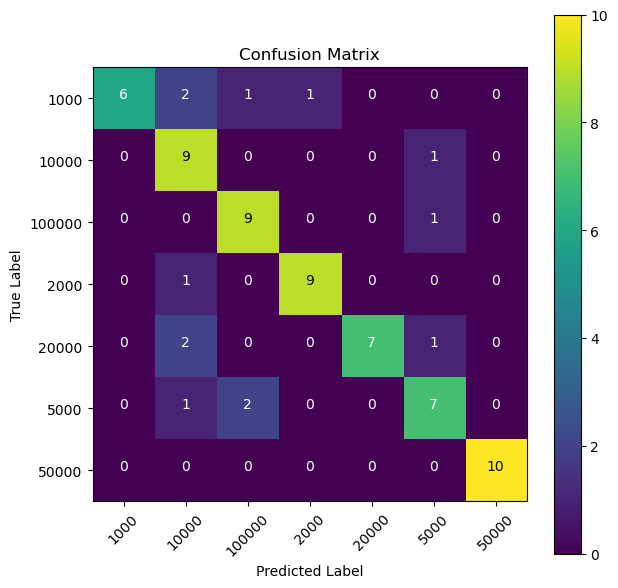

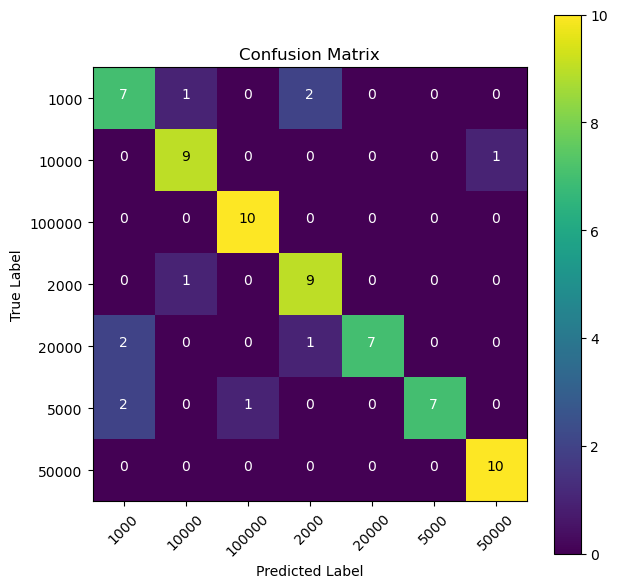

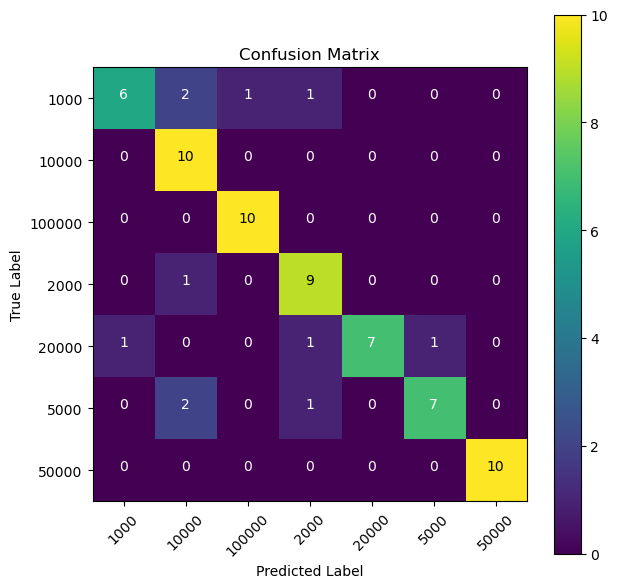

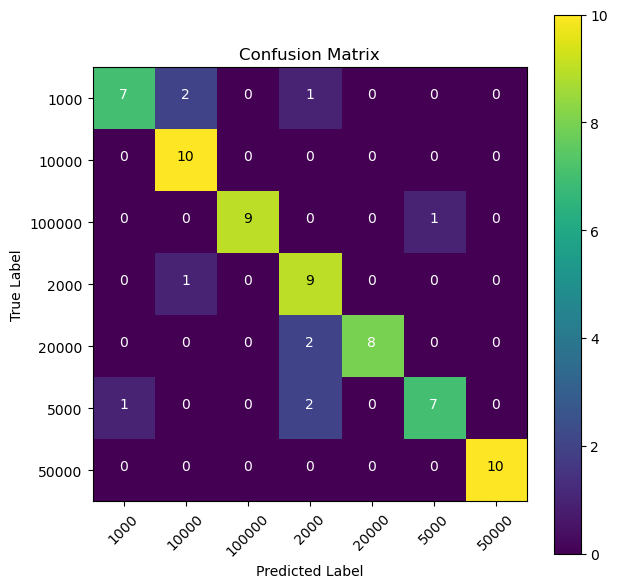

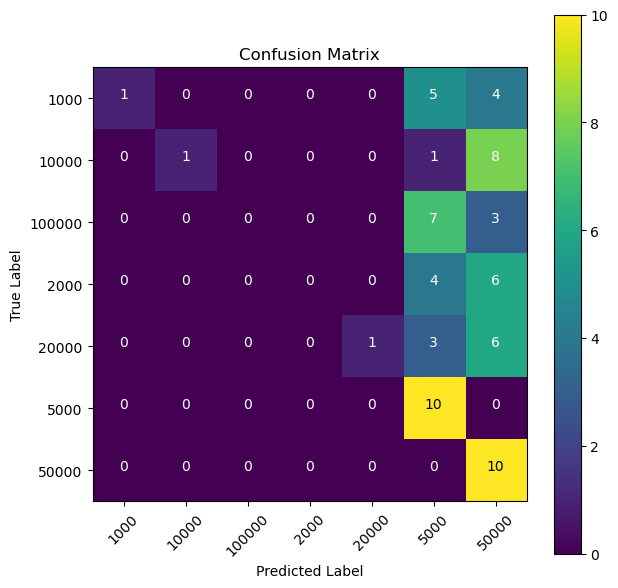

...

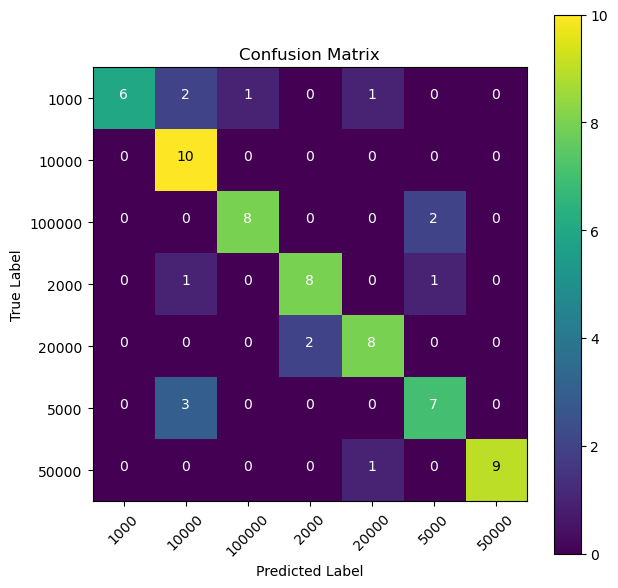

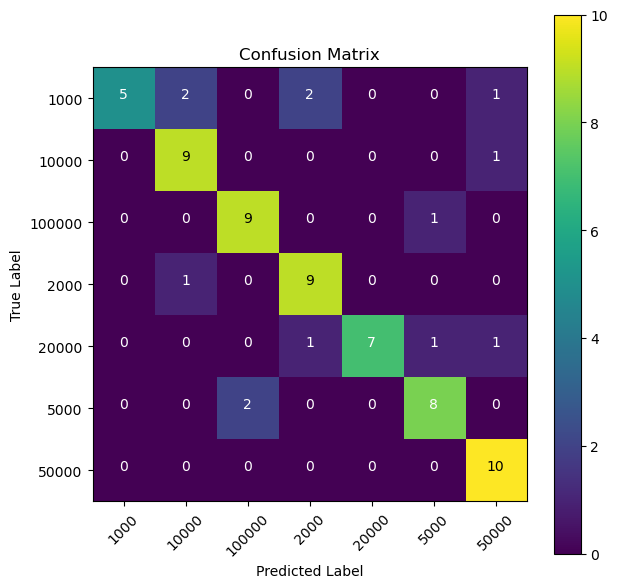

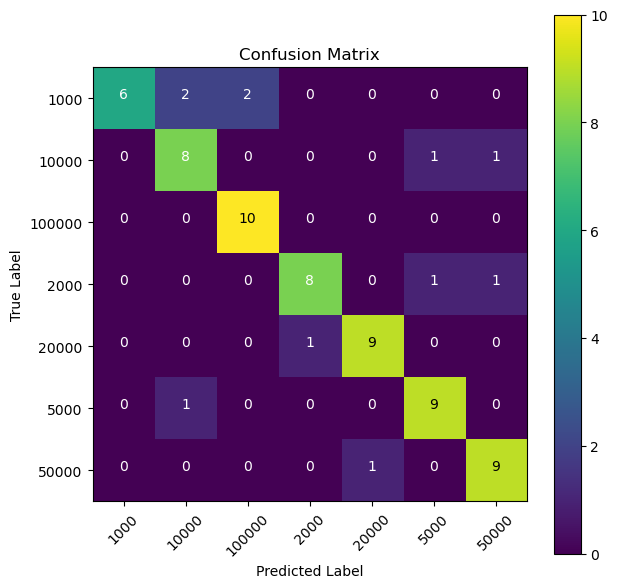

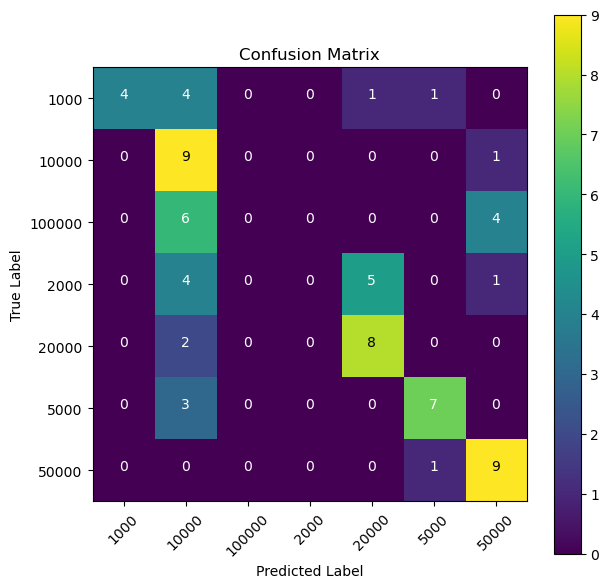

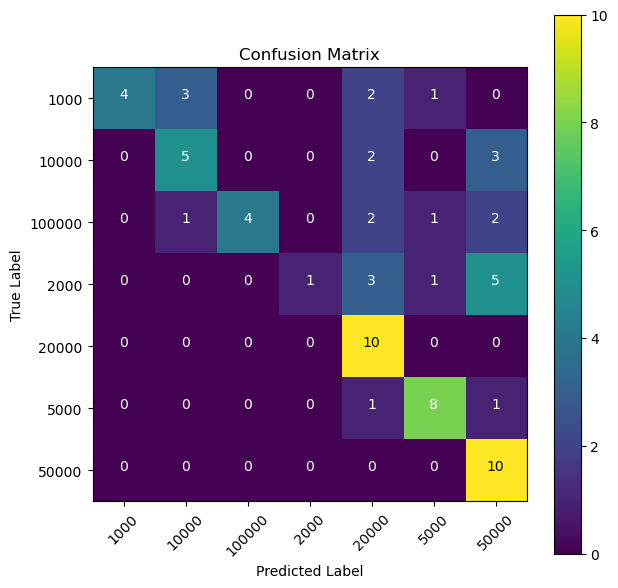

In [52]:
j = 0
for i in range (j,len(parameter)):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg19_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy19[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (j+1)
  hasilTabel.to_excel("hasilTabel.xlsx")
  print("".center(100,"─"))

Percobaan ke- 67 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.035990176134812694
batch size: 64
dropout rate: 0.6855272469678848
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/45
8/8 [==============================] - ETA: 0s - loss: 2.8767 - acc: 0.2918
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan67/model\vgg_19_67-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 43s 6s/step - loss: 2.8767 - acc: 0.2918 - val_loss: 6.7444 - val_acc: 0.2357
Epoch 2/45
8/8 [==============================] - ETA: 0s - loss: 1.9441 - acc: 0.3755
Epoch 2: val_acc did not improve from 0.23571
8/8 [==============================] - 41s 5s/step - loss: 1.9441 - acc: 0.3755 - val_loss: 5.9150 - val_acc: 0.1643
Epoch 3/45
8/8 [==============================] - ETA: 0s - loss: 1.5747 - acc: 0.4612
Epoch 3: val_acc im

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/40
8/8 [==============================] - ETA: 0s - loss: 3.5146 - acc: 0.2143
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan68/model\vgg_19_68-saved-model-01-acc-0.17.hdf5
8/8 [==============================] - 43s 6s/step - loss: 3.5146 - acc: 0.2143 - val_loss: 6.8539 - val_acc: 0.1714
Epoch 2/40
8/8 [==============================] - ETA: 0s - loss: 2.7150 - acc: 0.3020
Epoch 2: val_acc improved from 0.17143 to 0.27143, saving model to percobaan68/model\vgg_19_68-saved-model-02-acc-0.27.hdf5
8/8 [==============================] - 41s 5s/step - loss: 2.7150 - acc: 0.3020 - val_loss: 4.2226 - val_acc: 0.2714
Epoch 3/40
8/8 [==============================] - ETA: 0s - loss: 2.0422 - acc: 0.3653
Epoch 3: val_acc did not improve from 0.27143
8/8 [==============================] - 41s 5s/step - loss: 2.0422 - acc: 0.3653 - val_loss: 3.9191 - val_acc: 0.1643
Epoch 4/40
8/8 [==============================] - ETA: 0s - loss: 1.6866 - acc: 0.4408
Epoch 4: v

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.62      0.50      0.56        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.70      0.82        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.30      0.46        10
        5000       0.23      1.00      0.37        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.46        70
   macro avg       0.67      0.46      0.45        70
weighted avg       0.67      0.46      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 69 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 42
learning rate: 0.0457704381486079
batch size: 128
dropout rate: 0.5626666683191089
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.75      0.90      0.82        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.33      1.00      0.50        10
       50000       0.38      1.00      0.56        10

    accuracy                           0.44        70
   macro avg       0.50      0.44      0.32        70
weighted avg       0.50      0.44      0.32        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 70 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 44
learning rate: 0.032954995449347595
batch size: 128
dropout rate: 0.5944754369645237
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.80      0.89        10
        2000       0.00      0.00      0.00        10
       20000       0.67      1.00      0.80        10
        5000       0.50      1.00      0.67        10
       50000       0.43      1.00      0.61        10

    accuracy                           0.60        70
   macro avg       0.66      0.60      0.51        70
weighted avg       0.66      0.60      0.51        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 71 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 42
learning rate: 0.04589177224109349
batch size: 128
dropout rate: 0.6536145244513356
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.23      1.00      0.38        10
        5000       0.82      0.90      0.86        10
       50000       0.75      0.60      0.67        10

    accuracy                           0.47        70
   macro avg       0.69      0.47      0.45        70
weighted avg       0.69      0.47      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 72 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 40
learning rate: 0.031579786507664395
batch size: 128
dropout rate: 0.7803614163507349
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       0.60      0.90      0.72        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.38      0.90      0.53        10
       50000       0.37      1.00      0.54        10

    accuracy                           0.46        70
   macro avg       0.48      0.46      0.35        70
weighted avg       0.48      0.46      0.35        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 73 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 40
learning rate: 0.05145767259229179
batch size: 32
dropout rate: 0.5438367403796832
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.70      0.82        10
      100000       0.73      0.80      0.76        10
        2000       0.38      0.90      0.53        10
       20000       0.00      0.00      0.00        10
        5000       1.00      0.40      0.57        10
       50000       0.48      1.00      0.65        10

    accuracy                           0.59        70
   macro avg       0.65      0.59      0.54        70
weighted avg       0.65      0.59      0.54        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 74 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.0693306066155779
batch size: 32
dropout rate: 0.6370537393011809
──────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 75 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.060793881252293375
batch size: 32
dropout rate: 0.6682959007826793
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/45
16/16 [==============================] - ETA: 0s - loss: 3.8463 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan75/model\vgg_19_75-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 43s 3s/step - loss: 3.8463 - acc: 0.2163 - val_loss: 11.7539 - val_acc: 0.1429
Epoch 2/45
16/16 [==============================] - ETA: 0s - loss: 2.4446 - acc: 0.3633
Epoch 2: val_acc improved from 0.14286 to 0.21429, saving model to percobaan75/model\vgg_19_75-saved-model-02-acc-0.21.hdf5
16/16 [==============================

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/44
16/16 [==============================] - ETA: 0s - loss: 4.4408 - acc: 0.1898
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan76/model\vgg_19_76-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 45s 3s/step - loss: 4.4408 - acc: 0.1898 - val_loss: 11.6305 - val_acc: 0.2143
Epoch 2/44
16/16 [==============================] - ETA: 0s - loss: 3.3103 - acc: 0.2673
Epoch 2: val_acc did not improve from 0.21429
16/16 [==============================] - 43s 3s/step - loss: 3.3103 - acc: 0.2673 - val_loss: 3.5410 - val_acc: 0.1500
Epoch 3/44
16/16 [==============================] - ETA: 0s - loss: 2.3967 - acc: 0.2714
Epoch 3: val_acc improved from 0.21429 to 0.24286, saving model to percobaan76/model\vgg_19_76-saved-model-03-acc-0.24.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.3967 - acc: 0.2714 - val_loss: 1.9608 - val_acc: 0.2429
Epoch 4/44
16/16 [==============================] - ETA: 0s - loss: 1.9900 - acc: 0.

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/46
8/8 [==============================] - ETA: 0s - loss: 2.7967 - acc: 0.2694
Epoch 1: val_acc improved from -inf to 0.28571, saving model to percobaan77/model\vgg_19_77-saved-model-01-acc-0.29.hdf5
8/8 [==============================] - 44s 5s/step - loss: 2.7967 - acc: 0.2694 - val_loss: 9.0185 - val_acc: 0.2857
Epoch 2/46
8/8 [==============================] - ETA: 0s - loss: 1.9577 - acc: 0.4102
Epoch 2: val_acc improved from 0.28571 to 0.39286, saving model to percobaan77/model\vgg_19_77-saved-model-02-acc-0.39.hdf5
8/8 [==============================] - 42s 6s/step - loss: 1.9577 - acc: 0.4102 - val_loss: 6.4665 - val_acc: 0.3929
Epoch 3/46
8/8 [==============================] - ETA: 0s - loss: 1.5203 - acc: 0.5265
Epoch 3: val_acc did not improve from 0.39286
8/8 [==============================] - 41s 5s/step - loss: 1.5203 - acc: 0.5265 - val_loss: 7.7998 - val_acc: 0.2357
Epoch 4/46
8/8 [==============================] - ETA: 0s - loss: 1.0457 - acc: 0.6367
Epoch 4: v

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/46
8/8 [==============================] - ETA: 0s - loss: 3.1323 - acc: 0.2653
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan78/model\vgg_19_78-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 43s 5s/step - loss: 3.1323 - acc: 0.2653 - val_loss: 14.5288 - val_acc: 0.1429
Epoch 2/46
8/8 [==============================] - ETA: 0s - loss: 2.3197 - acc: 0.3837
Epoch 2: val_acc improved from 0.14286 to 0.27143, saving model to percobaan78/model\vgg_19_78-saved-model-02-acc-0.27.hdf5
8/8 [==============================] - 41s 5s/step - loss: 2.3197 - acc: 0.3837 - val_loss: 7.0291 - val_acc: 0.2714
Epoch 3/46
8/8 [==============================] - ETA: 0s - loss: 1.7177 - acc: 0.4571
Epoch 3: val_acc did not improve from 0.27143
8/8 [==============================] - 41s 5s/step - loss: 1.7177 - acc: 0.4571 - val_loss: 4.3206 - val_acc: 0.1929
Epoch 4/46
8/8 [==============================] - ETA: 0s - loss: 1.3594 - acc: 0.5531
Epoch 4: 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/39
8/8 [==============================] - ETA: 0s - loss: 3.3735 - acc: 0.2510
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan79/model\vgg_19_79-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 43s 5s/step - loss: 3.3735 - acc: 0.2510 - val_loss: 11.3875 - val_acc: 0.2429
Epoch 2/39
8/8 [==============================] - ETA: 0s - loss: 2.5921 - acc: 0.3020
Epoch 2: val_acc did not improve from 0.24286
8/8 [==============================] - 41s 5s/step - loss: 2.5921 - acc: 0.3020 - val_loss: 6.8227 - val_acc: 0.2357
Epoch 3/39
8/8 [==============================] - ETA: 0s - loss: 1.8827 - acc: 0.4163
Epoch 3: val_acc improved from 0.24286 to 0.25714, saving model to percobaan79/model\vgg_19_79-saved-model-03-acc-0.26.hdf5
8/8 [==============================] - 41s 5s/step - loss: 1.8827 - acc: 0.4163 - val_loss: 4.4097 - val_acc: 0.2571
Epoch 4/39
8/8 [==============================] - ETA: 0s - loss: 1.5059 - acc: 0.4735
Epoch 4: 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/46
8/8 [==============================] - ETA: 0s - loss: 3.5796 - acc: 0.2449
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan80/model\vgg_19_80-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 43s 5s/step - loss: 3.5796 - acc: 0.2449 - val_loss: 14.3243 - val_acc: 0.1429
Epoch 2/46
8/8 [==============================] - ETA: 0s - loss: 2.7349 - acc: 0.2959
Epoch 2: val_acc improved from 0.14286 to 0.31429, saving model to percobaan80/model\vgg_19_80-saved-model-02-acc-0.31.hdf5
8/8 [==============================] - 41s 5s/step - loss: 2.7349 - acc: 0.2959 - val_loss: 6.2998 - val_acc: 0.3143
Epoch 3/46
8/8 [==============================] - ETA: 0s - loss: 1.9974 - acc: 0.3633
Epoch 3: val_acc did not improve from 0.31429
8/8 [==============================] - 41s 5s/step - loss: 1.9974 - acc: 0.3633 - val_loss: 4.5997 - val_acc: 0.1714
Epoch 4/46
8/8 [==============================] - ETA: 0s - loss: 1.7188 - acc: 0.4000
Epoch 4: 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 81 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.07264038316803764
batch size: 128
dropout rate: 0.5620020225114091
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/46
4/4 [==============================] - ETA: 0s - loss: 2.7955 - acc: 0.2633 
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan81/model\vgg_19_81-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 69s 18s/step - loss: 2.7955 - acc: 0.2633 - val_loss: 22.0712 - val_acc: 0.1429
Epoch 2/46
4/4 [==============================] - ETA: 0s - loss: 2.0145 - acc: 0.4163 
Epoch 2: val_acc did not improve from 0.14286
4/4 [==============================] - 65s 18s/step - loss: 2.0145 - acc: 0.4163 - val_loss: 15.7211 - val_acc: 0.1429

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.28      0.90      0.43        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.50      0.67        10
        2000       0.00      0.00      0.00        10
       20000       0.40      0.40      0.40        10
        5000       0.42      0.80      0.55        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.43        70
   macro avg       0.44      0.43      0.37        70
weighted avg       0.44      0.43      0.37        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 82 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.07053098326625157
batch size: 128
dropout rate: 0.5813430129552282
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.50      0.20      0.29        10
      100000       0.78      0.70      0.74        10
        2000       0.00      0.00      0.00        10
       20000       0.40      1.00      0.57        10
        5000       0.88      0.70      0.78        10
       50000       0.38      0.90      0.53        10

    accuracy                           0.50        70
   macro avg       0.42      0.50      0.41        70
weighted avg       0.42      0.50      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 83 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.07496194372946201
batch size: 128
dropout rate: 0.6728424218378134
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/47
4/4 [==============================] - ETA: 0s - loss: 3.2251 - acc: 0.2041
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan84/model\vgg_19_84-saved-model-01-acc-0.25.hdf5
4/4 [==============================] - 43s 12s/step - loss: 3.2251 - acc: 0.2041 - val_loss: 7.6896 - val_acc: 0.2500
Epoch 2/47
4/4 [==============================] - ETA: 0s - loss: 2.8172 - acc: 0.3000
Epoch 2: val_acc did not improve from 0.25000
4/4 [==============================] - 41s 11s/step - loss: 2.8172 - acc: 0.3000 - val_loss: 10.7028 - val_acc: 0.1500
Epoch 3/47
4/4 [==============================] - ETA: 0s - loss: 2.0946 - acc: 0.3612
Epoch 3: val_acc improved from 0.25000 to 0.35000, saving model to percobaan84/model\vgg_19_84-saved-model-03-acc-0.35.hdf5
4/4 [==============================] - 41s 11s/step - loss: 2.0946 - acc: 0.3612 - val_loss: 5.0427 - val_acc: 0.3500
Epoch 4/47
4/4 [==============================] - ETA: 0s - loss: 1.7811 - acc: 0.4204
Epoch 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.43      0.90      0.58        10
       10000       1.00      0.40      0.57        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.70      0.70      0.70        10
        5000       0.36      0.80      0.50        10
       50000       0.67      0.80      0.73        10

    accuracy                           0.53        70
   macro avg       0.59      0.53      0.47        70
weighted avg       0.59      0.53      0.47        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 85 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.08034302753646132
batch size: 32
dropout rate: 0.5416522919512746
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.19      1.00      0.32        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.44      0.70      0.54        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.27        70
   macro avg       0.38      0.27      0.17        70
weighted avg       0.38      0.27      0.17        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 86 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 42
learning rate: 0.08299642966825618
batch size: 32
dropout rate: 0.6486166649434298
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/45
16/16 [==============================] - ETA: 0s - loss: 4.0359 - acc: 0.2204
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan87/model\vgg_19_87-saved-model-01-acc-0.26.hdf5
16/16 [==============================] - 45s 3s/step - loss: 4.0359 - acc: 0.2204 - val_loss: 4.3108 - val_acc: 0.2571
Epoch 2/45
16/16 [==============================] - ETA: 0s - loss: 2.6684 - acc: 0.3388
Epoch 2: val_acc improved from 0.25714 to 0.31429, saving model to percobaan87/model\vgg_19_87-saved-model-02-acc-0.31.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.6684 - acc: 0.3388 - val_loss: 3.2322 - val_acc: 0.3143
Epoch 3/45
16/16 [==============================] - ETA: 0s - loss: 2.1310 - acc: 0.3796
Epoch 3: val_acc improved from 0.31429 to 0.37143, saving model to percobaan87/model\vgg_19_87-saved-model-03-acc-0.37.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.1310 - acc: 0.3796 - val_loss: 2.2431 - val_acc: 0.3714
Epoch 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\438057614.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,7))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

              precision    recall  f1-score   support

        1000       0.40      0.20      0.27        10
       10000       0.42      0.50      0.45        10
      100000       0.88      0.70      0.78        10
        2000       0.00      0.00      0.00        10
       20000       0.27      1.00      0.43        10
        5000       1.00      0.20      0.33        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.44        70
   macro avg       0.54      0.44      0.41        70
weighted avg       0.54      0.44      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 88 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 40
learning rate: 0.08422689042870193
batch size: 32
dropout rate: 0.7408677629593016
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       0.71      1.00      0.83        10
        2000       0.31      1.00      0.48        10
       20000       0.00      0.00      0.00        10
        5000       0.80      0.40      0.53        10
       50000       0.62      1.00      0.77        10

    accuracy                           0.51        70
   macro avg       0.49      0.51      0.42        70
weighted avg       0.49      0.51      0.42        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 89 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 41
learning rate: 0.07893065606507361
batch size: 64
dropout rate: 0.5674273839571481
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.50      0.10      0.17        10
       10000       0.71      0.50      0.59        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.00      0.00      0.00        10
        5000       0.17      1.00      0.29        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.26        70
   macro avg       0.34      0.26      0.20        70
weighted avg       0.34      0.26      0.20        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 90 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.08575231371321448
batch size: 64
dropout rate: 0.6316690392763754
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.21      1.00      0.34        10
       50000       0.45      0.90      0.60        10

    accuracy                           0.30        70
   macro avg       0.38      0.30      0.19        70
weighted avg       0.38      0.30      0.19        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 91 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.0935039167099933
batch size: 64
dropout rate: 0.6885848779105105
──────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/44
8/8 [==============================] - ETA: 0s - loss: 4.4281 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan92/model\vgg_19_92-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 43s 5s/step - loss: 4.4281 - acc: 0.2163 - val_loss: 20.4870 - val_acc: 0.1429
Epoch 2/44
8/8 [==============================] - ETA: 0s - loss: 3.4364 - acc: 0.2694
Epoch 2: val_acc improved from 0.14286 to 0.17143, saving model to percobaan92/model\vgg_19_92-saved-model-02-acc-0.17.hdf5
8/8 [==============================] - 41s 5s/step - loss: 3.4364 - acc: 0.2694 - val_loss: 5.5124 - val_acc: 0.1714
Epoch 3/44
8/8 [==============================] - ETA: 0s - loss: 2.3606 - acc: 0.3102
Epoch 3: val_acc did not improve from 0.17143
8/8 [==============================] - 41s 5s/step - loss: 2.3606 - acc: 0.3102 - val_loss: 3.3983 - val_acc: 0.1571
Epoch 4/44
8/8 [==============================] - ETA: 0s - loss: 2.0852 - acc: 0.2980
Epoch 4: 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.62      0.50      0.56        10
       10000       0.50      0.50      0.50        10
      100000       1.00      0.60      0.75        10
        2000       0.00      0.00      0.00        10
       20000       0.45      1.00      0.62        10
        5000       0.50      0.80      0.62        10
       50000       0.88      0.70      0.78        10

    accuracy                           0.59        70
   macro avg       0.56      0.59      0.55        70
weighted avg       0.56      0.59      0.55        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 93 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.07847721996101766
batch size: 128
dropout rate: 0.5554386352245231
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.67      0.40      0.50        10
       10000       0.78      0.70      0.74        10
      100000       1.00      0.50      0.67        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.29      0.70      0.41        10
       50000       0.40      1.00      0.57        10

    accuracy                           0.49        70
   macro avg       0.59      0.49      0.44        70
weighted avg       0.59      0.49      0.44        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 94 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.08354408981518262
batch size: 128
dropout rate: 0.5903107757701588
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       0.71      0.50      0.59        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.77      1.00      0.87        10
        5000       0.36      1.00      0.53        10
       50000       0.53      1.00      0.69        10

    accuracy                           0.54        70
   macro avg       0.48      0.54      0.45        70
weighted avg       0.48      0.54      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 95 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.08253469717264056
batch size: 128
dropout rate: 0.7148783301428839
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.60      0.60      0.60        10
       10000       1.00      0.30      0.46        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.37      1.00      0.54        10
        5000       1.00      0.50      0.67        10
       50000       0.28      0.70      0.40        10

    accuracy                           0.44        70
   macro avg       0.46      0.44      0.38        70
weighted avg       0.46      0.44      0.38        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 96 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.08295996677437234
batch size: 128
dropout rate: 0.7408278026974191
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.56      0.90      0.69        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.20      0.90      0.32        10
       50000       0.75      0.60      0.67        10

    accuracy                           0.34        70
   macro avg       0.22      0.34      0.24        70
weighted avg       0.22      0.34      0.24        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 97 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 50
learning rate: 0.014789174610815166
batch size: 32
dropout rate: 0.5124421464635371
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/54
16/16 [==============================] - ETA: 0s - loss: 2.4709 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan98/model\vgg_19_98-saved-model-01-acc-0.25.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.4709 - acc: 0.3245 - val_loss: 2.5454 - val_acc: 0.2500
Epoch 2/54
16/16 [==============================] - ETA: 0s - loss: 1.4946 - acc: 0.4898
Epoch 2: val_acc did not improve from 0.25000
16/16 [==============================] - 42s 3s/step - loss: 1.4946 - acc: 0.4898 - val_loss: 3.4963 - val_acc: 0.2143
Epoch 3/54
16/16 [==============================] - ETA: 0s - loss: 1.0980 - acc: 0.5959
Epoch 3: val_acc improved from 0.25000 to 0.47143, saving model to percobaan98/model\vgg_19_98-saved-model-03-acc-0.47.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.0980 - acc: 0.5959 - val_loss: 1.6065 - val_acc: 0.4714
Epoch 4/54
16/16 [==============================] - ETA: 0s - loss: 0.8936 - acc: 0.6

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/52
16/16 [==============================] - ETA: 0s - loss: 2.8827 - acc: 0.2694
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan99/model\vgg_19_99-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.8827 - acc: 0.2694 - val_loss: 3.8959 - val_acc: 0.1857
Epoch 2/52
16/16 [==============================] - ETA: 0s - loss: 2.0274 - acc: 0.3367
Epoch 2: val_acc improved from 0.18571 to 0.30000, saving model to percobaan99/model\vgg_19_99-saved-model-02-acc-0.30.hdf5
16/16 [==============================] - 42s 3s/step - loss: 2.0274 - acc: 0.3367 - val_loss: 2.6952 - val_acc: 0.3000
Epoch 3/52
16/16 [==============================] - ETA: 0s - loss: 1.6053 - acc: 0.4633
Epoch 3: val_acc improved from 0.30000 to 0.53571, saving model to percobaan99/model\vgg_19_99-saved-model-03-acc-0.54.hdf5
16/16 [==============================] - 42s 3s/step - loss: 1.6053 - acc: 0.4633 - val_loss: 1.8588 - val_acc: 0.5357
Epoch 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/51
16/16 [==============================] - ETA: 0s - loss: 3.9792 - acc: 0.1531
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan100/model\vgg_19_100-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 43s 3s/step - loss: 3.9792 - acc: 0.1531 - val_loss: 2.0773 - val_acc: 0.1571
Epoch 2/51
16/16 [==============================] - ETA: 0s - loss: 3.1840 - acc: 0.2612
Epoch 2: val_acc improved from 0.15714 to 0.16429, saving model to percobaan100/model\vgg_19_100-saved-model-02-acc-0.16.hdf5
16/16 [==============================] - 42s 3s/step - loss: 3.1840 - acc: 0.2612 - val_loss: 1.8999 - val_acc: 0.1643
Epoch 3/51
16/16 [==============================] - ETA: 0s - loss: 2.6580 - acc: 0.2653
Epoch 3: val_acc improved from 0.16429 to 0.25000, saving model to percobaan100/model\vgg_19_100-saved-model-03-acc-0.25.hdf5
16/16 [==============================] - 42s 3s/step - loss: 2.6580 - acc: 0.2653 - val_loss: 1.7587 - val_acc: 0.2500
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/49
8/8 [==============================] - ETA: 0s - loss: 2.4130 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan101/model\vgg_19_101-saved-model-01-acc-0.26.hdf5
8/8 [==============================] - 52s 6s/step - loss: 2.4130 - acc: 0.2980 - val_loss: 5.4724 - val_acc: 0.2571
Epoch 2/49
8/8 [==============================] - ETA: 0s - loss: 1.3617 - acc: 0.5449
Epoch 2: val_acc improved from 0.25714 to 0.40714, saving model to percobaan101/model\vgg_19_101-saved-model-02-acc-0.41.hdf5
8/8 [==============================] - 50s 6s/step - loss: 1.3617 - acc: 0.5449 - val_loss: 3.7027 - val_acc: 0.4071
Epoch 3/49
8/8 [==============================] - ETA: 0s - loss: 1.0211 - acc: 0.6204
Epoch 3: val_acc did not improve from 0.40714
8/8 [==============================] - 50s 7s/step - loss: 1.0211 - acc: 0.6204 - val_loss: 2.8397 - val_acc: 0.3714
Epoch 4/49
8/8 [==============================] - ETA: 0s - loss: 0.8385 - acc: 0.7265
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/52
8/8 [==============================] - ETA: 0s - loss: 2.4277 - acc: 0.3122
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan102/model\vgg_19_102-saved-model-01-acc-0.15.hdf5
8/8 [==============================] - 73s 10s/step - loss: 2.4277 - acc: 0.3122 - val_loss: 5.9138 - val_acc: 0.1500
Epoch 2/52
8/8 [==============================] - ETA: 0s - loss: 1.5033 - acc: 0.4980
Epoch 2: val_acc improved from 0.15000 to 0.33571, saving model to percobaan102/model\vgg_19_102-saved-model-02-acc-0.34.hdf5
8/8 [==============================] - 51s 6s/step - loss: 1.5033 - acc: 0.4980 - val_loss: 3.9042 - val_acc: 0.3357
Epoch 3/52
8/8 [==============================] - ETA: 0s - loss: 1.1962 - acc: 0.5714
Epoch 3: val_acc improved from 0.33571 to 0.35000, saving model to percobaan102/model\vgg_19_102-saved-model-03-acc-0.35.hdf5
8/8 [==============================] - 46s 6s/step - loss: 1.1962 - acc: 0.5714 - val_loss: 3.3473 - val_acc: 0.3500
Epoch 4/52
8

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.50      0.67        10
       10000       1.00      0.40      0.57        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.83      0.50      0.62        10
        5000       1.00      0.60      0.75        10
       50000       0.21      1.00      0.35        10

    accuracy                           0.46        70
   macro avg       0.72      0.46      0.47        70
weighted avg       0.72      0.46      0.47        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 103 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.015129057636579374
batch size: 64
dropout rate: 0.672388272205964
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/53
8/8 [==============================] - ETA: 0s - loss: 3.1279 - acc: 0.2694
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan104/model\vgg_19_104-saved-model-01-acc-0.17.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.1279 - acc: 0.2694 - val_loss: 5.8800 - val_acc: 0.1714
Epoch 2/53
8/8 [==============================] - ETA: 0s - loss: 2.0093 - acc: 0.3592
Epoch 2: val_acc did not improve from 0.17143
8/8 [==============================] - 45s 6s/step - loss: 2.0093 - acc: 0.3592 - val_loss: 8.8690 - val_acc: 0.1429
Epoch 3/53
8/8 [==============================] - ETA: 0s - loss: 1.6668 - acc: 0.4469
Epoch 3: val_acc improved from 0.17143 to 0.22857, saving model to percobaan104/model\vgg_19_104-saved-model-03-acc-0.23.hdf5
8/8 [==============================] - 43s 5s/step - loss: 1.6668 - acc: 0.4469 - val_loss: 3.2320 - val_acc: 0.2286
Epoch 4/53
8/8 [==============================] - ETA: 0s - loss: 1.5023 - acc: 0.4857
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/56
4/4 [==============================] - ETA: 0s - loss: 2.6237 - acc: 0.2837
Epoch 1: val_acc improved from -inf to 0.31429, saving model to percobaan105/model\vgg_19_105-saved-model-01-acc-0.31.hdf5
4/4 [==============================] - 45s 11s/step - loss: 2.6237 - acc: 0.2837 - val_loss: 1.7250 - val_acc: 0.3143
Epoch 2/56
4/4 [==============================] - ETA: 0s - loss: 1.3131 - acc: 0.5633
Epoch 2: val_acc improved from 0.31429 to 0.42857, saving model to percobaan105/model\vgg_19_105-saved-model-02-acc-0.43.hdf5
4/4 [==============================] - 41s 11s/step - loss: 1.3131 - acc: 0.5633 - val_loss: 1.7864 - val_acc: 0.4286
Epoch 3/56
4/4 [==============================] - ETA: 0s - loss: 0.9772 - acc: 0.6633
Epoch 3: val_acc improved from 0.42857 to 0.45000, saving model to percobaan105/model\vgg_19_105-saved-model-03-acc-0.45.hdf5
4/4 [==============================] - 41s 11s/step - loss: 0.9772 - acc: 0.6633 - val_loss: 1.8564 - val_acc: 0.4500
Epoch 4/56

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       0.58      0.70      0.64        10
      100000       1.00      0.10      0.18        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.30      0.46        10
        5000       0.38      0.80      0.52        10
       50000       0.34      1.00      0.51        10

    accuracy                           0.47        70
   macro avg       0.62      0.47      0.41        70
weighted avg       0.62      0.47      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 106 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.018495915402039244
batch size: 128
dropout rate: 0.5930465520572324
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.40      0.57        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.67      0.80      0.73        10
       50000       0.20      1.00      0.34        10

    accuracy                           0.37        70
   macro avg       0.55      0.37      0.33        70
weighted avg       0.55      0.37      0.33        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 107 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 48
learning rate: 0.019966307861141952
batch size: 128
dropout rate: 0.7020176314097518
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.86      0.60      0.71        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.22      1.00      0.36        10
       50000       0.53      0.80      0.64        10

    accuracy                           0.37        70
   macro avg       0.52      0.37      0.30        70
weighted avg       0.52      0.37      0.30        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 108 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.022503813483815745
batch size: 128
dropout rate: 0.7316387755857815
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       0.32      0.80      0.46        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.30      0.46        10
        5000       1.00      0.60      0.75        10
       50000       0.31      1.00      0.48        10

    accuracy                           0.44        70
   macro avg       0.52      0.44      0.39        70
weighted avg       0.52      0.44      0.39        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 109 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 52
learning rate: 0.03831744545613319
batch size: 32
dropout rate: 0.5044230152796895
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/54
16/16 [==============================] - ETA: 0s - loss: 2.6204 - acc: 0.3020
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan110/model\vgg_19_110-saved-model-01-acc-0.15.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.6204 - acc: 0.3020 - val_loss: 7.6319 - val_acc: 0.1500
Epoch 2/54
16/16 [==============================] - ETA: 0s - loss: 1.6614 - acc: 0.4857
Epoch 2: val_acc improved from 0.15000 to 0.22857, saving model to percobaan110/model\vgg_19_110-saved-model-02-acc-0.23.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.6614 - acc: 0.4857 - val_loss: 3.2281 - val_acc: 0.2286
Epoch 3/54
16/16 [==============================] - ETA: 0s - loss: 1.2747 - acc: 0.5816
Epoch 3: val_acc improved from 0.22857 to 0.36429, saving model to percobaan110/model\vgg_19_110-saved-model-03-acc-0.36.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.2747 - acc: 0.5816 - val_loss: 1.6851 - val_acc: 0.3643
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/53
16/16 [==============================] - ETA: 0s - loss: 3.3486 - acc: 0.2551
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan111/model\vgg_19_111-saved-model-01-acc-0.26.hdf5
16/16 [==============================] - 44s 3s/step - loss: 3.3486 - acc: 0.2551 - val_loss: 5.3606 - val_acc: 0.2571
Epoch 2/53
16/16 [==============================] - ETA: 0s - loss: 2.3804 - acc: 0.3429
Epoch 2: val_acc improved from 0.25714 to 0.27143, saving model to percobaan111/model\vgg_19_111-saved-model-02-acc-0.27.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.3804 - acc: 0.3429 - val_loss: 2.7465 - val_acc: 0.2714
Epoch 3/53
16/16 [==============================] - ETA: 0s - loss: 1.8737 - acc: 0.3735
Epoch 3: val_acc improved from 0.27143 to 0.34286, saving model to percobaan111/model\vgg_19_111-saved-model-03-acc-0.34.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.8737 - acc: 0.3735 - val_loss: 1.8911 - val_acc: 0.3429
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/48
16/16 [==============================] - ETA: 0s - loss: 3.9055 - acc: 0.2224
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan112/model\vgg_19_112-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 44s 3s/step - loss: 3.9055 - acc: 0.2224 - val_loss: 6.9096 - val_acc: 0.2143
Epoch 2/48
16/16 [==============================] - ETA: 0s - loss: 2.6285 - acc: 0.3469
Epoch 2: val_acc did not improve from 0.21429
16/16 [==============================] - 42s 3s/step - loss: 2.6285 - acc: 0.3469 - val_loss: 3.9784 - val_acc: 0.1929
Epoch 3/48
16/16 [==============================] - ETA: 0s - loss: 2.0158 - acc: 0.3612
Epoch 3: val_acc improved from 0.21429 to 0.40714, saving model to percobaan112/model\vgg_19_112-saved-model-03-acc-0.41.hdf5
16/16 [==============================] - 43s 3s/step - loss: 2.0158 - acc: 0.3612 - val_loss: 2.5119 - val_acc: 0.4071
Epoch 4/48
16/16 [==============================] - ETA: 0s - loss: 1.7326 - acc:

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/56
8/8 [==============================] - ETA: 0s - loss: 2.6595 - acc: 0.3041
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan113/model\vgg_19_113-saved-model-01-acc-0.25.hdf5
8/8 [==============================] - 51s 6s/step - loss: 2.6595 - acc: 0.3041 - val_loss: 6.8088 - val_acc: 0.2500
Epoch 2/56
8/8 [==============================] - ETA: 0s - loss: 1.4357 - acc: 0.4959
Epoch 2: val_acc did not improve from 0.25000
8/8 [==============================] - 48s 6s/step - loss: 1.4357 - acc: 0.4959 - val_loss: 4.9651 - val_acc: 0.2000
Epoch 3/56
8/8 [==============================] - ETA: 0s - loss: 1.0759 - acc: 0.6163
Epoch 3: val_acc improved from 0.25000 to 0.42857, saving model to percobaan113/model\vgg_19_113-saved-model-03-acc-0.43.hdf5
8/8 [==============================] - 48s 6s/step - loss: 1.0759 - acc: 0.6163 - val_loss: 2.2494 - val_acc: 0.4286
Epoch 4/56
8/8 [==============================] - ETA: 0s - loss: 0.8913 - acc: 0.6857
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/48
8/8 [==============================] - ETA: 0s - loss: 2.7017 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan114/model\vgg_19_114-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 72s 9s/step - loss: 2.7017 - acc: 0.2980 - val_loss: 5.7504 - val_acc: 0.1429
Epoch 2/48
8/8 [==============================] - ETA: 0s - loss: 1.8952 - acc: 0.3918
Epoch 2: val_acc improved from 0.14286 to 0.16429, saving model to percobaan114/model\vgg_19_114-saved-model-02-acc-0.16.hdf5
8/8 [==============================] - 65s 8s/step - loss: 1.8952 - acc: 0.3918 - val_loss: 6.5736 - val_acc: 0.1643
Epoch 3/48
8/8 [==============================] - ETA: 0s - loss: 1.4883 - acc: 0.4898
Epoch 3: val_acc improved from 0.16429 to 0.30000, saving model to percobaan114/model\vgg_19_114-saved-model-03-acc-0.30.hdf5
8/8 [==============================] - 66s 8s/step - loss: 1.4883 - acc: 0.4898 - val_loss: 4.3954 - val_acc: 0.3000
Epoch 4/48
8/

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/55
8/8 [==============================] - ETA: 0s - loss: 3.0918 - acc: 0.2592
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan115/model\vgg_19_115-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.0918 - acc: 0.2592 - val_loss: 6.0779 - val_acc: 0.1929
Epoch 2/55
8/8 [==============================] - ETA: 0s - loss: 2.1403 - acc: 0.3878
Epoch 2: val_acc improved from 0.19286 to 0.22143, saving model to percobaan115/model\vgg_19_115-saved-model-02-acc-0.22.hdf5
8/8 [==============================] - 43s 6s/step - loss: 2.1403 - acc: 0.3878 - val_loss: 4.2337 - val_acc: 0.2214
Epoch 3/55
8/8 [==============================] - ETA: 0s - loss: 1.7621 - acc: 0.4224
Epoch 3: val_acc improved from 0.22143 to 0.32857, saving model to percobaan115/model\vgg_19_115-saved-model-03-acc-0.33.hdf5
8/8 [==============================] - 43s 6s/step - loss: 1.7621 - acc: 0.4224 - val_loss: 2.9911 - val_acc: 0.3286
Epoch 4/55
8/

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/49
8/8 [==============================] - ETA: 0s - loss: 3.2357 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan116/model\vgg_19_116-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 50s 6s/step - loss: 3.2357 - acc: 0.2163 - val_loss: 6.6283 - val_acc: 0.1429
Epoch 2/49
8/8 [==============================] - ETA: 0s - loss: 2.2495 - acc: 0.3388
Epoch 2: val_acc improved from 0.14286 to 0.21429, saving model to percobaan116/model\vgg_19_116-saved-model-02-acc-0.21.hdf5
8/8 [==============================] - 42s 5s/step - loss: 2.2495 - acc: 0.3388 - val_loss: 3.5896 - val_acc: 0.2143
Epoch 3/49
8/8 [==============================] - ETA: 0s - loss: 1.8753 - acc: 0.4184
Epoch 3: val_acc improved from 0.21429 to 0.30714, saving model to percobaan116/model\vgg_19_116-saved-model-03-acc-0.31.hdf5
8/8 [==============================] - 42s 6s/step - loss: 1.8753 - acc: 0.4184 - val_loss: 2.8941 - val_acc: 0.3071
Epoch 4/49
8/

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/51
4/4 [==============================] - ETA: 0s - loss: 2.4973 - acc: 0.3184
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan117/model\vgg_19_117-saved-model-01-acc-0.26.hdf5
4/4 [==============================] - 47s 12s/step - loss: 2.4973 - acc: 0.3184 - val_loss: 5.5661 - val_acc: 0.2571
Epoch 2/51
4/4 [==============================] - ETA: 0s - loss: 1.4938 - acc: 0.4694
Epoch 2: val_acc improved from 0.25714 to 0.38571, saving model to percobaan117/model\vgg_19_117-saved-model-02-acc-0.39.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.4938 - acc: 0.4694 - val_loss: 5.2962 - val_acc: 0.3857
Epoch 3/51
4/4 [==============================] - ETA: 0s - loss: 1.2555 - acc: 0.5531
Epoch 3: val_acc did not improve from 0.38571
4/4 [==============================] - 42s 11s/step - loss: 1.2555 - acc: 0.5531 - val_loss: 5.2300 - val_acc: 0.3214
Epoch 4/51
4/4 [==============================] - ETA: 0s - loss: 1.0337 - acc: 0.6347
Epo

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/51
4/4 [==============================] - ETA: 0s - loss: 2.7577 - acc: 0.2857
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan118/model\vgg_19_118-saved-model-01-acc-0.24.hdf5
4/4 [==============================] - 44s 12s/step - loss: 2.7577 - acc: 0.2857 - val_loss: 7.5184 - val_acc: 0.2429
Epoch 2/51
4/4 [==============================] - ETA: 0s - loss: 1.9274 - acc: 0.4102
Epoch 2: val_acc improved from 0.24286 to 0.30000, saving model to percobaan118/model\vgg_19_118-saved-model-02-acc-0.30.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.9274 - acc: 0.4102 - val_loss: 8.9922 - val_acc: 0.3000
Epoch 3/51
4/4 [==============================] - ETA: 0s - loss: 1.6023 - acc: 0.4918
Epoch 3: val_acc did not improve from 0.30000
4/4 [==============================] - 42s 11s/step - loss: 1.6023 - acc: 0.4918 - val_loss: 6.5492 - val_acc: 0.2714
Epoch 4/51
4/4 [==============================] - ETA: 0s - loss: 1.2020 - acc: 0.6000
Epo

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.26      1.00      0.42        10
        5000       0.47      0.80      0.59        10
       50000       0.40      0.40      0.40        10

    accuracy                           0.39        70
   macro avg       0.45      0.39      0.31        70
weighted avg       0.45      0.39      0.31        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 119 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 52
learning rate: 0.03437023011240618
batch size: 128
dropout rate: 0.6562170722847956
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.60      0.75        10
       20000       0.43      0.90      0.58        10
        5000       1.00      0.50      0.67        10
       50000       0.25      0.90      0.39        10

    accuracy                           0.44        70
   macro avg       0.53      0.44      0.39        70
weighted avg       0.53      0.44      0.39        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 120 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 50
learning rate: 0.047027940835024554
batch size: 128
dropout rate: 0.7288510443079075
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.40      0.57        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.19      1.00      0.31        10
       50000       0.70      0.70      0.70        10

    accuracy                           0.33        70
   macro avg       0.56      0.33      0.28        70
weighted avg       0.56      0.33      0.28        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 121 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.06347463455075808
batch size: 32
dropout rate: 0.5739806437726966
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 122 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 48
learning rate: 0.0626174728166749
batch size: 32
dropout rate: 0.59260122026505
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/48
16/16 [==============================] - ETA: 0s - loss: 3.4373 - acc: 0.2694
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan122/model\vgg_19_122-saved-model-01-acc-0.25.hdf5
16/16 [==============================] - 45s 3s/step - loss: 3.4373 - acc: 0.2694 - val_loss: 7.0548 - val_acc: 0.2500
Epoch 2/48
16/16 [==============================] - ETA: 0s - loss: 2.1237 - acc: 0.4122
Epoch 2: val_acc improved from 0.25000 to 0.30000, saving model to percobaan122/model\vgg_19_122-saved-model-02-acc-0.30.hdf5
16/16 [==============================

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.50      0.67        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.50      0.67        10
        2000       1.00      0.20      0.33        10
       20000       1.00      0.10      0.18        10
        5000       0.32      1.00      0.49        10
       50000       0.38      1.00      0.56        10

    accuracy                           0.47        70
   macro avg       0.67      0.47      0.41        70
weighted avg       0.67      0.47      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 123 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.07034666651215045
batch size: 32
dropout rate: 0.6737760532312078
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.21      1.00      0.35        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.50      0.67        10
        2000       1.00      0.20      0.33        10
       20000       0.00      0.00      0.00        10
        5000       0.00      0.00      0.00        10
       50000       0.64      0.90      0.75        10

    accuracy                           0.39        70
   macro avg       0.55      0.39      0.33        70
weighted avg       0.55      0.39      0.33        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 124 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.055898745997529926
batch size: 32
dropout rate: 0.732638313934425
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/54
8/8 [==============================] - ETA: 0s - loss: 2.6514 - acc: 0.3061
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan125/model\vgg_19_125-saved-model-01-acc-0.16.hdf5
8/8 [==============================] - 44s 5s/step - loss: 2.6514 - acc: 0.3061 - val_loss: 15.8590 - val_acc: 0.1571
Epoch 2/54
8/8 [==============================] - ETA: 0s - loss: 1.8260 - acc: 0.4633
Epoch 2: val_acc improved from 0.15714 to 0.21429, saving model to percobaan125/model\vgg_19_125-saved-model-02-acc-0.21.hdf5
8/8 [==============================] - 41s 6s/step - loss: 1.8260 - acc: 0.4633 - val_loss: 8.7125 - val_acc: 0.2143
Epoch 3/54
8/8 [==============================] - ETA: 0s - loss: 1.6159 - acc: 0.4918
Epoch 3: val_acc improved from 0.21429 to 0.25714, saving model to percobaan125/model\vgg_19_125-saved-model-03-acc-0.26.hdf5
8/8 [==============================] - 42s 5s/step - loss: 1.6159 - acc: 0.4918 - val_loss: 6.7174 - val_acc: 0.2571
Epoch 4/54
8

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.50      0.70      0.58        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.40      0.57        10
        2000       0.00      0.00      0.00        10
       20000       0.30      0.90      0.45        10
        5000       0.67      0.40      0.50        10
       50000       0.64      0.90      0.75        10

    accuracy                           0.50        70
   macro avg       0.59      0.50      0.46        70
weighted avg       0.59      0.50      0.46        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 126 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.07106830072535403
batch size: 64
dropout rate: 0.59010946216765
──────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/48
8/8 [==============================] - ETA: 0s - loss: 3.4250 - acc: 0.2102
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan127/model\vgg_19_127-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 53s 7s/step - loss: 3.4250 - acc: 0.2102 - val_loss: 12.6729 - val_acc: 0.1929
Epoch 2/48
8/8 [==============================] - ETA: 0s - loss: 2.3506 - acc: 0.3653
Epoch 2: val_acc did not improve from 0.19286
8/8 [==============================] - 60s 8s/step - loss: 2.3506 - acc: 0.3653 - val_loss: 4.5826 - val_acc: 0.1786
Epoch 3/48
8/8 [==============================] - ETA: 0s - loss: 1.7566 - acc: 0.4367
Epoch 3: val_acc improved from 0.19286 to 0.21429, saving model to percobaan127/model\vgg_19_127-saved-model-03-acc-0.21.hdf5
8/8 [==============================] - 82s 11s/step - loss: 1.7566 - acc: 0.4367 - val_loss: 4.1177 - val_acc: 0.2143
Epoch 4/48
8/8 [==============================] - ETA: 0s - loss: 1.4349 - acc: 0.5000
Epoc

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/56
8/8 [==============================] - ETA: 0s - loss: 3.6722 - acc: 0.2347
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan128/model\vgg_19_128-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 74s 9s/step - loss: 3.6722 - acc: 0.2347 - val_loss: 7.9700 - val_acc: 0.1929
Epoch 2/56
8/8 [==============================] - ETA: 0s - loss: 3.0491 - acc: 0.2857
Epoch 2: val_acc did not improve from 0.19286
8/8 [==============================] - 72s 9s/step - loss: 3.0491 - acc: 0.2857 - val_loss: 5.4205 - val_acc: 0.1857
Epoch 3/56
8/8 [==============================] - ETA: 0s - loss: 2.3257 - acc: 0.2898
Epoch 3: val_acc did not improve from 0.19286
8/8 [==============================] - 72s 9s/step - loss: 2.3257 - acc: 0.2898 - val_loss: 3.0825 - val_acc: 0.1857
Epoch 4/56
8/8 [==============================] - ETA: 0s - loss: 1.9012 - acc: 0.3612
Epoch 4: val_acc improved from 0.19286 to 0.28571, saving model to percobaan128/model\

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/51
4/4 [==============================] - ETA: 0s - loss: 2.7631 - acc: 0.2694
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan129/model\vgg_19_129-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 50s 12s/step - loss: 2.7631 - acc: 0.2694 - val_loss: 11.1642 - val_acc: 0.1500
Epoch 2/51
4/4 [==============================] - ETA: 0s - loss: 1.9655 - acc: 0.4020
Epoch 2: val_acc improved from 0.15000 to 0.31429, saving model to percobaan129/model\vgg_19_129-saved-model-02-acc-0.31.hdf5
4/4 [==============================] - 45s 12s/step - loss: 1.9655 - acc: 0.4020 - val_loss: 5.9713 - val_acc: 0.3143
Epoch 3/51
4/4 [==============================] - ETA: 0s - loss: 1.4993 - acc: 0.5143
Epoch 3: val_acc did not improve from 0.31429
4/4 [==============================] - 44s 12s/step - loss: 1.4993 - acc: 0.5143 - val_loss: 5.0537 - val_acc: 0.2071
Epoch 4/51
4/4 [==============================] - ETA: 0s - loss: 1.1394 - acc: 0.6082
Ep

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/48
4/4 [==============================] - ETA: 0s - loss: 2.8610 - acc: 0.2857
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan130/model\vgg_19_130-saved-model-01-acc-0.24.hdf5
4/4 [==============================] - 46s 12s/step - loss: 2.8610 - acc: 0.2857 - val_loss: 8.2606 - val_acc: 0.2429
Epoch 2/48
4/4 [==============================] - ETA: 0s - loss: 2.0294 - acc: 0.4082
Epoch 2: val_acc did not improve from 0.24286
4/4 [==============================] - 44s 12s/step - loss: 2.0294 - acc: 0.4082 - val_loss: 11.0864 - val_acc: 0.1643
Epoch 3/48
4/4 [==============================] - ETA: 0s - loss: 1.8160 - acc: 0.4612
Epoch 3: val_acc did not improve from 0.24286
4/4 [==============================] - 43s 12s/step - loss: 1.8160 - acc: 0.4612 - val_loss: 9.7287 - val_acc: 0.1643
Epoch 4/48
4/4 [==============================] - ETA: 0s - loss: 1.3471 - acc: 0.5408
Epoch 4: val_acc did not improve from 0.24286
4/4 [==============================]

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.43      0.30      0.35        10
       50000       0.17      1.00      0.29        10

    accuracy                           0.23        70
   macro avg       0.51      0.23      0.17        70
weighted avg       0.51      0.23      0.17        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 131 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.057938581323067014
batch size: 128
dropout rate: 0.7129696682978196
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.18      1.00      0.30        10
       50000       0.64      0.70      0.67        10

    accuracy                           0.27        70
   macro avg       0.40      0.27      0.19        70
weighted avg       0.40      0.27      0.19        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 132 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.06345880364949333
batch size: 128
dropout rate: 0.785269134895317
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.33      0.70      0.45        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.33      0.30      0.32        10
        5000       1.00      0.40      0.57        10
       50000       0.29      1.00      0.44        10

    accuracy                           0.36        70
   macro avg       0.42      0.36      0.28        70
weighted avg       0.42      0.36      0.28        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 133 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 49
learning rate: 0.09293809654194465
batch size: 32
dropout rate: 0.5001361385531284
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.33      1.00      0.50        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.27      0.30      0.29        10
        5000       0.32      0.90      0.47        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.33        70
   macro avg       0.28      0.33      0.21        70
weighted avg       0.28      0.33      0.21        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 134 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.09929376739627571
batch size: 32
dropout rate: 0.6317014606818814
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 135 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.08794782193036085
batch size: 32
dropout rate: 0.6854673523089825
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/55
16/16 [==============================] - ETA: 0s - loss: 4.6918 - acc: 0.2327
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan135/model\vgg_19_135-saved-model-01-acc-0.15.hdf5
16/16 [==============================] - 82s 5s/step - loss: 4.6918 - acc: 0.2327 - val_loss: 14.2098 - val_acc: 0.1500
Epoch 2/55
16/16 [==============================] - ETA: 0s - loss: 2.7996 - acc: 0.2959
Epoch 2: val_acc improved from 0.15000 to 0.16429, saving model to percobaan135/model\vgg_19_135-saved-model-02-acc-0.16.hdf5
16/16 [==========================

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/49
16/16 [==============================] - ETA: 0s - loss: 5.2459 - acc: 0.2224
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan136/model\vgg_19_136-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 74s 5s/step - loss: 5.2459 - acc: 0.2224 - val_loss: 14.0046 - val_acc: 0.1643
Epoch 2/49
16/16 [==============================] - ETA: 0s - loss: 3.9202 - acc: 0.2408
Epoch 2: val_acc improved from 0.16429 to 0.17857, saving model to percobaan136/model\vgg_19_136-saved-model-02-acc-0.18.hdf5
16/16 [==============================] - 71s 4s/step - loss: 3.9202 - acc: 0.2408 - val_loss: 4.2041 - val_acc: 0.1786
Epoch 3/49
16/16 [==============================] - ETA: 0s - loss: 2.7241 - acc: 0.2367
Epoch 3: val_acc improved from 0.17857 to 0.22143, saving model to percobaan136/model\vgg_19_136-saved-model-03-acc-0.22.hdf5
16/16 [==============================] - 69s 4s/step - loss: 2.7241 - acc: 0.2367 - val_loss: 2.1467 - val_acc: 0.2214


c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 137 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.0853844393487305
batch size: 64
dropout rate: 0.508537174839542
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/54
8/8 [==============================] - ETA: 0s - loss: 3.1014 - acc: 0.2816
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan137/model\vgg_19_137-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.1014 - acc: 0.2816 - val_loss: 12.7493 - val_acc: 0.2143
Epoch 2/54
8/8 [==============================] - ETA: 0s - loss: 2.0138 - acc: 0.4673
Epoch 2: val_acc improved from 0.21429 to 0.22143, saving model to percobaan137/model\vgg_19_137-saved-model-02-acc-0.22.hdf5
8/8 [==============================] - 44

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.75      0.30      0.43        10
       10000       1.00      0.30      0.46        10
      100000       1.00      0.10      0.18        10
        2000       0.50      0.40      0.44        10
       20000       0.00      0.00      0.00        10
        5000       0.35      0.80      0.48        10
       50000       0.29      0.90      0.44        10

    accuracy                           0.40        70
   macro avg       0.56      0.40      0.35        70
weighted avg       0.56      0.40      0.35        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 138 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.08100190810823875
batch size: 64
dropout rate: 0.6273377001974711
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.40      0.20      0.27        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.50      0.67        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.40      0.44        10
        5000       0.19      0.90      0.31        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.34        70
   macro avg       0.58      0.34      0.34        70
weighted avg       0.58      0.34      0.34        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 139 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 50
learning rate: 0.07621197362871232
batch size: 64
dropout rate: 0.6727388104547186
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/54
8/8 [==============================] - ETA: 0s - loss: 4.1199 - acc: 0.1857
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan140/model\vgg_19_140-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 44s 5s/step - loss: 4.1199 - acc: 0.1857 - val_loss: 20.2146 - val_acc: 0.1429
Epoch 2/54
8/8 [==============================] - ETA: 0s - loss: 3.2470 - acc: 0.3020
Epoch 2: val_acc did not improve from 0.14286
8/8 [==============================] - 42s 5s/step - loss: 3.2470 - acc: 0.3020 - val_loss: 6.4519 - val_acc: 0.1429
Epoch 3/54
8/8 [==============================] - ETA: 0s - loss: 2.1422 - acc: 0.3327
Epoch 3: val_acc improved from 0.14286 to 0.20714, saving model to percobaan140/model\vgg_19_140-saved-model-03-acc-0.21.hdf5
8/8 [==============================] - 42s 5s/step - loss: 2.1422 - acc: 0.3327 - val_loss: 3.6647 - val_acc: 0.2071
Epoch 4/54
8/8 [==============================] - ETA: 0s - loss: 2.0089 - acc: 0.2939
Epoch

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.40      0.20      0.27        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.18      1.00      0.30        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.29        70
   macro avg       0.49      0.29      0.24        70
weighted avg       0.49      0.29      0.24        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 141 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.08271042588657729
batch size: 128
dropout rate: 0.5346063443447844
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.18      1.00      0.30        10
        5000       0.80      0.40      0.53        10
       50000       0.78      0.70      0.74        10

    accuracy                           0.30        70
   macro avg       0.25      0.30      0.22        70
weighted avg       0.25      0.30      0.22        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 142 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.0758094391910772
batch size: 128
dropout rate: 0.6149693569772933
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 143 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.09448938488074318
batch size: 128
dropout rate: 0.6584728296509946
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/56
4/4 [==============================] - ETA: 0s - loss: 3.5568 - acc: 0.1959 
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan143/model\vgg_19_143-saved-model-01-acc-0.23.hdf5
4/4 [==============================] - 139s 37s/step - loss: 3.5568 - acc: 0.1959 - val_loss: 13.0312 - val_acc: 0.2286
Epoch 2/56
4/4 [==============================] - ETA: 0s - loss: 2.6252 - acc: 0.3429 
Epoch 2: val_acc improved from 0.22857 to 0.23571, saving model to percobaan143/model\vgg_19_143-saved-model-02-acc-0.24.hdf5
4/4 [=============================

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.23      0.70      0.34        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       1.00      0.20      0.33        10
       50000       0.24      0.90      0.38        10

    accuracy                           0.26        70
   macro avg       0.21      0.26      0.15        70
weighted avg       0.21      0.26      0.15        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 144 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.08046926270170172
batch size: 128
dropout rate: 0.7766033794811615
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.75      0.60      0.67        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.20      0.80      0.32        10
        5000       0.47      0.70      0.56        10
       50000       0.40      0.20      0.27        10

    accuracy                           0.36        70
   macro avg       0.40      0.36      0.31        70
weighted avg       0.40      0.36      0.31        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 145 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 64
learning rate: 0.0035355572411054086
batch size: 32
dropout rate: 0.5028974940168413
──────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.6647 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan146/model\vgg_19_146-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 46s 3s/step - loss: 2.6647 - acc: 0.2980 - val_loss: 2.7858 - val_acc: 0.1571
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.4809 - acc: 0.4918
Epoch 2: val_acc improved from 0.15714 to 0.22857, saving model to percobaan146/model\vgg_19_146-saved-model-02-acc-0.23.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.4809 - acc: 0.4918 - val_loss: 2.6618 - val_acc: 0.2286
Epoch 3/58
16/16 [==============================] - ETA: 0s - loss: 1.2253 - acc: 0.5755
Epoch 3: val_acc improved from 0.22857 to 0.40000, saving model to percobaan146/model\vgg_19_146-saved-model-03-acc-0.40.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.2253 - acc: 0.5755 - val_loss: 2.0356 - val_acc: 0.4000
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 147 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 62
learning rate: 0.013736832590289095
batch size: 32
dropout rate: 0.6535366586510822
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/62
16/16 [==============================] - ETA: 0s - loss: 2.7235 - acc: 0.2592
Epoch 1: val_acc improved from -inf to 0.31429, saving model to percobaan147/model\vgg_19_147-saved-model-01-acc-0.31.hdf5
16/16 [==============================] - 45s 3s/step - loss: 2.7235 - acc: 0.2592 - val_loss: 3.0550 - val_acc: 0.3143
Epoch 2/62
16/16 [==============================] - ETA: 0s - loss: 1.6567 - acc: 0.4490
Epoch 2: val_acc did not improve from 0.31429
16/16 [==============================] - 43s 3s/step - loss: 1.6567 - acc: 0.4490 - val_loss: 2.1938 - val_acc: 0

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
16/16 [==============================] - ETA: 0s - loss: 3.3952 - acc: 0.2184
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan148/model\vgg_19_148-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 44s 3s/step - loss: 3.3952 - acc: 0.2184 - val_loss: 3.9494 - val_acc: 0.2143
Epoch 2/65
16/16 [==============================] - ETA: 0s - loss: 1.9533 - acc: 0.4041
Epoch 2: val_acc improved from 0.21429 to 0.25714, saving model to percobaan148/model\vgg_19_148-saved-model-02-acc-0.26.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.9533 - acc: 0.4041 - val_loss: 2.2364 - val_acc: 0.2571
Epoch 3/65
16/16 [==============================] - ETA: 0s - loss: 1.5700 - acc: 0.4694
Epoch 3: val_acc improved from 0.25714 to 0.35714, saving model to percobaan148/model\vgg_19_148-saved-model-03-acc-0.36.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.5700 - acc: 0.4694 - val_loss: 1.8547 - val_acc: 0.3571
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/61
8/8 [==============================] - ETA: 0s - loss: 2.3265 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.35714, saving model to percobaan149/model\vgg_19_149-saved-model-01-acc-0.36.hdf5
8/8 [==============================] - 44s 5s/step - loss: 2.3265 - acc: 0.3245 - val_loss: 1.8180 - val_acc: 0.3571
Epoch 2/61
8/8 [==============================] - ETA: 0s - loss: 1.1295 - acc: 0.6061
Epoch 2: val_acc did not improve from 0.35714
8/8 [==============================] - 42s 5s/step - loss: 1.1295 - acc: 0.6061 - val_loss: 1.5636 - val_acc: 0.3500
Epoch 3/61
8/8 [==============================] - ETA: 0s - loss: 0.8506 - acc: 0.7020
Epoch 3: val_acc did not improve from 0.35714
8/8 [==============================] - 42s 5s/step - loss: 0.8506 - acc: 0.7020 - val_loss: 1.7279 - val_acc: 0.3071
Epoch 4/61
8/8 [==============================] - ETA: 0s - loss: 0.7622 - acc: 0.7429
Epoch 4: val_acc improved from 0.35714 to 0.47143, saving model to percobaan149/model\

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
8/8 [==============================] - ETA: 0s - loss: 2.6478 - acc: 0.2735
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan150/model\vgg_19_150-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 93s 11s/step - loss: 2.6478 - acc: 0.2735 - val_loss: 4.4158 - val_acc: 0.1429
Epoch 2/57
8/8 [==============================] - ETA: 0s - loss: 1.5542 - acc: 0.4694
Epoch 2: val_acc improved from 0.14286 to 0.25000, saving model to percobaan150/model\vgg_19_150-saved-model-02-acc-0.25.hdf5
8/8 [==============================] - 88s 11s/step - loss: 1.5542 - acc: 0.4694 - val_loss: 2.3305 - val_acc: 0.2500
Epoch 3/57
8/8 [==============================] - ETA: 0s - loss: 1.1245 - acc: 0.6061
Epoch 3: val_acc improved from 0.25000 to 0.26429, saving model to percobaan150/model\vgg_19_150-saved-model-03-acc-0.26.hdf5
8/8 [==============================] - 87s 12s/step - loss: 1.1245 - acc: 0.6061 - val_loss: 2.2594 - val_acc: 0.2643
Epoch 4/57

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/60
8/8 [==============================] - ETA: 0s - loss: 2.9149 - acc: 0.3020
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan151/model\vgg_19_151-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 82s 10s/step - loss: 2.9149 - acc: 0.3020 - val_loss: 2.2665 - val_acc: 0.2071
Epoch 2/60
8/8 [==============================] - ETA: 0s - loss: 1.8951 - acc: 0.4000
Epoch 2: val_acc improved from 0.20714 to 0.34286, saving model to percobaan151/model\vgg_19_151-saved-model-02-acc-0.34.hdf5
8/8 [==============================] - 79s 10s/step - loss: 1.8951 - acc: 0.4000 - val_loss: 2.0944 - val_acc: 0.3429
Epoch 3/60
8/8 [==============================] - ETA: 0s - loss: 1.4595 - acc: 0.5143
Epoch 3: val_acc improved from 0.34286 to 0.56429, saving model to percobaan151/model\vgg_19_151-saved-model-03-acc-0.56.hdf5
8/8 [==============================] - 80s 10s/step - loss: 1.4595 - acc: 0.5143 - val_loss: 1.5824 - val_acc: 0.5643
Epoch 4/60

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/61
8/8 [==============================] - ETA: 0s - loss: 3.2374 - acc: 0.2571
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan152/model\vgg_19_152-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 72s 9s/step - loss: 3.2374 - acc: 0.2571 - val_loss: 5.0148 - val_acc: 0.2429
Epoch 2/61
8/8 [==============================] - ETA: 0s - loss: 2.2570 - acc: 0.3694
Epoch 2: val_acc did not improve from 0.24286
8/8 [==============================] - 69s 9s/step - loss: 2.2570 - acc: 0.3694 - val_loss: 4.1979 - val_acc: 0.1500
Epoch 3/61
8/8 [==============================] - ETA: 0s - loss: 1.6517 - acc: 0.4449
Epoch 3: val_acc did not improve from 0.24286
8/8 [==============================] - 69s 9s/step - loss: 1.6517 - acc: 0.4449 - val_loss: 2.5604 - val_acc: 0.2429
Epoch 4/61
8/8 [==============================] - ETA: 0s - loss: 1.4775 - acc: 0.4551
Epoch 4: val_acc improved from 0.24286 to 0.35714, saving model to percobaan152/model\

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/58
4/4 [==============================] - ETA: 0s - loss: 2.3592 - acc: 0.3061
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan153/model\vgg_19_153-saved-model-01-acc-0.28.hdf5
4/4 [==============================] - 47s 12s/step - loss: 2.3592 - acc: 0.3061 - val_loss: 3.2808 - val_acc: 0.2786
Epoch 2/58
4/4 [==============================] - ETA: 0s - loss: 1.0939 - acc: 0.6245
Epoch 2: val_acc did not improve from 0.27857
4/4 [==============================] - 43s 12s/step - loss: 1.0939 - acc: 0.6245 - val_loss: 2.9294 - val_acc: 0.2571
Epoch 3/58
4/4 [==============================] - ETA: 0s - loss: 1.0262 - acc: 0.6571
Epoch 3: val_acc improved from 0.27857 to 0.42857, saving model to percobaan153/model\vgg_19_153-saved-model-03-acc-0.43.hdf5
4/4 [==============================] - 44s 12s/step - loss: 1.0262 - acc: 0.6571 - val_loss: 2.9570 - val_acc: 0.4286
Epoch 4/58
4/4 [==============================] - ETA: 0s - loss: 0.7662 - acc: 0.7102
Epo

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/63
4/4 [==============================] - ETA: 0s - loss: 2.7662 - acc: 0.2673
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan154/model\vgg_19_154-saved-model-01-acc-0.25.hdf5
4/4 [==============================] - 45s 12s/step - loss: 2.7662 - acc: 0.2673 - val_loss: 3.9474 - val_acc: 0.2500
Epoch 2/63
4/4 [==============================] - ETA: 0s - loss: 1.4854 - acc: 0.5143
Epoch 2: val_acc did not improve from 0.25000
4/4 [==============================] - 42s 12s/step - loss: 1.4854 - acc: 0.5143 - val_loss: 4.1805 - val_acc: 0.2143
Epoch 3/63
4/4 [==============================] - ETA: 0s - loss: 1.2040 - acc: 0.5816
Epoch 3: val_acc improved from 0.25000 to 0.47857, saving model to percobaan154/model\vgg_19_154-saved-model-03-acc-0.48.hdf5
4/4 [==============================] - 42s 11s/step - loss: 1.2040 - acc: 0.5816 - val_loss: 3.0083 - val_acc: 0.4786
Epoch 4/63
4/4 [==============================] - ETA: 0s - loss: 1.1583 - acc: 0.5898
Epo

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       1.00      0.40      0.57        10
       50000       0.16      1.00      0.27        10

    accuracy                           0.23        70
   macro avg       0.45      0.23      0.17        70
weighted avg       0.45      0.23      0.17        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 155 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 60
learning rate: 0.0059629671775262745
batch size: 128
dropout rate: 0.6859400988634173
─────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.20      0.33        10
       10000       1.00      0.70      0.82        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.20      0.33        10
        5000       0.29      1.00      0.45        10
       50000       0.40      1.00      0.57        10

    accuracy                           0.44        70
   macro avg       0.53      0.44      0.36        70
weighted avg       0.53      0.44      0.36        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 156 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 60
learning rate: 0.016431791126726113
batch size: 128
dropout rate: 0.7288361207872732
──────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
16/16 [==============================] - ETA: 0s - loss: 2.3588 - acc: 0.3122
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan157/model\vgg_19_157-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.3588 - acc: 0.3122 - val_loss: 7.3488 - val_acc: 0.1429
Epoch 2/65
16/16 [==============================] - ETA: 0s - loss: 1.5788 - acc: 0.4857
Epoch 2: val_acc improved from 0.14286 to 0.25714, saving model to percobaan157/model\vgg_19_157-saved-model-02-acc-0.26.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.5788 - acc: 0.4857 - val_loss: 3.9657 - val_acc: 0.2571
Epoch 3/65
16/16 [==============================] - ETA: 0s - loss: 1.2029 - acc: 0.5918
Epoch 3: val_acc did not improve from 0.25714
16/16 [==============================] - 43s 3s/step - loss: 1.2029 - acc: 0.5918 - val_loss: 3.0102 - val_acc: 0.2143
Epoch 4/65
16/16 [==============================] - ETA: 0s - loss: 0.9945 - acc:

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/60
16/16 [==============================] - ETA: 0s - loss: 2.6284 - acc: 0.3122
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan158/model\vgg_19_158-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.6284 - acc: 0.3122 - val_loss: 5.2587 - val_acc: 0.2357
Epoch 2/60
16/16 [==============================] - ETA: 0s - loss: 1.7441 - acc: 0.4347
Epoch 2: val_acc improved from 0.23571 to 0.45714, saving model to percobaan158/model\vgg_19_158-saved-model-02-acc-0.46.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.7441 - acc: 0.4347 - val_loss: 1.9870 - val_acc: 0.4571
Epoch 3/60
16/16 [==============================] - ETA: 0s - loss: 1.3038 - acc: 0.5367
Epoch 3: val_acc improved from 0.45714 to 0.50000, saving model to percobaan158/model\vgg_19_158-saved-model-03-acc-0.50.hdf5
16/16 [==============================] - 43s 3s/step - loss: 1.3038 - acc: 0.5367 - val_loss: 1.7791 - val_acc: 0.5000
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
16/16 [==============================] - ETA: 0s - loss: 3.3810 - acc: 0.2408
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan159/model\vgg_19_159-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 100s 6s/step - loss: 3.3810 - acc: 0.2408 - val_loss: 8.4081 - val_acc: 0.1571
Epoch 2/57
16/16 [==============================] - ETA: 0s - loss: 2.1516 - acc: 0.4041
Epoch 2: val_acc improved from 0.15714 to 0.35000, saving model to percobaan159/model\vgg_19_159-saved-model-02-acc-0.35.hdf5
16/16 [==============================] - 100s 6s/step - loss: 2.1516 - acc: 0.4041 - val_loss: 3.2461 - val_acc: 0.3500
Epoch 3/57
16/16 [==============================] - ETA: 0s - loss: 1.8696 - acc: 0.4143
Epoch 3: val_acc did not improve from 0.35000
16/16 [==============================] - 99s 6s/step - loss: 1.8696 - acc: 0.4143 - val_loss: 2.2927 - val_acc: 0.3429
Epoch 4/57
16/16 [==============================] - ETA: 0s - loss: 1.4070 - ac

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       1.00      0.60      0.75        10
      100000       1.00      0.50      0.67        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.30      0.37        10
        5000       0.29      1.00      0.44        10
       50000       0.50      0.70      0.58        10

    accuracy                           0.50        70
   macro avg       0.61      0.50      0.48        70
weighted avg       0.61      0.50      0.48        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 160 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 61
learning rate: 0.03996909917775413
batch size: 32
dropout rate: 0.7894519439702063
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 161 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 57
learning rate: 0.03636590419710193
batch size: 64
dropout rate: 0.5724294775079818
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/57
8/8 [==============================] - ETA: 0s - loss: 2.4359 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan161/model\vgg_19_161-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 81s 10s/step - loss: 2.4359 - acc: 0.3245 - val_loss: 5.7385 - val_acc: 0.2429
Epoch 2/57
8/8 [==============================] - ETA: 0s - loss: 1.5364 - acc: 0.4776
Epoch 2: val_acc improved from 0.24286 to 0.37857, saving model to percobaan161/model\vgg_19_161-saved-model-02-acc-0.38.hdf5
8/8 [==============================] - 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/62
8/8 [==============================] - ETA: 0s - loss: 2.7964 - acc: 0.2755
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan162/model\vgg_19_162-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 70s 9s/step - loss: 2.7964 - acc: 0.2755 - val_loss: 11.6230 - val_acc: 0.1429
Epoch 2/62
8/8 [==============================] - ETA: 0s - loss: 1.7837 - acc: 0.4429
Epoch 2: val_acc improved from 0.14286 to 0.35000, saving model to percobaan162/model\vgg_19_162-saved-model-02-acc-0.35.hdf5
8/8 [==============================] - 49s 6s/step - loss: 1.7837 - acc: 0.4429 - val_loss: 4.0329 - val_acc: 0.3500
Epoch 3/62
8/8 [==============================] - ETA: 0s - loss: 1.4440 - acc: 0.5265
Epoch 3: val_acc improved from 0.35000 to 0.39286, saving model to percobaan162/model\vgg_19_162-saved-model-03-acc-0.39.hdf5
8/8 [==============================] - 46s 6s/step - loss: 1.4440 - acc: 0.5265 - val_loss: 2.9582 - val_acc: 0.3929
Epoch 4/62
8

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/63
8/8 [==============================] - ETA: 0s - loss: 3.1544 - acc: 0.2306
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan163/model\vgg_19_163-saved-model-01-acc-0.18.hdf5
8/8 [==============================] - 45s 6s/step - loss: 3.1544 - acc: 0.2306 - val_loss: 7.3132 - val_acc: 0.1786
Epoch 2/63
8/8 [==============================] - ETA: 0s - loss: 2.1396 - acc: 0.3265
Epoch 2: val_acc did not improve from 0.17857
8/8 [==============================] - 42s 5s/step - loss: 2.1396 - acc: 0.3265 - val_loss: 5.9508 - val_acc: 0.1714
Epoch 3/63
8/8 [==============================] - ETA: 0s - loss: 1.7098 - acc: 0.4224
Epoch 3: val_acc improved from 0.17857 to 0.30714, saving model to percobaan163/model\vgg_19_163-saved-model-03-acc-0.31.hdf5
8/8 [==============================] - 43s 6s/step - loss: 1.7098 - acc: 0.4224 - val_loss: 3.4857 - val_acc: 0.3071
Epoch 4/63
8/8 [==============================] - ETA: 0s - loss: 1.3552 - acc: 0.5122
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
8/8 [==============================] - ETA: 0s - loss: 3.1902 - acc: 0.2224
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan164/model\vgg_19_164-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 44s 5s/step - loss: 3.1902 - acc: 0.2224 - val_loss: 10.4161 - val_acc: 0.1429
Epoch 2/64
8/8 [==============================] - ETA: 0s - loss: 2.2979 - acc: 0.3429
Epoch 2: val_acc improved from 0.14286 to 0.15714, saving model to percobaan164/model\vgg_19_164-saved-model-02-acc-0.16.hdf5
8/8 [==============================] - 42s 5s/step - loss: 2.2979 - acc: 0.3429 - val_loss: 7.1253 - val_acc: 0.1571
Epoch 3/64
8/8 [==============================] - ETA: 0s - loss: 1.9105 - acc: 0.3837
Epoch 3: val_acc improved from 0.15714 to 0.17143, saving model to percobaan164/model\vgg_19_164-saved-model-03-acc-0.17.hdf5
8/8 [==============================] - 42s 5s/step - loss: 1.9105 - acc: 0.3837 - val_loss: 5.2149 - val_acc: 0.1714
Epoch 4/64
8

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
4/4 [==============================] - ETA: 0s - loss: 2.5177 - acc: 0.2878
Epoch 1: val_acc improved from -inf to 0.29286, saving model to percobaan165/model\vgg_19_165-saved-model-01-acc-0.29.hdf5
4/4 [==============================] - 47s 12s/step - loss: 2.5177 - acc: 0.2878 - val_loss: 2.7949 - val_acc: 0.2929
Epoch 2/57
4/4 [==============================] - ETA: 0s - loss: 1.4937 - acc: 0.5082
Epoch 2: val_acc did not improve from 0.29286
4/4 [==============================] - 42s 12s/step - loss: 1.4937 - acc: 0.5082 - val_loss: 11.6808 - val_acc: 0.1429
Epoch 3/57
4/4 [==============================] - ETA: 0s - loss: 1.1681 - acc: 0.5980
Epoch 3: val_acc did not improve from 0.29286
4/4 [==============================] - 42s 12s/step - loss: 1.1681 - acc: 0.5980 - val_loss: 8.6862 - val_acc: 0.2000
Epoch 4/57
4/4 [==============================] - ETA: 0s - loss: 0.9035 - acc: 0.6837
Epoch 4: val_acc improved from 0.29286 to 0.38571, saving model to percobaan165/mo

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.40      0.57        10
       10000       0.67      0.20      0.31        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.33      0.10      0.15        10
        5000       0.25      1.00      0.40        10
       50000       0.37      0.70      0.48        10

    accuracy                           0.36        70
   macro avg       0.52      0.36      0.30        70
weighted avg       0.52      0.36      0.30        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 166 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 60
learning rate: 0.02541068518244949
batch size: 128
dropout rate: 0.6334257917441191
───────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/59
4/4 [==============================] - ETA: 0s - loss: 3.0783 - acc: 0.2327
Epoch 1: val_acc improved from -inf to 0.26429, saving model to percobaan167/model\vgg_19_167-saved-model-01-acc-0.26.hdf5
4/4 [==============================] - 44s 11s/step - loss: 3.0783 - acc: 0.2327 - val_loss: 5.7805 - val_acc: 0.2643
Epoch 2/59
4/4 [==============================] - ETA: 0s - loss: 1.9035 - acc: 0.4122
Epoch 2: val_acc did not improve from 0.26429
4/4 [==============================] - 42s 11s/step - loss: 1.9035 - acc: 0.4122 - val_loss: 5.5187 - val_acc: 0.2286
Epoch 3/59
4/4 [==============================] - ETA: 0s - loss: 1.5891 - acc: 0.4408
Epoch 3: val_acc improved from 0.26429 to 0.36429, saving model to percobaan167/model\vgg_19_167-saved-model-03-acc-0.36.hdf5
4/4 [==============================] - 42s 12s/step - loss: 1.5891 - acc: 0.4408 - val_loss: 5.0229 - val_acc: 0.3643
Epoch 4/59
4/4 [==============================] - ETA: 0s - loss: 1.4336 - acc: 0.4898
Epo

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       1.00      0.30      0.46        10
       50000       0.16      1.00      0.27        10

    accuracy                           0.24        70
   macro avg       0.59      0.24      0.20        70
weighted avg       0.59      0.24      0.20        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 168 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.037893337982025724
batch size: 128
dropout rate: 0.7973838252760594
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       0.86      0.60      0.71        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.56      0.50      0.53        10
        5000       0.26      1.00      0.42        10
       50000       0.64      0.70      0.67        10

    accuracy                           0.47        70
   macro avg       0.62      0.47      0.44        70
weighted avg       0.62      0.47      0.44        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 169 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 58
learning rate: 0.05145222944374259
batch size: 32
dropout rate: 0.5411330374652912
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
16/16 [==============================] - ETA: 0s - loss: 3.6624 - acc: 0.2327
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan170/model\vgg_19_170-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 80s 5s/step - loss: 3.6624 - acc: 0.2327 - val_loss: 12.1025 - val_acc: 0.2357
Epoch 2/65
16/16 [==============================] - ETA: 0s - loss: 2.3160 - acc: 0.3816
Epoch 2: val_acc did not improve from 0.23571
16/16 [==============================] - 78s 5s/step - loss: 2.3160 - acc: 0.3816 - val_loss: 6.1420 - val_acc: 0.1786
Epoch 3/65
16/16 [==============================] - ETA: 0s - loss: 1.7735 - acc: 0.4122
Epoch 3: val_acc did not improve from 0.23571
16/16 [==============================] - 78s 5s/step - loss: 1.7735 - acc: 0.4122 - val_loss: 4.3327 - val_acc: 0.2000
Epoch 4/65
16/16 [==============================] - ETA: 0s - loss: 1.4529 - acc: 0.5000
Epoch 4: val_acc improved from 0.23571 to 0.31429, saving model to perc

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/59
16/16 [==============================] - ETA: 0s - loss: 3.4712 - acc: 0.2306
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan171/model\vgg_19_171-saved-model-01-acc-0.25.hdf5
16/16 [==============================] - 64s 4s/step - loss: 3.4712 - acc: 0.2306 - val_loss: 7.1571 - val_acc: 0.2500
Epoch 2/59
16/16 [==============================] - ETA: 0s - loss: 2.8431 - acc: 0.3000
Epoch 2: val_acc did not improve from 0.25000
16/16 [==============================] - 47s 3s/step - loss: 2.8431 - acc: 0.3000 - val_loss: 4.8005 - val_acc: 0.1643
Epoch 3/59
16/16 [==============================] - ETA: 0s - loss: 1.9597 - acc: 0.3653
Epoch 3: val_acc did not improve from 0.25000
16/16 [==============================] - 47s 3s/step - loss: 1.9597 - acc: 0.3653 - val_loss: 3.2622 - val_acc: 0.1500
Epoch 4/59
16/16 [==============================] - ETA: 0s - loss: 1.5556 - acc: 0.4571
Epoch 4: val_acc improved from 0.25000 to 0.30714, saving model to perco

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
16/16 [==============================] - ETA: 0s - loss: 4.3595 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan172/model\vgg_19_172-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 47s 3s/step - loss: 4.3595 - acc: 0.2163 - val_loss: 18.2217 - val_acc: 0.1429
Epoch 2/57
16/16 [==============================] - ETA: 0s - loss: 2.8598 - acc: 0.2939
Epoch 2: val_acc improved from 0.14286 to 0.29286, saving model to percobaan172/model\vgg_19_172-saved-model-02-acc-0.29.hdf5
16/16 [==============================] - 46s 3s/step - loss: 2.8598 - acc: 0.2939 - val_loss: 3.3026 - val_acc: 0.2929
Epoch 3/57
16/16 [==============================] - ETA: 0s - loss: 2.1639 - acc: 0.2857
Epoch 3: val_acc did not improve from 0.29286
16/16 [==============================] - 46s 3s/step - loss: 2.1639 - acc: 0.2857 - val_loss: 2.1796 - val_acc: 0.1929
Epoch 4/57
16/16 [==============================] - ETA: 0s - loss: 1.8729 - acc

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 173 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 58
learning rate: 0.053205373405872385
batch size: 64
dropout rate: 0.5504325065403421
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
8/8 [==============================] - ETA: 0s - loss: 3.0087 - acc: 0.2592
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan173/model\vgg_19_173-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.0087 - acc: 0.2592 - val_loss: 7.0307 - val_acc: 0.1929
Epoch 2/58
8/8 [==============================] - ETA: 0s - loss: 1.7953 - acc: 0.4776
Epoch 2: val_acc improved from 0.19286 to 0.31429, saving model to percobaan173/model\vgg_19_173-saved-model-02-acc-0.31.hdf5
8/8 [==============================] - 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
8/8 [==============================] - ETA: 0s - loss: 2.9081 - acc: 0.2653
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan174/model\vgg_19_174-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 46s 6s/step - loss: 2.9081 - acc: 0.2653 - val_loss: 6.5968 - val_acc: 0.2429
Epoch 2/64
8/8 [==============================] - ETA: 0s - loss: 2.2630 - acc: 0.3918
Epoch 2: val_acc did not improve from 0.24286
8/8 [==============================] - 43s 6s/step - loss: 2.2630 - acc: 0.3918 - val_loss: 6.6027 - val_acc: 0.1857
Epoch 3/64
8/8 [==============================] - ETA: 0s - loss: 1.5580 - acc: 0.4959
Epoch 3: val_acc improved from 0.24286 to 0.36429, saving model to percobaan174/model\vgg_19_174-saved-model-03-acc-0.36.hdf5
8/8 [==============================] - 43s 6s/step - loss: 1.5580 - acc: 0.4959 - val_loss: 3.5346 - val_acc: 0.3643
Epoch 4/64
8/8 [==============================] - ETA: 0s - loss: 1.3677 - acc: 0.5408
Epoch 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.40      0.57        10
        2000       1.00      0.10      0.18        10
       20000       1.00      0.10      0.18        10
        5000       0.21      1.00      0.35        10
       50000       0.53      0.80      0.64        10

    accuracy                           0.37        70
   macro avg       0.68      0.37      0.32        70
weighted avg       0.68      0.37      0.32        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 175 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 61
learning rate: 0.05775885079018528
batch size: 64
dropout rate: 0.6679062399960215
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/60
8/8 [==============================] - ETA: 0s - loss: 3.4598 - acc: 0.2265
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan176/model\vgg_19_176-saved-model-01-acc-0.28.hdf5
8/8 [==============================] - 44s 6s/step - loss: 3.4598 - acc: 0.2265 - val_loss: 6.4898 - val_acc: 0.2786
Epoch 2/60
8/8 [==============================] - ETA: 0s - loss: 2.7220 - acc: 0.3224
Epoch 2: val_acc did not improve from 0.27857
8/8 [==============================] - 42s 5s/step - loss: 2.7220 - acc: 0.3224 - val_loss: 4.7375 - val_acc: 0.2286
Epoch 3/60
8/8 [==============================] - ETA: 0s - loss: 2.1213 - acc: 0.3592
Epoch 3: val_acc improved from 0.27857 to 0.30000, saving model to percobaan176/model\vgg_19_176-saved-model-03-acc-0.30.hdf5
8/8 [==============================] - 42s 5s/step - loss: 2.1213 - acc: 0.3592 - val_loss: 2.6167 - val_acc: 0.3000
Epoch 4/60
8/8 [==============================] - ETA: 0s - loss: 1.7711 - acc: 0.3918
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/63
4/4 [==============================] - ETA: 0s - loss: 2.5438 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan177/model\vgg_19_177-saved-model-01-acc-0.18.hdf5
4/4 [==============================] - 45s 11s/step - loss: 2.5438 - acc: 0.2980 - val_loss: 10.9232 - val_acc: 0.1786
Epoch 2/63
4/4 [==============================] - ETA: 0s - loss: 1.6460 - acc: 0.4592
Epoch 2: val_acc improved from 0.17857 to 0.43571, saving model to percobaan177/model\vgg_19_177-saved-model-02-acc-0.44.hdf5
4/4 [==============================] - 43s 11s/step - loss: 1.6460 - acc: 0.4592 - val_loss: 3.3759 - val_acc: 0.4357
Epoch 3/63
4/4 [==============================] - ETA: 0s - loss: 1.1997 - acc: 0.5816
Epoch 3: val_acc did not improve from 0.43571
4/4 [==============================] - 42s 11s/step - loss: 1.1997 - acc: 0.5816 - val_loss: 4.5217 - val_acc: 0.2500
Epoch 4/63
4/4 [==============================] - ETA: 0s - loss: 0.9696 - acc: 0.6714
Ep

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
4/4 [==============================] - ETA: 0s - loss: 3.0516 - acc: 0.2735 
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan178/model\vgg_19_178-saved-model-01-acc-0.21.hdf5
4/4 [==============================] - 116s 30s/step - loss: 3.0516 - acc: 0.2735 - val_loss: 10.2510 - val_acc: 0.2143
Epoch 2/57
4/4 [==============================] - ETA: 0s - loss: 2.2303 - acc: 0.3449 
Epoch 2: val_acc improved from 0.21429 to 0.27143, saving model to percobaan178/model\vgg_19_178-saved-model-02-acc-0.27.hdf5
4/4 [==============================] - 110s 31s/step - loss: 2.2303 - acc: 0.3449 - val_loss: 10.6994 - val_acc: 0.2714
Epoch 3/57
4/4 [==============================] - ETA: 0s - loss: 1.7408 - acc: 0.4837 
Epoch 3: val_acc did not improve from 0.27143
4/4 [==============================] - 110s 30s/step - loss: 1.7408 - acc: 0.4837 - val_loss: 10.3923 - val_acc: 0.2643
Epoch 4/57
4/4 [==============================] - ETA: 0s - loss: 1.5046 - acc: 0

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.80      0.40      0.53        10
       10000       0.67      0.40      0.50        10
      100000       0.00      0.00      0.00        10
        2000       0.62      0.50      0.56        10
       20000       0.00      0.00      0.00        10
        5000       0.88      0.70      0.78        10
       50000       0.23      1.00      0.38        10

    accuracy                           0.43        70
   macro avg       0.46      0.43      0.39        70
weighted avg       0.46      0.43      0.39        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 179 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 64
learning rate: 0.0614496922283478
batch size: 128
dropout rate: 0.6530484208051878
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/61
4/4 [==============================] - ETA: 0s - loss: 3.9074 - acc: 0.1857 
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan180/model\vgg_19_180-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 92s 25s/step - loss: 3.9074 - acc: 0.1857 - val_loss: 19.5655 - val_acc: 0.1429
Epoch 2/61
4/4 [==============================] - ETA: 0s - loss: 2.9024 - acc: 0.2857 
Epoch 2: val_acc improved from 0.14286 to 0.20714, saving model to percobaan180/model\vgg_19_180-saved-model-02-acc-0.21.hdf5
4/4 [==============================] - 90s 24s/step - loss: 2.9024 - acc: 0.2857 - val_loss: 5.7692 - val_acc: 0.2071
Epoch 3/61
4/4 [==============================] - ETA: 0s - loss: 2.5728 - acc: 0.2714 
Epoch 3: val_acc did not improve from 0.20714
4/4 [==============================] - 90s 24s/step - loss: 2.5728 - acc: 0.2714 - val_loss: 9.7433 - val_acc: 0.1643
Epoch 4/61
4/4 [==============================] - ETA: 0s - loss: 2.1417 - acc: 0.3735

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.47      0.70      0.56        10
       10000       1.00      0.40      0.57        10
      100000       1.00      0.40      0.57        10
        2000       0.00      0.00      0.00        10
       20000       0.75      0.30      0.43        10
        5000       0.28      0.80      0.41        10
       50000       0.57      0.80      0.67        10

    accuracy                           0.49        70
   macro avg       0.58      0.49      0.46        70
weighted avg       0.58      0.49      0.46        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 181 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 64
learning rate: 0.09530303626388892
batch size: 32
dropout rate: 0.5174177759640746
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       1.00      0.50      0.67        10
       10000       0.70      0.70      0.70        10
      100000       0.43      1.00      0.61        10
        2000       0.00      0.00      0.00        10
       20000       0.45      1.00      0.62        10
        5000       0.75      0.30      0.43        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.57        70
   macro avg       0.60      0.57      0.52        70
weighted avg       0.60      0.57      0.52        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 182 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 58
learning rate: 0.08708890580288056
batch size: 32
dropout rate: 0.6357947991450377
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.18      1.00      0.30        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.00      0.00      0.00        10
        5000       0.55      0.60      0.57        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.27        70
   macro avg       0.39      0.27      0.20        70
weighted avg       0.39      0.27      0.20        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 183 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 57
learning rate: 0.09045075678053277
batch size: 32
dropout rate: 0.6636288480733095
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 184 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 61
learning rate: 0.08621062137166127
batch size: 32
dropout rate: 0.7931449759485885
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/61
16/16 [==============================] - ETA: 0s - loss: 5.7161 - acc: 0.1673
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan184/model\vgg_19_184-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 47s 3s/step - loss: 5.7161 - acc: 0.1673 - val_loss: 16.5405 - val_acc: 0.1429
Epoch 2/61
16/16 [==============================] - ETA: 0s - loss: 3.6172 - acc: 0.2163
Epoch 2: val_acc did not improve from 0.14286
16/16 [==============================] - 46s 3s/step - loss: 3.6172 - acc: 0.2163 - val_loss: 2.9259 - val_acc: 0

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
8/8 [==============================] - ETA: 0s - loss: 3.4201 - acc: 0.2265
Epoch 1: val_acc improved from -inf to 0.28571, saving model to percobaan185/model\vgg_19_185-saved-model-01-acc-0.29.hdf5
8/8 [==============================] - 46s 6s/step - loss: 3.4201 - acc: 0.2265 - val_loss: 8.1348 - val_acc: 0.2857
Epoch 2/57
8/8 [==============================] - ETA: 0s - loss: 2.0784 - acc: 0.4143
Epoch 2: val_acc improved from 0.28571 to 0.29286, saving model to percobaan185/model\vgg_19_185-saved-model-02-acc-0.29.hdf5
8/8 [==============================] - 45s 6s/step - loss: 2.0784 - acc: 0.4143 - val_loss: 5.6462 - val_acc: 0.2929
Epoch 3/57
8/8 [==============================] - ETA: 0s - loss: 1.4611 - acc: 0.4878
Epoch 3: val_acc did not improve from 0.29286
8/8 [==============================] - 45s 6s/step - loss: 1.4611 - acc: 0.4878 - val_loss: 5.1738 - val_acc: 0.1786
Epoch 4/57
8/8 [==============================] - ETA: 0s - loss: 1.3443 - acc: 0.5327
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/59
8/8 [==============================] - ETA: 0s - loss: 3.5937 - acc: 0.2429
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan186/model\vgg_19_186-saved-model-01-acc-0.22.hdf5
8/8 [==============================] - 47s 6s/step - loss: 3.5937 - acc: 0.2429 - val_loss: 9.7003 - val_acc: 0.2214
Epoch 2/59
8/8 [==============================] - ETA: 0s - loss: 2.5503 - acc: 0.3408
Epoch 2: val_acc did not improve from 0.22143
8/8 [==============================] - 45s 6s/step - loss: 2.5503 - acc: 0.3408 - val_loss: 10.0164 - val_acc: 0.1786
Epoch 3/59
8/8 [==============================] - ETA: 0s - loss: 1.9940 - acc: 0.3796
Epoch 3: val_acc did not improve from 0.22143
8/8 [==============================] - 44s 6s/step - loss: 1.9940 - acc: 0.3796 - val_loss: 6.0200 - val_acc: 0.1929
Epoch 4/59
8/8 [==============================] - ETA: 0s - loss: 1.5357 - acc: 0.4490
Epoch 4: val_acc improved from 0.22143 to 0.37143, saving model to percobaan186/model

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.83      0.50      0.62        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.10      0.18        10
        5000       0.54      0.70      0.61        10
       50000       0.20      1.00      0.34        10

    accuracy                           0.34        70
   macro avg       0.51      0.34      0.28        70
weighted avg       0.51      0.34      0.28        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 187 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 62
learning rate: 0.0876178308936551
batch size: 64
dropout rate: 0.6930444013556021
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.10      0.17        10
        5000       0.16      1.00      0.28        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.24        70
   macro avg       0.36      0.24      0.18        70
weighted avg       0.36      0.24      0.18        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 188 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.09742578599004914
batch size: 64
dropout rate: 0.7560153217083477
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/62
4/4 [==============================] - ETA: 0s - loss: 2.8597 - acc: 0.2673 
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan189/model\vgg_19_189-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 120s 32s/step - loss: 2.8597 - acc: 0.2673 - val_loss: 21.9332 - val_acc: 0.1500
Epoch 2/62
4/4 [==============================] - ETA: 0s - loss: 2.0467 - acc: 0.4020 
Epoch 2: val_acc improved from 0.15000 to 0.25000, saving model to percobaan189/model\vgg_19_189-saved-model-02-acc-0.25.hdf5
4/4 [==============================] - 117s 32s/step - loss: 2.0467 - acc: 0.4020 - val_loss: 20.0707 - val_acc: 0.2500
Epoch 3/62
4/4 [==============================] - ETA: 0s - loss: 1.4869 - acc: 0.5367 
Epoch 3: val_acc improved from 0.25000 to 0.31429, saving model to percobaan189/model\vgg_19_189-saved-model-03-acc-0.31.hdf5
4/4 [==============================] - 117s 33s/step - loss: 1.4869 - acc: 0.5367 - val_loss: 10.3904 - val_acc: 0.3143
E

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.67      0.20      0.31        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.67      0.20      0.31        10
        5000       0.17      1.00      0.29        10
       50000       1.00      0.30      0.46        10

    accuracy                           0.26        70
   macro avg       0.50      0.26      0.22        70
weighted avg       0.50      0.26      0.22        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 190 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 60
learning rate: 0.08175540385371352
batch size: 128
dropout rate: 0.6366793716951281
───────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\2876073242.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
4/4 [==============================] - ETA: 0s - loss: 3.4949 - acc: 0.2265 
Epoch 1: val_acc improved from -inf to 0.27143, saving model to percobaan191/model\vgg_19_191-saved-model-01-acc-0.27.hdf5
4/4 [==============================] - 99s 26s/step - loss: 3.4949 - acc: 0.2265 - val_loss: 5.8426 - val_acc: 0.2714
Epoch 2/64
4/4 [==============================] - ETA: 0s - loss: 2.7641 - acc: 0.3000 
Epoch 2: val_acc did not improve from 0.27143
4/4 [==============================] - 97s 26s/step - loss: 2.7641 - acc: 0.3000 - val_loss: 6.0797 - val_acc: 0.2286
Epoch 3/64
4/4 [==============================] - ETA: 0s - loss: 2.2587 - acc: 0.3551 
Epoch 3: val_acc improved from 0.27143 to 0.27857, saving model to percobaan191/model\vgg_19_191-saved-model-03-acc-0.28.hdf5
4/4 [==============================] - 98s 26s/step - loss: 2.2587 - acc: 0.3551 - val_loss: 5.6687 - val_acc: 0.2786
Epoch 4/64
4/4 [==============================] - ETA: 0s - loss: 1.6572 - acc: 0.4551 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.56      0.50      0.53        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.00      0.00      0.00        10
       50000       0.16      1.00      0.28        10

    accuracy                           0.21        70
   macro avg       0.10      0.21      0.12        70
weighted avg       0.10      0.21      0.12        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 192 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 63
learning rate: 0.08147180786931409
batch size: 128
dropout rate: 0.7405064700428281
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_37304\28760

              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.75      0.30      0.43        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.16      1.00      0.27        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.21        70
   macro avg       0.27      0.21      0.15        70
weighted avg       0.27      0.21      0.15        70

────────────────────────────────────────────────────────────────────────────────────────────────────


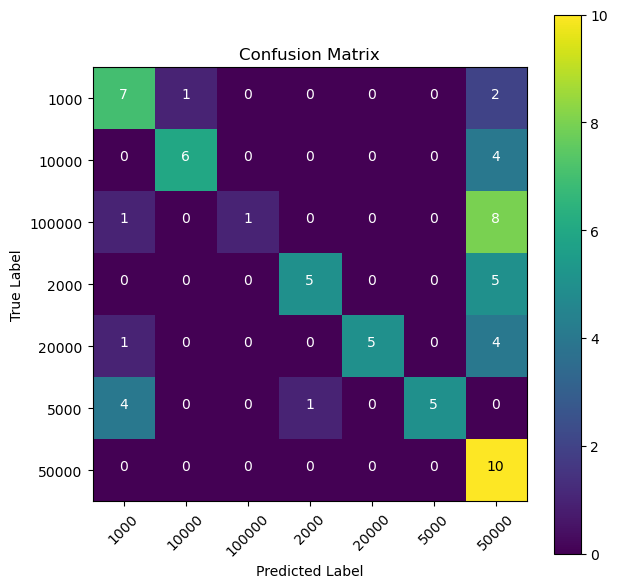

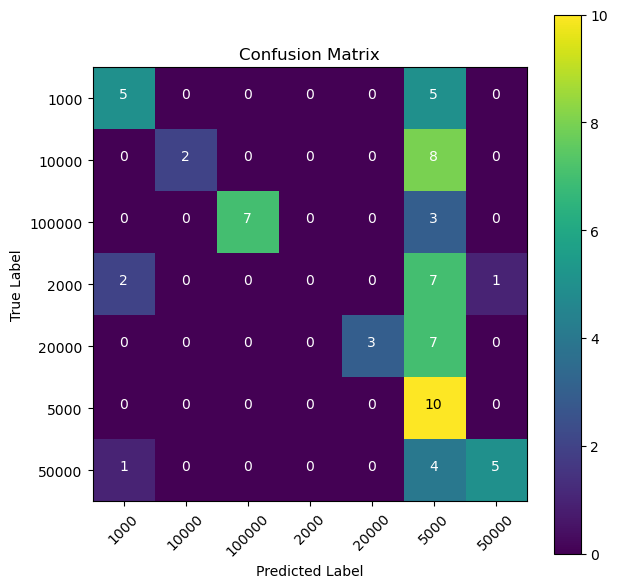

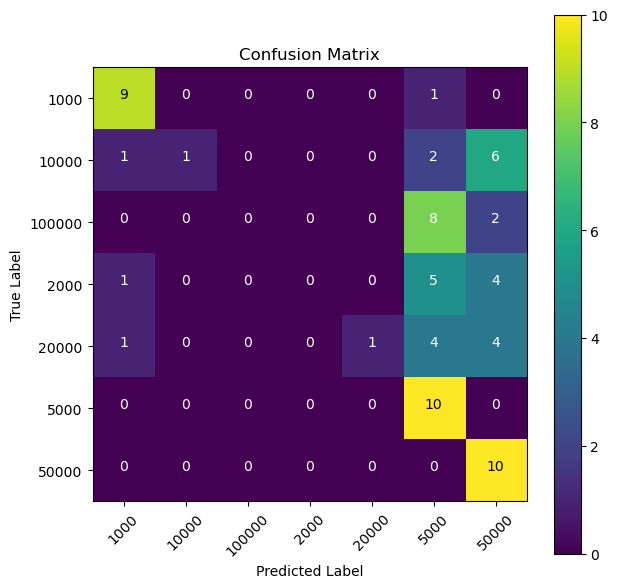

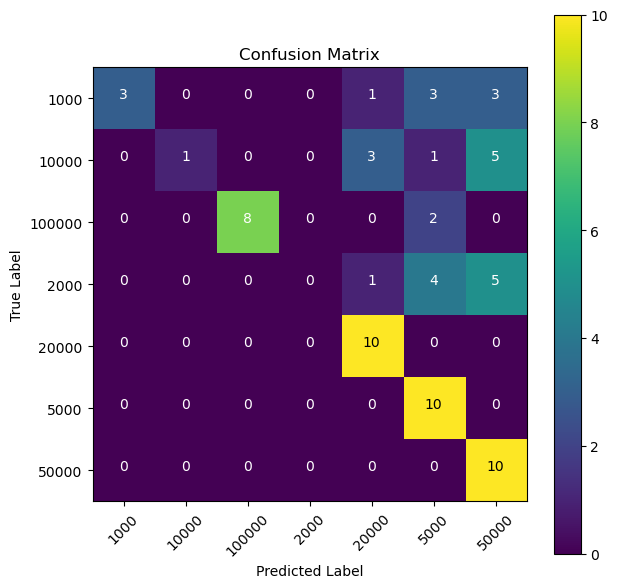

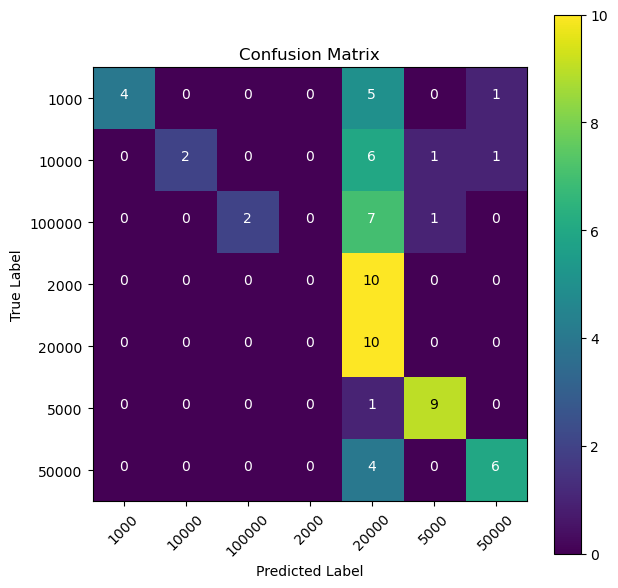

...

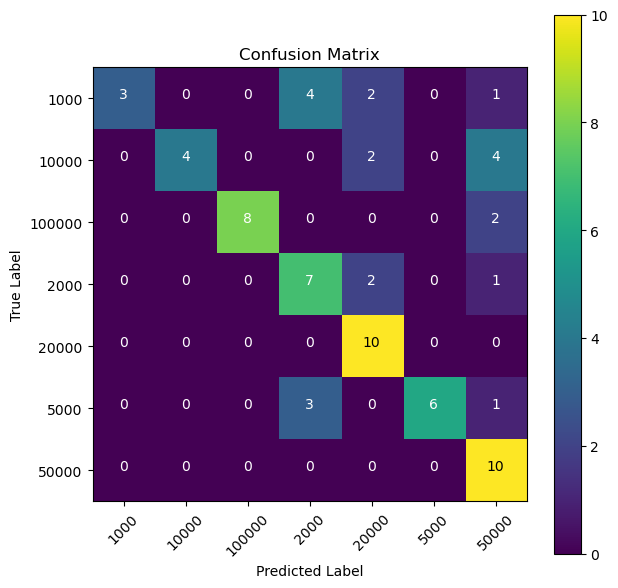

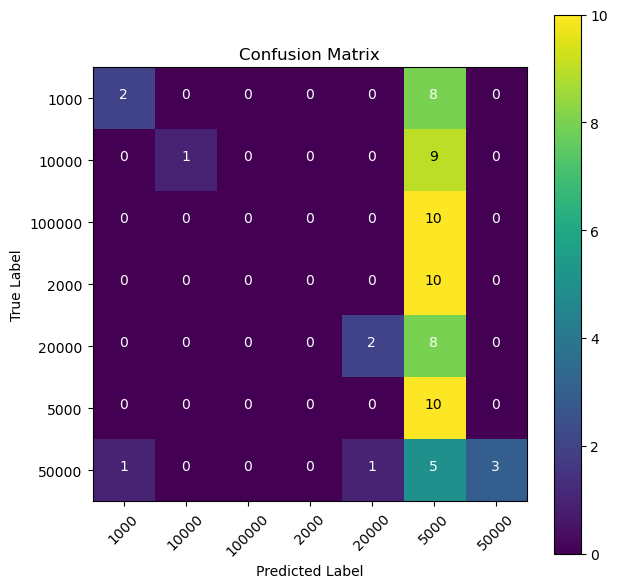

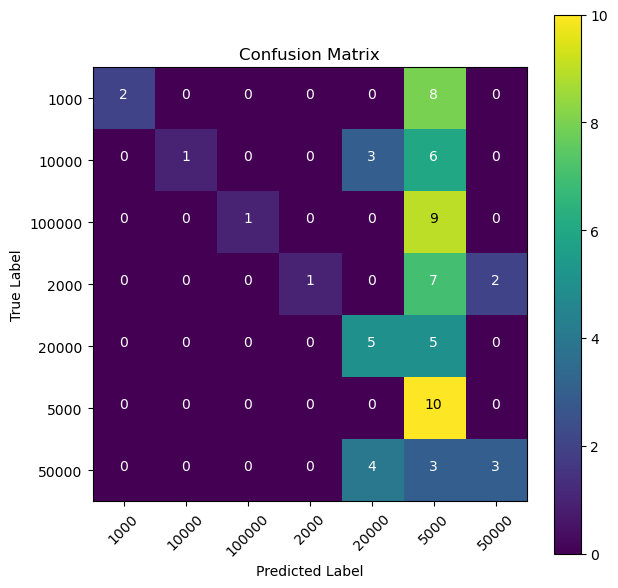

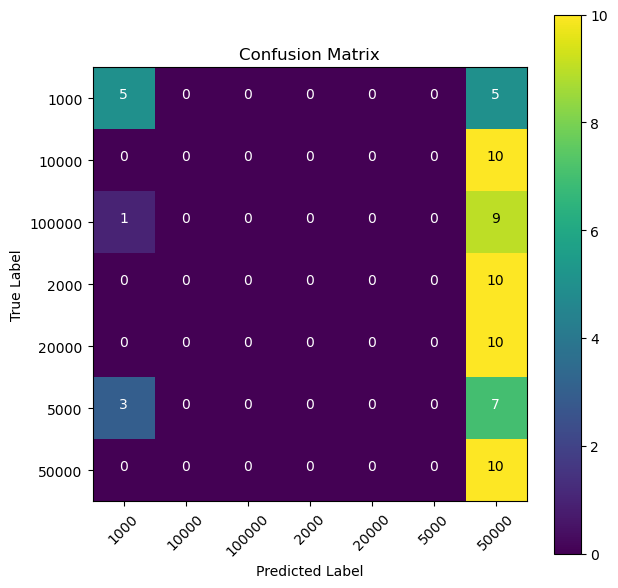

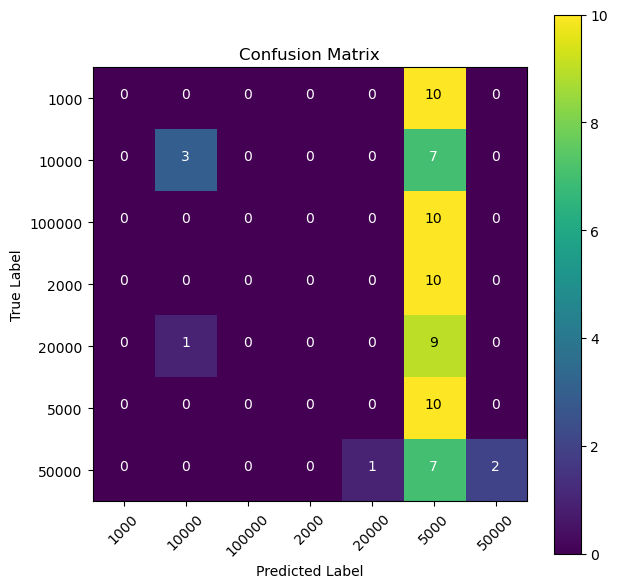

In [29]:
j = 66
for i in range (j,len(parameter)):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg19_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy19[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (j+1)
  hasilTabel.to_excel("hasilTabel.xlsx")
  print("".center(100,"─"))

In [37]:
print(arr_accuracy19)

[0.14285714285714285, 0.14285714285714285, 0.14285714285714285, 0.18571428571428572, 0.14285714285714285, 0.7285714285714285, 0.37142857142857144, 0.7857142857142857, 0.6, 0.24285714285714285]


In [53]:
# KALAU MAU INPUT MANUAL PAKAI INI AJA, PARAMETERNYA DISAMAKAN SAMA NGERUN BERAPA SAMPAI BERAPA
df = pd.DataFrame(parameter[20:30], columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate'])
df = df.rename_axis('Percobaan').rename(lambda x: x+21)
print(df)

           Epoch  Learning Rate  Batch Size  Dropout Rate
Percobaan                                                
21            38       0.047001         128      0.536721
22            33       0.025487         128      0.641397
23            30       0.025715         128      0.676696
24            35       0.042781         128      0.795595
25            37       0.068997          32      0.508742
26            30       0.053899          32      0.621849
27            37       0.066381          32      0.651471
28            38       0.060987          32      0.733100
29            37       0.073304          64      0.562163
30            36       0.070758          64      0.646642


In [38]:
import pandas as pd
def hasilTabel(parameter,arr_accuracy):
  df = pd.DataFrame(parameter, columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate'])
  df = df.rename_axis('Percobaan').rename(lambda x: x+15)
  df["Accuracy"] = arr_accuracy
  return(df)

In [30]:
result = pd.read_excel("hasilTabel.xlsx")
print(result)

     Unnamed: 0  Epoch  Learning Rate  Batch Size  Dropout Rate  Accuracy
0            67     45       0.035990          64      0.685527  0.685714
1            68     45       0.035990          64      0.685527  0.557143
2            69     40       0.046247          64      0.744693  0.457143
3            70     42       0.045770         128      0.562667  0.442857
4            71     44       0.032955         128      0.594475  0.600000
..          ...    ...            ...         ...           ...       ...
122         189     65       0.097426          64      0.756015  0.685714
123         190     62       0.080655         128      0.542716  0.257143
124         191     60       0.081755         128      0.636679  0.328571
125         192     64       0.078194         128      0.723148  0.214286
126         193     63       0.081472         128      0.740506  0.214286

[127 rows x 6 columns]


#### **<font color='Pink'>Testing</font>**

1/1 [==============================] - 0s 160ms/step
Prediksi: 20000 | Probabilitas: 0.95892084


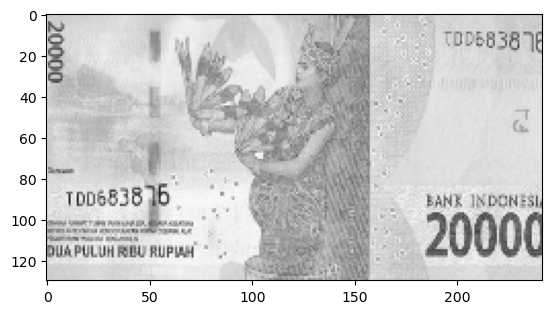

In [35]:
from tensorflow.keras.models import load_model

path = r"D:\UNAIR\Semester_8\Skripsi\Model\VGG16_NoImgPro\datasetAbu\20000/20k_b_2016_1.png"
img = cv2.resize(cv2.imread(path),(242,130))
#img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#x = imageEnhancement(img)
#x = imageSegmentation(x)
z = PIL.Image.fromarray(img)
z.save("citraUji.png")

img = cv2.imread("citraUji.png")
img_normalized = img/255

model = load_model(r"D:\UNAIR\Semester_8\Skripsi\Model\VGG19_NoImgPro\percobaan158_noImgPro\vgg19-model158.h5")

PIL.Image.fromarray(x)
vgg19_image_prediction = np.argmax(model.predict(np.array([img_normalized])))
prob = np.amax(model.predict(np.array([img_normalized])))
plt.imshow(img)
print("Prediksi:",inv_map_classes[vgg19_image_prediction],"| Probabilitas:",prob)

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
[WinError 183] Cannot create a file when that file already exists: 'percobaan1'
[WinError 183] Cannot create a file when that file already exists: 'percobaan1/model'
Percobaan ke- 1 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.3644 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.41429, saving model to percobaan1/model\vgg_19_1-saved-model-01-acc-0.41.hdf5
16/16 [==============================] - 61s 4s/step - loss: 2.3644 - acc: 0.3245 - val_loss: 1.7122 - val_acc: 0.4143
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\1157781679.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 2 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.5208 - acc: 0.2857
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan2/model\vgg_19_2-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 115s 7s/step - loss: 2.5208 - acc: 0.2857 - val_loss: 3.2999 - val_acc: 0.1571
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.5504 - acc: 0.4694
Epoch 2: val_acc improved from 0.15714 to 0.3

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\1157781679.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 3 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.4654 - acc: 0.3020
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan3/model\vgg_19_3-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 105s 6s/step - loss: 2.4654 - acc: 0.3020 - val_loss: 2.9842 - val_acc: 0.1643
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.4189 - acc: 0.5347
Epoch 2: val_acc improved from 0.16429 to 0.39286, saving model to percobaan3/model\vgg_19_3-saved-model-02-acc-0.39.hdf5
16/16 [=================

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\1157781679.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 4 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.5816 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan4/model\vgg_19_4-saved-model-01-acc-0.23.hdf5
16/16 [==============================] - 107s 6s/step - loss: 2.5816 - acc: 0.2980 - val_loss: 2.9936 - val_acc: 0.2286
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.5832 - acc: 0.4755
Epoch 2: val_acc improved from 0.22857 to 0.3

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\1157781679.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.4908 - acc: 0.3061
Epoch 1: val_acc improved from -inf to 0.27143, saving model to percobaan5/model\vgg_19_5-saved-model-01-acc-0.27.hdf5
16/16 [==============================] - 62s 4s/step - loss: 2.4908 - acc: 0.3061 - val_loss: 3.0930 - val_acc: 0.2714
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.3608 - acc: 0.5551
Epoch 2: val_acc did not improve from 0.27143
16/16 [==============================] - 53s 3s/step - loss: 1.3608 - acc: 0.5551 - val_loss: 3.2297 - val_acc: 0.1714
Epoch 3/58
16/16 [==============================] - ETA: 0s - loss: 1.1366 - acc: 0.6000
Epoch 3: val_acc improved from 0.27143 to 0.37143, saving model to percobaan5/model\vgg_19_5-saved-model-03-acc-0.37.hdf5
16/16 [==============================] - 54s 3s/step - loss: 1.1366 - acc: 0.6000 - val_loss: 1.9140 - val_acc: 0.3714
Epoch 4/58
16/16 [==============================] - ETA: 0s - loss: 0.9667 - acc: 0.6592


C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\1157781679.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


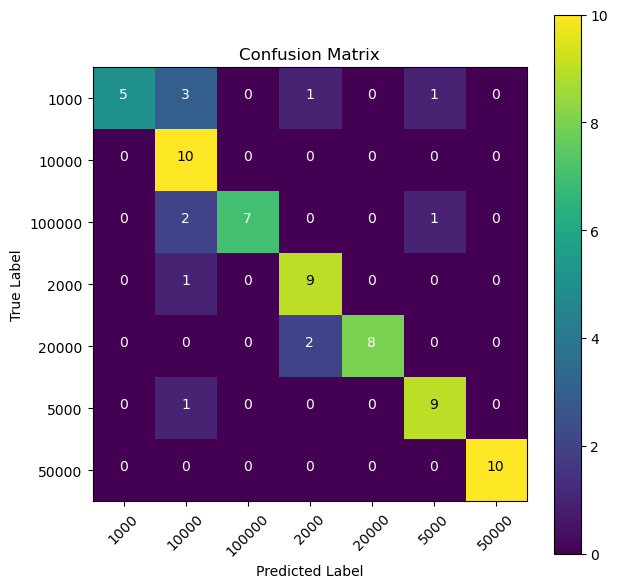

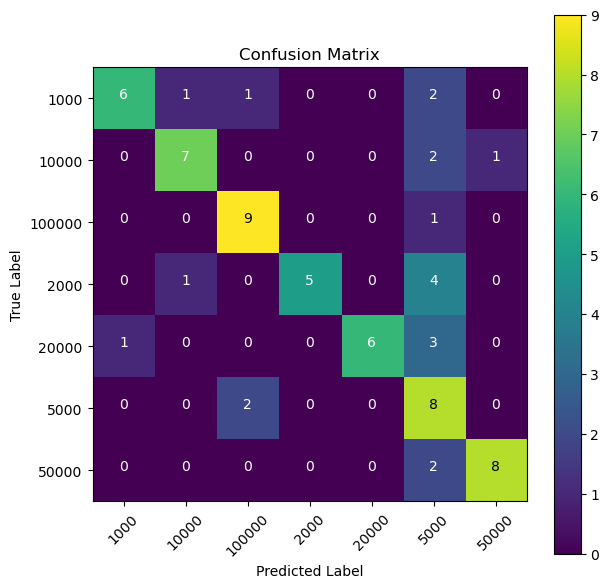

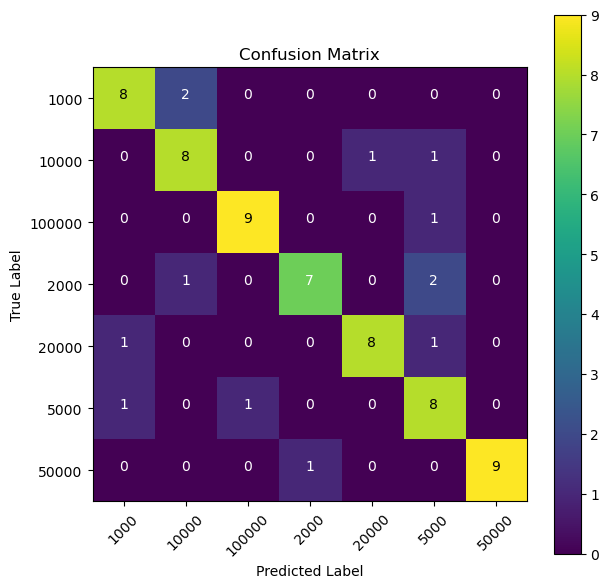

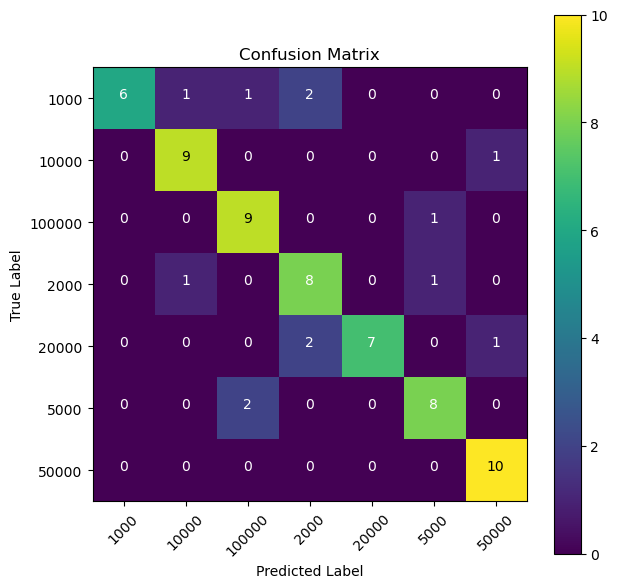

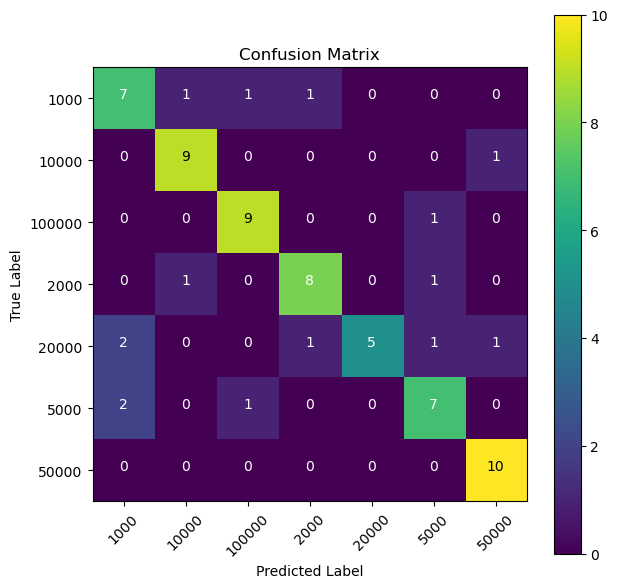

In [26]:
for i in range (0,5):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = 58
  learning_rate = 0.0149605572441936
  batch_size = 32
  dropout_rate = 0.615964365072934
  i=i+1
  dataset = "datasetSplit"+str(i)
  IMAGE_SIZE = (130, 242, 3)
  dataset="datasetSplit"
  train_pred_test_folders = os.listdir(dataset)
  train_path = dataset+'/train'
  test_path = dataset+'/test'
  val_path = dataset+'/val'

  #normalisasi
  train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  train_generator19 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

  validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

  test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  test_generator19 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
      batch_size=1,
      shuffle=True,
      class_mode='categorical')

  validation_generator19 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER VGG-19".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg19_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy19[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (i+1)
  hasilTabel.to_excel("hasilTabelRevisi.xlsx")
  print("".center(100,"─"))

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 1 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.5409 - acc: 0.2959
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan1/model\vgg_19_1-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 231s 14s/step - loss: 2.5409 - acc: 0.2959 - val_loss: 3.4380 - val_acc: 0.2357
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.3954 - acc: 0.5204
Epoch 2: val_acc improved from 0.23571 to 0.29286, saving model to percobaan1/model\vgg_19_1-saved-model-02-acc-0.29.hdf5
16/16 [================

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\3901833349.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 2 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.4301 - acc: 0.3286
Epoch 1: val_acc improved from -inf to 0.32857, saving model to percobaan2/model\vgg_19_2-saved-model-01-acc-0.33.hdf5
16/16 [==============================] - 178s 11s/step - loss: 2.4301 - acc: 0.3286 - val_loss: 3.2210 - val_acc: 0.3286
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.5230 - acc: 0.5102
Epoch 2: val_acc did not improve from 0.3285

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\3901833349.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 3 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.2752 - acc: 0.3408
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan3/model\vgg_19_3-saved-model-01-acc-0.20.hdf5
16/16 [==============================] - 196s 11s/step - loss: 2.2752 - acc: 0.3408 - val_loss: 3.2404 - val_acc: 0.2000
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.4681 - acc: 0.5184
Epoch 2: val_acc improved from 0.20000 to 0.

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\3901833349.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 4 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.5494 - acc: 0.2939
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan4/model\vgg_19_4-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 203s 11s/step - loss: 2.5494 - acc: 0.2939 - val_loss: 6.0140 - val_acc: 0.1429
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.4621 - acc: 0.5286
Epoch 2: val_acc improved from 0.14286 to 0.

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\3901833349.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 5 ↓
───────────────────────────────────────HYPERPARAMETER VGG-19────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0149605572441936
batch size: 32
dropout rate: 0.615964365072934
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
16/16 [==============================] - ETA: 0s - loss: 2.6863 - acc: 0.2449
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan5/model\vgg_19_5-saved-model-01-acc-0.17.hdf5
16/16 [==============================] - 198s 11s/step - loss: 2.6863 - acc: 0.2449 - val_loss: 3.6206 - val_acc: 0.1714
Epoch 2/58
16/16 [==============================] - ETA: 0s - loss: 1.5301 - acc: 0.4551
Epoch 2: val_acc improved from 0.17143 to 0.

C:\Users\ardin\AppData\Local\Temp\ipykernel_42380\3901833349.py:43: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


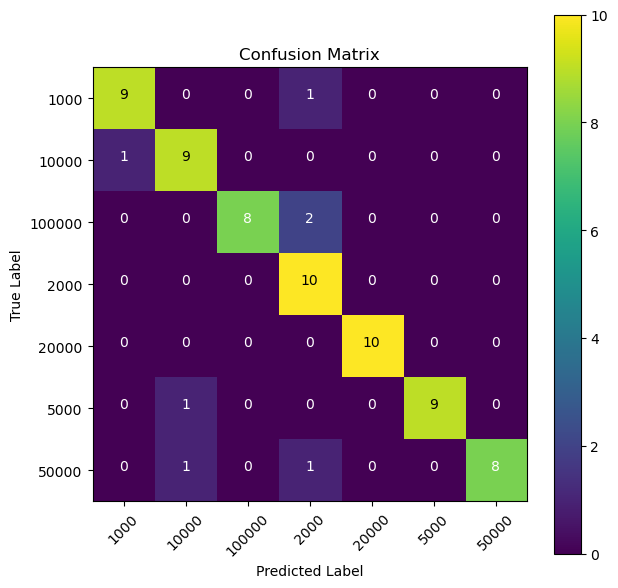

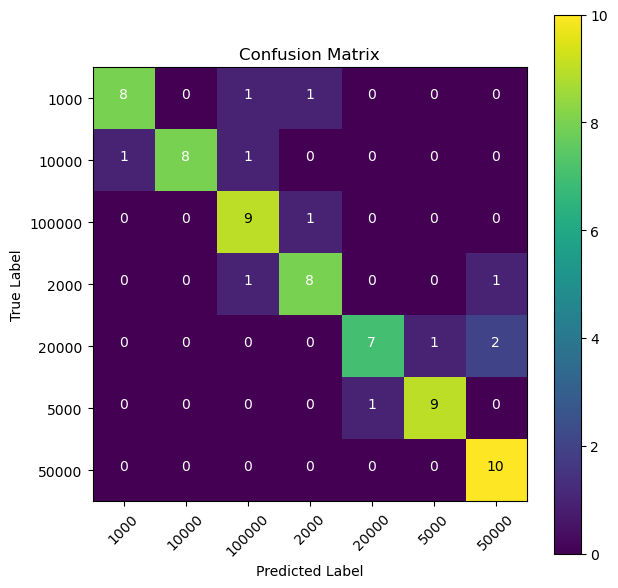

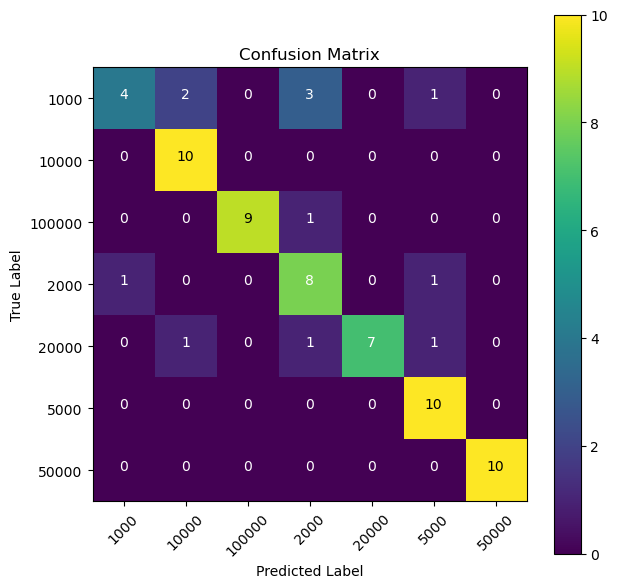

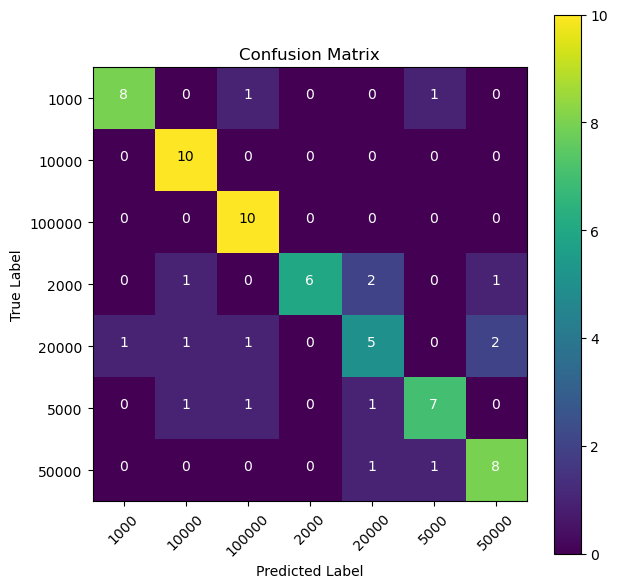

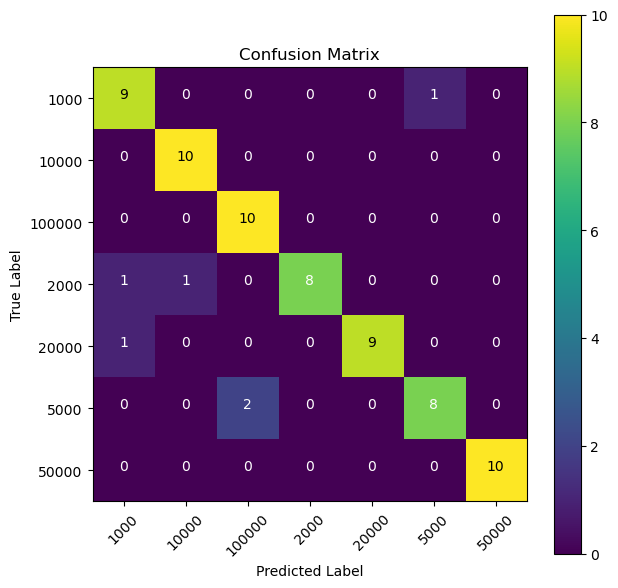

In [27]:
for i in range (0,5):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = 58
  learning_rate = 0.0149605572441936
  batch_size = 32
  dropout_rate = 0.615964365072934
  i=i+1
  dataset = r"D:\UNAIR\Semester_8\Skripsi\Model\VGG16\datasetSplit"+str(i)
  IMAGE_SIZE = (130, 242, 3)
  train_pred_test_folders = os.listdir(dataset)
  train_path = dataset+'/train'
  test_path = dataset+'/test'
  val_path = dataset+'/val'

  #normalisasi
  train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  train_generator19 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

  validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

  test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  test_generator19 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
      batch_size=1,
      shuffle=True,
      class_mode='categorical')

  validation_generator19 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER VGG-19".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg19_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy19[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (i+1)
  hasilTabel.to_excel("hasilTabelRevisi.xlsx")
  print("".center(100,"─"))